# GAN example

In [1]:
# import necessary packages

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, Flatten, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.layers import LeakyReLU, Reshape, Conv2DTranspose

import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import random

In [2]:
noise_dim = 100 

In [43]:
# creating the dataset of real images
size = 32

def create_images_vert(num):
    samples = []
    for i in range(num):
        sample = np.zeros((size,size,1))
        for _ in range(10):
            x0 = random.randrange(5,size-5)
            sample = cv2.line(sample,(x0,0),(x0,size-1),(255,255,255),1)
#         sample = cv2.GaussianBlur(sample,ksize=(5,5),sigmaX=100,sigmaY=100)
#         sample = np.expand_dims(sample,axis=2)
        samples.append(sample)
    return samples

def create_images_diag(num):
    samples = []
    for i in range(num):
        sample = np.zeros((size,size,1))
        for _ in range(3):
            x0 = random.randrange(-size/2,size/2)
            sample = cv2.line(sample,(x0,0),(x0+32,32),(255,255,255),2)
        sample = cv2.GaussianBlur(sample,ksize=(5,5),sigmaX=100,sigmaY=100)
        sample = np.expand_dims(sample,axis=2)
        samples.append(sample)
    return samples

def load_images(dir):
    samples = []
    for image_file in os.listdir(dir):
        if image_file.endswith("jpg"):
            sample = cv2.imread(f"{dir}/{image_file}")
            sample = cv2.resize(sample, (32,32))
            sample = cv2.cvtColor(sample, cv2.COLOR_BGR2GRAY)
            sample = np.expand_dims(sample,axis=2)
            samples.append(sample)
    return samples

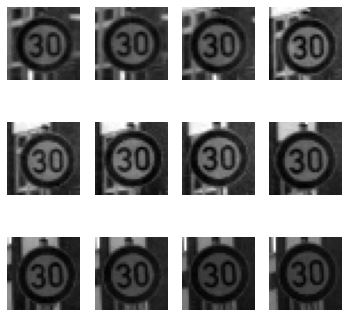

In [44]:
#samples = create_images_diag(1000)
#samples = create_images_vert(1000)
samples = load_images('signs')
samples = np.array(samples)
samples = samples/255

plt.figure(figsize=(6, 6))
for i in range(12):
    ax = plt.subplot(3, 4, i + 1)
    plt.imshow(samples[i][:,:,0],cmap='gray')
    #plt.title(labels[i])
    plt.axis("off")

In [45]:
# Generator gets a noise vector of size noise_dim and generates an image of size (32 x 32 x 1)
# Our aim: we want the image to be as similar to real images (generated above) as possible

def make_generator_model():
    model = Sequential()
    model.add(Dense(8*8*256, use_bias=False, input_shape=(noise_dim,)))
    model.add(BatchNormalization())
    model.add(LeakyReLU())

    model.add(Reshape((8, 8, 256)))

    model.add(Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False)) 
    #model.add(Conv2DTranspose(128, (3, 3), strides=(1, 1), padding='same', use_bias=False)) 
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    #model.add(Dropout(0.3))
    # output: 8 x 8 x 128

    
    model.add(Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    #model.add(Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', use_bias=False))
    model.add(BatchNormalization())
    model.add(LeakyReLU())
    #model.add(Dropout(0.3))
    # output: 16 x 16 x 64

    model.add(Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='sigmoid'))
    #model.add(Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    #model.add(Conv2DTranspose(1, (3, 3), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    # output: 32 x 32 x 1 (our image)

    model.summary()
    return model

generator = make_generator_model()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 16384)             1638400   
_________________________________________________________________
batch_normalization_9 (Batch (None, 16384)             65536     
_________________________________________________________________
leaky_re_lu_15 (LeakyReLU)   (None, 16384)             0         
_________________________________________________________________
reshape_3 (Reshape)          (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose_9 (Conv2DTr (None, 8, 8, 128)         819200    
_________________________________________________________________
batch_normalization_10 (Batc (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_16 (LeakyReLU)   (None, 8, 8, 128)        

In [46]:
# Discriminator gets image of size (32 x 32 x 1) and decides if it is real or fake
# The result of the discriminator is used by generator to improve 'faking'

def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 1]))
    model.add(LeakyReLU())
    model.add(Dropout(0.3))

    model.add(Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(LeakyReLU())
    model.add(Dropout(0.3))

    model.add(Flatten())
    model.add(Dense(1,activation='sigmoid'))
    #model.add(Dense(1))
    # output: one number 0-fake, 1-real
    model.summary()

    return model

discriminator = make_discriminator_model()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 16, 16, 64)        1664      
_________________________________________________________________
leaky_re_lu_18 (LeakyReLU)   (None, 16, 16, 64)        0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_19 (LeakyReLU)   (None, 8, 8, 128)         0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 8, 8, 128)         0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 8192)             

In [39]:
# returns randomly choosen n samples

def sample_from_dataset(n,samples):
    prev_numbers = []
    new_samples = []
    while len(new_samples)<n:
        number = random.randrange(len(samples))
        if number in prev_numbers: continue
        prev_numbers.append(number)
        new_samples.append(samples[number])
    new_samples = np.array(new_samples,dtype=float)    

    return new_samples

In [47]:
# training parameters
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)
#cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
cross_entropy = tf.keras.losses.BinaryCrossentropy()


In [56]:
from numpy.random import randn

def calc_ok(vct):
    ok = 0
    for x in vct: 
        if x>=0.5: 
            ok+=1 
    return ok

# The training step

#history = []
##@tf.function
def do_step(images):
    batch_size = len(images)
    images = np.array(images)
    # create random noise for generator
    input_noise = randn(batch_size * noise_dim)
    input_noise = input_noise.reshape(batch_size, noise_dim)
    input_noise = tf.convert_to_tensor(input_noise)
    #noise = tf.random.normal([batch_size, noise_dim])
    
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # generate fake image using noise
        generated_images = generator(input_noise, training=True)
        # evaluate fake images
        fake_output = discriminator(generated_images, training=True)
        fake_acc = (batch_size-calc_ok(fake_output))/batch_size
        # generator want all images to be accepted (output=1)!
        gen_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
        
        # evaluate real images
        real_output = discriminator(images, training=True)
        real_acc = calc_ok(real_output)/batch_size
        # discriminator wants to classify all real images as 1 and fake images as 0
        real_loss = cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
        disc_loss = real_loss + fake_loss # sum up both losses

    # calculate how to change generator to minimze its loss
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables) # step 4. calculate the gradient of the losses
    # calculate how to change discriminator to minimze its loss
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # update weights for both networks
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables)) # step 5. Apply the optimizers and update weights
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    print("Epoch",epoch+4000,'g_loss=',gen_loss.numpy(),'d_loss=',disc_loss.numpy(),"real_acc=",real_acc,"fake_acc=",fake_acc)
    history.append([gen_loss.numpy(),disc_loss.numpy(),real_acc,fake_acc])
    

Epoch 4000 g_loss= 0.711278 d_loss= 1.4291675 real_acc= 0.58 fake_acc= 0.46


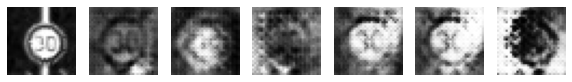

Epoch 4001 g_loss= 0.7640476 d_loss= 1.4417951 real_acc= 0.54 fake_acc= 0.5
Epoch 4002 g_loss= 0.8068807 d_loss= 1.4176152 real_acc= 0.54 fake_acc= 0.66
Epoch 4003 g_loss= 0.78672105 d_loss= 1.3863904 real_acc= 0.56 fake_acc= 0.58
Epoch 4004 g_loss= 0.79795176 d_loss= 1.4109955 real_acc= 0.48 fake_acc= 0.54
Epoch 4005 g_loss= 0.73968905 d_loss= 1.4654791 real_acc= 0.56 fake_acc= 0.5
Epoch 4006 g_loss= 0.7158122 d_loss= 1.4617636 real_acc= 0.5 fake_acc= 0.44
Epoch 4007 g_loss= 0.71151084 d_loss= 1.4056227 real_acc= 0.62 fake_acc= 0.4
Epoch 4008 g_loss= 0.67221063 d_loss= 1.457272 real_acc= 0.62 fake_acc= 0.32
Epoch 4009 g_loss= 0.67438203 d_loss= 1.4495151 real_acc= 0.66 fake_acc= 0.38
Epoch 4010 g_loss= 0.69609535 d_loss= 1.3926839 real_acc= 0.66 fake_acc= 0.38


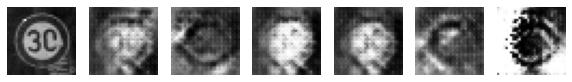

Epoch 4011 g_loss= 0.73080033 d_loss= 1.4539154 real_acc= 0.6 fake_acc= 0.48
Epoch 4012 g_loss= 0.7135118 d_loss= 1.3575108 real_acc= 0.74 fake_acc= 0.42
Epoch 4013 g_loss= 0.7570919 d_loss= 1.436743 real_acc= 0.64 fake_acc= 0.46
Epoch 4014 g_loss= 0.8328176 d_loss= 1.3755074 real_acc= 0.58 fake_acc= 0.6
Epoch 4015 g_loss= 0.8575061 d_loss= 1.3515791 real_acc= 0.52 fake_acc= 0.66
Epoch 4016 g_loss= 0.82851374 d_loss= 1.3958414 real_acc= 0.6 fake_acc= 0.56
Epoch 4017 g_loss= 0.8043456 d_loss= 1.3805137 real_acc= 0.5 fake_acc= 0.54
Epoch 4018 g_loss= 0.82472396 d_loss= 1.360487 real_acc= 0.58 fake_acc= 0.6
Epoch 4019 g_loss= 0.78276926 d_loss= 1.3433738 real_acc= 0.66 fake_acc= 0.62
Epoch 4020 g_loss= 0.709644 d_loss= 1.4308705 real_acc= 0.66 fake_acc= 0.4


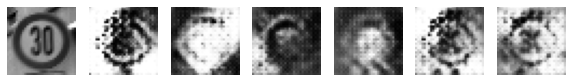

Epoch 4021 g_loss= 0.6783181 d_loss= 1.3755195 real_acc= 0.7 fake_acc= 0.42
Epoch 4022 g_loss= 0.667994 d_loss= 1.3144773 real_acc= 0.86 fake_acc= 0.42
Epoch 4023 g_loss= 0.73229796 d_loss= 1.2780199 real_acc= 0.84 fake_acc= 0.52
Epoch 4024 g_loss= 0.68075424 d_loss= 1.3589406 real_acc= 0.76 fake_acc= 0.38
Epoch 4025 g_loss= 0.71338356 d_loss= 1.3220191 real_acc= 0.88 fake_acc= 0.42
Epoch 4026 g_loss= 0.8141025 d_loss= 1.3507409 real_acc= 0.52 fake_acc= 0.58
Epoch 4027 g_loss= 0.88456273 d_loss= 1.4045517 real_acc= 0.4 fake_acc= 0.64
Epoch 4028 g_loss= 0.8592712 d_loss= 1.4373305 real_acc= 0.44 fake_acc= 0.58
Epoch 4029 g_loss= 0.9101408 d_loss= 1.2949739 real_acc= 0.58 fake_acc= 0.74
Epoch 4030 g_loss= 0.82633585 d_loss= 1.3214288 real_acc= 0.56 fake_acc= 0.58


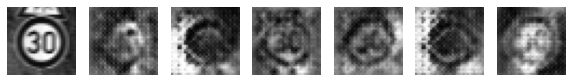

Epoch 4031 g_loss= 0.79766744 d_loss= 1.2523104 real_acc= 0.7 fake_acc= 0.6
Epoch 4032 g_loss= 0.68070984 d_loss= 1.288327 real_acc= 0.82 fake_acc= 0.46
Epoch 4033 g_loss= 0.6686721 d_loss= 1.2968925 real_acc= 0.9 fake_acc= 0.4
Epoch 4034 g_loss= 0.7238717 d_loss= 1.2366271 real_acc= 0.86 fake_acc= 0.52
Epoch 4035 g_loss= 0.72941834 d_loss= 1.2602477 real_acc= 0.84 fake_acc= 0.42
Epoch 4036 g_loss= 0.76769227 d_loss= 1.231931 real_acc= 0.78 fake_acc= 0.56
Epoch 4037 g_loss= 0.77649033 d_loss= 1.3359001 real_acc= 0.56 fake_acc= 0.56
Epoch 4038 g_loss= 0.83772105 d_loss= 1.3076719 real_acc= 0.64 fake_acc= 0.68
Epoch 4039 g_loss= 0.87551355 d_loss= 1.261416 real_acc= 0.6 fake_acc= 0.6
Epoch 4040 g_loss= 0.8334504 d_loss= 1.283745 real_acc= 0.7 fake_acc= 0.6


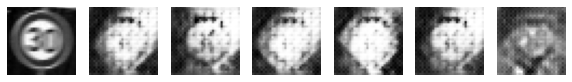

Epoch 4041 g_loss= 0.8869943 d_loss= 1.2312818 real_acc= 0.6 fake_acc= 0.74
Epoch 4042 g_loss= 0.8025331 d_loss= 1.2518256 real_acc= 0.68 fake_acc= 0.66
Epoch 4043 g_loss= 0.7057221 d_loss= 1.26575 real_acc= 0.84 fake_acc= 0.46
Epoch 4044 g_loss= 0.70759463 d_loss= 1.299587 real_acc= 0.82 fake_acc= 0.5
Epoch 4045 g_loss= 0.7392334 d_loss= 1.249887 real_acc= 0.78 fake_acc= 0.52
Epoch 4046 g_loss= 0.7688485 d_loss= 1.2176585 real_acc= 0.74 fake_acc= 0.62
Epoch 4047 g_loss= 0.7844015 d_loss= 1.2649981 real_acc= 0.66 fake_acc= 0.6
Epoch 4048 g_loss= 0.7532953 d_loss= 1.2622504 real_acc= 0.76 fake_acc= 0.6
Epoch 4049 g_loss= 0.81677467 d_loss= 1.2582645 real_acc= 0.7 fake_acc= 0.62
Epoch 4050 g_loss= 0.8412979 d_loss= 1.2987735 real_acc= 0.56 fake_acc= 0.64


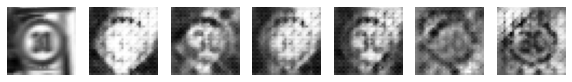

Epoch 4051 g_loss= 0.86907387 d_loss= 1.2910025 real_acc= 0.58 fake_acc= 0.76
Epoch 4052 g_loss= 0.81063646 d_loss= 1.268487 real_acc= 0.7 fake_acc= 0.6
Epoch 4053 g_loss= 0.7749633 d_loss= 1.3305312 real_acc= 0.52 fake_acc= 0.6
Epoch 4054 g_loss= 0.7827909 d_loss= 1.2065157 real_acc= 0.78 fake_acc= 0.56
Epoch 4055 g_loss= 0.7493218 d_loss= 1.2657044 real_acc= 0.68 fake_acc= 0.6
Epoch 4056 g_loss= 0.7744081 d_loss= 1.2587115 real_acc= 0.72 fake_acc= 0.54
Epoch 4057 g_loss= 0.7787663 d_loss= 1.1897199 real_acc= 0.74 fake_acc= 0.66
Epoch 4058 g_loss= 0.8235823 d_loss= 1.2276378 real_acc= 0.64 fake_acc= 0.7
Epoch 4059 g_loss= 0.8119212 d_loss= 1.3419236 real_acc= 0.36 fake_acc= 0.68
Epoch 4060 g_loss= 0.90281904 d_loss= 1.2585862 real_acc= 0.62 fake_acc= 0.86


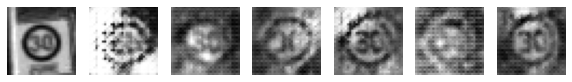

Epoch 4061 g_loss= 0.9020524 d_loss= 1.294869 real_acc= 0.48 fake_acc= 0.76
Epoch 4062 g_loss= 0.8865302 d_loss= 1.3295206 real_acc= 0.4 fake_acc= 0.82
Epoch 4063 g_loss= 0.76268363 d_loss= 1.3287039 real_acc= 0.56 fake_acc= 0.6
Epoch 4064 g_loss= 0.7270042 d_loss= 1.3344278 real_acc= 0.66 fake_acc= 0.48
Epoch 4065 g_loss= 0.7110113 d_loss= 1.3186724 real_acc= 0.68 fake_acc= 0.48
Epoch 4066 g_loss= 0.6804103 d_loss= 1.3148117 real_acc= 0.76 fake_acc= 0.4
Epoch 4067 g_loss= 0.7790991 d_loss= 1.2884405 real_acc= 0.74 fake_acc= 0.56
Epoch 4068 g_loss= 0.79217803 d_loss= 1.2343736 real_acc= 0.76 fake_acc= 0.68
Epoch 4069 g_loss= 0.91312116 d_loss= 1.2303866 real_acc= 0.6 fake_acc= 0.86
Epoch 4070 g_loss= 0.90763944 d_loss= 1.3080218 real_acc= 0.54 fake_acc= 0.9


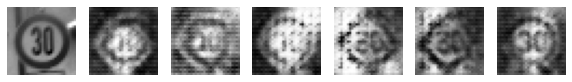

Epoch 4071 g_loss= 0.9615482 d_loss= 1.3628595 real_acc= 0.34 fake_acc= 0.9
Epoch 4072 g_loss= 0.87008184 d_loss= 1.3149626 real_acc= 0.56 fake_acc= 0.86
Epoch 4073 g_loss= 0.82694674 d_loss= 1.2868094 real_acc= 0.7 fake_acc= 0.8
Epoch 4074 g_loss= 0.74637383 d_loss= 1.2397053 real_acc= 0.88 fake_acc= 0.64
Epoch 4075 g_loss= 0.7829671 d_loss= 1.2435765 real_acc= 0.74 fake_acc= 0.66
Epoch 4076 g_loss= 0.7326612 d_loss= 1.2438914 real_acc= 0.76 fake_acc= 0.6
Epoch 4077 g_loss= 0.7210253 d_loss= 1.2648141 real_acc= 0.72 fake_acc= 0.5
Epoch 4078 g_loss= 0.7663201 d_loss= 1.2772439 real_acc= 0.74 fake_acc= 0.72
Epoch 4079 g_loss= 0.83446467 d_loss= 1.167632 real_acc= 0.74 fake_acc= 0.68
Epoch 4080 g_loss= 0.90604943 d_loss= 1.2353606 real_acc= 0.56 fake_acc= 0.86


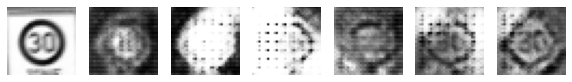

Epoch 4081 g_loss= 0.99071765 d_loss= 1.1216943 real_acc= 0.62 fake_acc= 0.94
Epoch 4082 g_loss= 0.9913056 d_loss= 1.2500198 real_acc= 0.48 fake_acc= 0.96
Epoch 4083 g_loss= 0.97277725 d_loss= 1.1595985 real_acc= 0.62 fake_acc= 0.9
Epoch 4084 g_loss= 0.9456369 d_loss= 1.1859837 real_acc= 0.6 fake_acc= 0.9
Epoch 4085 g_loss= 0.95119226 d_loss= 1.1629949 real_acc= 0.68 fake_acc= 0.88
Epoch 4086 g_loss= 0.884171 d_loss= 1.1485031 real_acc= 0.72 fake_acc= 0.82
Epoch 4087 g_loss= 0.86748236 d_loss= 1.1108627 real_acc= 0.86 fake_acc= 0.76
Epoch 4088 g_loss= 0.8272184 d_loss= 1.1768844 real_acc= 0.76 fake_acc= 0.7
Epoch 4089 g_loss= 0.85061675 d_loss= 1.1098982 real_acc= 0.82 fake_acc= 0.74
Epoch 4090 g_loss= 0.92196965 d_loss= 1.0845106 real_acc= 0.8 fake_acc= 0.9


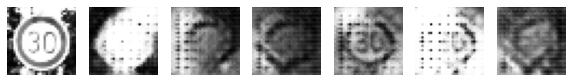

Epoch 4091 g_loss= 0.92151934 d_loss= 1.1408322 real_acc= 0.76 fake_acc= 0.82
Epoch 4092 g_loss= 0.97300905 d_loss= 1.1228857 real_acc= 0.64 fake_acc= 0.84
Epoch 4093 g_loss= 0.9917109 d_loss= 1.1346405 real_acc= 0.7 fake_acc= 0.82
Epoch 4094 g_loss= 0.9517779 d_loss= 1.096195 real_acc= 0.8 fake_acc= 0.78
Epoch 4095 g_loss= 0.9739153 d_loss= 1.103509 real_acc= 0.78 fake_acc= 0.86
Epoch 4096 g_loss= 0.9485013 d_loss= 1.0878599 real_acc= 0.84 fake_acc= 0.78
Epoch 4097 g_loss= 0.953069 d_loss= 1.1286409 real_acc= 0.76 fake_acc= 0.78
Epoch 4098 g_loss= 0.98016065 d_loss= 1.1279736 real_acc= 0.78 fake_acc= 0.66
Epoch 4099 g_loss= 0.950491 d_loss= 1.1793427 real_acc= 0.58 fake_acc= 0.68
Epoch 4100 g_loss= 0.8499359 d_loss= 1.2744179 real_acc= 0.6 fake_acc= 0.56


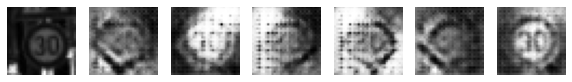

Epoch 4101 g_loss= 0.8101509 d_loss= 1.169796 real_acc= 0.76 fake_acc= 0.5
Epoch 4102 g_loss= 0.7553433 d_loss= 1.193089 real_acc= 0.86 fake_acc= 0.42
Epoch 4103 g_loss= 0.7590785 d_loss= 1.241916 real_acc= 0.74 fake_acc= 0.42
Epoch 4104 g_loss= 0.808396 d_loss= 1.2419758 real_acc= 0.58 fake_acc= 0.54
Epoch 4105 g_loss= 0.7621605 d_loss= 1.2753134 real_acc= 0.72 fake_acc= 0.4
Epoch 4106 g_loss= 0.8324182 d_loss= 1.2721801 real_acc= 0.66 fake_acc= 0.54
Epoch 4107 g_loss= 0.83502847 d_loss= 1.2567033 real_acc= 0.68 fake_acc= 0.6
Epoch 4108 g_loss= 0.8530491 d_loss= 1.3100847 real_acc= 0.58 fake_acc= 0.52
Epoch 4109 g_loss= 0.85992736 d_loss= 1.3327053 real_acc= 0.54 fake_acc= 0.5
Epoch 4110 g_loss= 0.7900063 d_loss= 1.3204896 real_acc= 0.68 fake_acc= 0.54


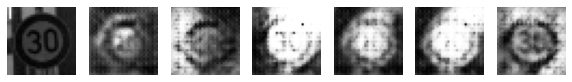

Epoch 4111 g_loss= 0.7501843 d_loss= 1.3199427 real_acc= 0.66 fake_acc= 0.44
Epoch 4112 g_loss= 0.71244067 d_loss= 1.3037714 real_acc= 0.7 fake_acc= 0.4
Epoch 4113 g_loss= 0.7189704 d_loss= 1.3457541 real_acc= 0.64 fake_acc= 0.42
Epoch 4114 g_loss= 0.67376226 d_loss= 1.3384092 real_acc= 0.74 fake_acc= 0.42
Epoch 4115 g_loss= 0.7109413 d_loss= 1.3970219 real_acc= 0.6 fake_acc= 0.4
Epoch 4116 g_loss= 0.7003155 d_loss= 1.4197285 real_acc= 0.6 fake_acc= 0.4
Epoch 4117 g_loss= 0.71807694 d_loss= 1.4980297 real_acc= 0.44 fake_acc= 0.46
Epoch 4118 g_loss= 0.73993826 d_loss= 1.4191504 real_acc= 0.5 fake_acc= 0.42
Epoch 4119 g_loss= 0.6843307 d_loss= 1.4094554 real_acc= 0.6 fake_acc= 0.4
Epoch 4120 g_loss= 0.6809914 d_loss= 1.5756218 real_acc= 0.46 fake_acc= 0.36


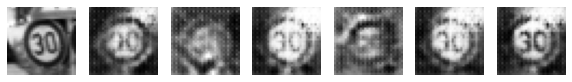

Epoch 4121 g_loss= 0.62901676 d_loss= 1.5094167 real_acc= 0.54 fake_acc= 0.26
Epoch 4122 g_loss= 0.6004383 d_loss= 1.5791008 real_acc= 0.44 fake_acc= 0.28
Epoch 4123 g_loss= 0.55357695 d_loss= 1.5671835 real_acc= 0.54 fake_acc= 0.16
Epoch 4124 g_loss= 0.58612615 d_loss= 1.5252519 real_acc= 0.56 fake_acc= 0.2
Epoch 4125 g_loss= 0.57038504 d_loss= 1.5703712 real_acc= 0.52 fake_acc= 0.22
Epoch 4126 g_loss= 0.60393345 d_loss= 1.6365137 real_acc= 0.36 fake_acc= 0.3
Epoch 4127 g_loss= 0.6995184 d_loss= 1.5219052 real_acc= 0.46 fake_acc= 0.38
Epoch 4128 g_loss= 0.7356679 d_loss= 1.5127411 real_acc= 0.42 fake_acc= 0.42
Epoch 4129 g_loss= 0.67665297 d_loss= 1.5551032 real_acc= 0.48 fake_acc= 0.4
Epoch 4130 g_loss= 0.6571767 d_loss= 1.5976026 real_acc= 0.36 fake_acc= 0.26


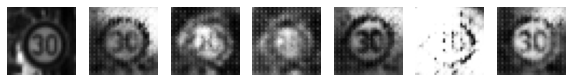

Epoch 4131 g_loss= 0.5691108 d_loss= 1.7212455 real_acc= 0.22 fake_acc= 0.16
Epoch 4132 g_loss= 0.5275438 d_loss= 1.7435833 real_acc= 0.42 fake_acc= 0.06
Epoch 4133 g_loss= 0.5434447 d_loss= 1.636059 real_acc= 0.44 fake_acc= 0.12
Epoch 4134 g_loss= 0.5393454 d_loss= 1.5695429 real_acc= 0.56 fake_acc= 0.08
Epoch 4135 g_loss= 0.53733313 d_loss= 1.6325173 real_acc= 0.38 fake_acc= 0.14
Epoch 4136 g_loss= 0.5517931 d_loss= 1.5717697 real_acc= 0.52 fake_acc= 0.18
Epoch 4137 g_loss= 0.59596735 d_loss= 1.6277258 real_acc= 0.42 fake_acc= 0.16
Epoch 4138 g_loss= 0.6439596 d_loss= 1.6027927 real_acc= 0.34 fake_acc= 0.34
Epoch 4139 g_loss= 0.63698596 d_loss= 1.5608387 real_acc= 0.38 fake_acc= 0.26
Epoch 4140 g_loss= 0.6642968 d_loss= 1.5080764 real_acc= 0.42 fake_acc= 0.44


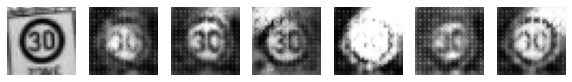

Epoch 4141 g_loss= 0.6611432 d_loss= 1.5344405 real_acc= 0.34 fake_acc= 0.36
Epoch 4142 g_loss= 0.7019233 d_loss= 1.5439239 real_acc= 0.3 fake_acc= 0.52
Epoch 4143 g_loss= 0.7030923 d_loss= 1.5555089 real_acc= 0.34 fake_acc= 0.5
Epoch 4144 g_loss= 0.6945177 d_loss= 1.5160577 real_acc= 0.46 fake_acc= 0.54
Epoch 4145 g_loss= 0.6997664 d_loss= 1.4844954 real_acc= 0.44 fake_acc= 0.52
Epoch 4146 g_loss= 0.69361913 d_loss= 1.4824979 real_acc= 0.4 fake_acc= 0.5
Epoch 4147 g_loss= 0.71360344 d_loss= 1.3748877 real_acc= 0.58 fake_acc= 0.6
Epoch 4148 g_loss= 0.7236025 d_loss= 1.3726826 real_acc= 0.56 fake_acc= 0.6
Epoch 4149 g_loss= 0.7028441 d_loss= 1.4366417 real_acc= 0.48 fake_acc= 0.46
Epoch 4150 g_loss= 0.74474037 d_loss= 1.3457587 real_acc= 0.62 fake_acc= 0.68


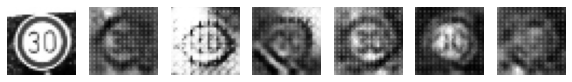

Epoch 4151 g_loss= 0.7324612 d_loss= 1.3284562 real_acc= 0.62 fake_acc= 0.56
Epoch 4152 g_loss= 0.76120865 d_loss= 1.2576292 real_acc= 0.72 fake_acc= 0.7
Epoch 4153 g_loss= 0.80382174 d_loss= 1.2352504 real_acc= 0.76 fake_acc= 0.8
Epoch 4154 g_loss= 0.83554244 d_loss= 1.1856791 real_acc= 0.74 fake_acc= 0.94
Epoch 4155 g_loss= 0.82862914 d_loss= 1.1880107 real_acc= 0.72 fake_acc= 0.86
Epoch 4156 g_loss= 0.92356354 d_loss= 1.186509 real_acc= 0.64 fake_acc= 0.96
Epoch 4157 g_loss= 0.97222763 d_loss= 1.1957003 real_acc= 0.58 fake_acc= 0.98
Epoch 4158 g_loss= 0.95895696 d_loss= 1.1480052 real_acc= 0.66 fake_acc= 0.98
Epoch 4159 g_loss= 0.96524763 d_loss= 1.1295075 real_acc= 0.66 fake_acc= 0.98
Epoch 4160 g_loss= 0.94273025 d_loss= 1.1045146 real_acc= 0.76 fake_acc= 0.98


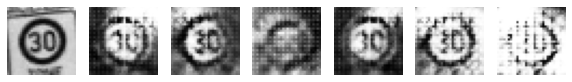

Epoch 4161 g_loss= 0.8859304 d_loss= 1.0898621 real_acc= 0.88 fake_acc= 0.9
Epoch 4162 g_loss= 0.8699112 d_loss= 1.0886356 real_acc= 0.9 fake_acc= 0.94
Epoch 4163 g_loss= 0.9946567 d_loss= 1.0206158 real_acc= 0.84 fake_acc= 0.9
Epoch 4164 g_loss= 0.94785005 d_loss= 1.0220095 real_acc= 0.84 fake_acc= 0.96
Epoch 4165 g_loss= 0.94356054 d_loss= 1.0420614 real_acc= 0.86 fake_acc= 0.94
Epoch 4166 g_loss= 1.0416499 d_loss= 0.9581249 real_acc= 0.84 fake_acc= 1.0
Epoch 4167 g_loss= 1.0433345 d_loss= 1.0087887 real_acc= 0.82 fake_acc= 1.0
Epoch 4168 g_loss= 1.1638447 d_loss= 0.9616427 real_acc= 0.78 fake_acc= 0.98
Epoch 4169 g_loss= 1.037837 d_loss= 1.0008408 real_acc= 0.88 fake_acc= 0.92
Epoch 4170 g_loss= 1.1085802 d_loss= 0.9913013 real_acc= 0.76 fake_acc= 1.0


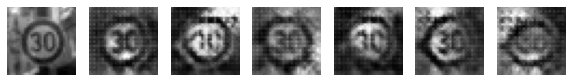

Epoch 4171 g_loss= 0.956772 d_loss= 1.0627117 real_acc= 0.84 fake_acc= 0.92
Epoch 4172 g_loss= 1.1797501 d_loss= 0.9566865 real_acc= 0.86 fake_acc= 0.96
Epoch 4173 g_loss= 1.0723802 d_loss= 1.0012193 real_acc= 0.84 fake_acc= 0.96
Epoch 4174 g_loss= 0.92233473 d_loss= 1.0997081 real_acc= 0.82 fake_acc= 0.84
Epoch 4175 g_loss= 0.9418338 d_loss= 1.0441861 real_acc= 0.88 fake_acc= 0.86
Epoch 4176 g_loss= 0.9245639 d_loss= 1.0576484 real_acc= 0.88 fake_acc= 0.8
Epoch 4177 g_loss= 0.9318527 d_loss= 1.0562887 real_acc= 0.84 fake_acc= 0.86
Epoch 4178 g_loss= 1.0072464 d_loss= 1.0163066 real_acc= 0.82 fake_acc= 0.92
Epoch 4179 g_loss= 0.90404373 d_loss= 1.0129244 real_acc= 0.94 fake_acc= 0.84
Epoch 4180 g_loss= 1.0156332 d_loss= 1.0727105 real_acc= 0.82 fake_acc= 0.82


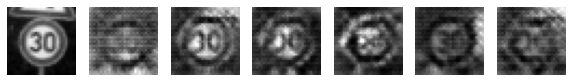

Epoch 4181 g_loss= 1.0390114 d_loss= 1.1348217 real_acc= 0.66 fake_acc= 0.84
Epoch 4182 g_loss= 0.9389807 d_loss= 1.0637374 real_acc= 0.84 fake_acc= 0.8
Epoch 4183 g_loss= 0.956125 d_loss= 1.1608503 real_acc= 0.76 fake_acc= 0.7
Epoch 4184 g_loss= 0.8925844 d_loss= 1.1427844 real_acc= 0.74 fake_acc= 0.68
Epoch 4185 g_loss= 0.83969057 d_loss= 1.2025899 real_acc= 0.72 fake_acc= 0.64
Epoch 4186 g_loss= 0.770322 d_loss= 1.2042323 real_acc= 0.84 fake_acc= 0.54
Epoch 4187 g_loss= 0.87434393 d_loss= 1.1286217 real_acc= 0.82 fake_acc= 0.6
Epoch 4188 g_loss= 0.80820364 d_loss= 1.1753681 real_acc= 0.8 fake_acc= 0.56
Epoch 4189 g_loss= 0.7647745 d_loss= 1.3020871 real_acc= 0.78 fake_acc= 0.52
Epoch 4190 g_loss= 0.850445 d_loss= 1.3397938 real_acc= 0.58 fake_acc= 0.64


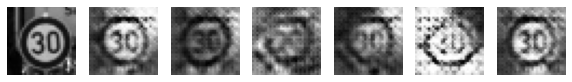

Epoch 4191 g_loss= 0.9040195 d_loss= 1.3171861 real_acc= 0.64 fake_acc= 0.7
Epoch 4192 g_loss= 0.87870634 d_loss= 1.3179444 real_acc= 0.6 fake_acc= 0.64
Epoch 4193 g_loss= 0.8030311 d_loss= 1.3005707 real_acc= 0.64 fake_acc= 0.58
Epoch 4194 g_loss= 0.80182266 d_loss= 1.3510301 real_acc= 0.52 fake_acc= 0.58
Epoch 4195 g_loss= 0.7400565 d_loss= 1.2904547 real_acc= 0.78 fake_acc= 0.52
Epoch 4196 g_loss= 0.70208734 d_loss= 1.3134892 real_acc= 0.78 fake_acc= 0.44
Epoch 4197 g_loss= 0.6925843 d_loss= 1.4400986 real_acc= 0.66 fake_acc= 0.38
Epoch 4198 g_loss= 0.803944 d_loss= 1.3017013 real_acc= 0.7 fake_acc= 0.56
Epoch 4199 g_loss= 0.81389654 d_loss= 1.3964849 real_acc= 0.48 fake_acc= 0.6
Epoch 4200 g_loss= 0.80917954 d_loss= 1.390583 real_acc= 0.44 fake_acc= 0.58


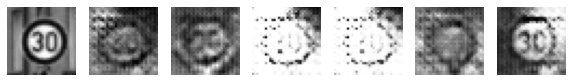

Epoch 4201 g_loss= 0.8467608 d_loss= 1.3671472 real_acc= 0.42 fake_acc= 0.66
Epoch 4202 g_loss= 0.8912182 d_loss= 1.4185231 real_acc= 0.4 fake_acc= 0.68
Epoch 4203 g_loss= 0.78533506 d_loss= 1.4800797 real_acc= 0.4 fake_acc= 0.58
Epoch 4204 g_loss= 0.7446813 d_loss= 1.4768698 real_acc= 0.38 fake_acc= 0.46
Epoch 4205 g_loss= 0.69361025 d_loss= 1.4187813 real_acc= 0.64 fake_acc= 0.4
Epoch 4206 g_loss= 0.6798928 d_loss= 1.4683821 real_acc= 0.6 fake_acc= 0.4
Epoch 4207 g_loss= 0.6519138 d_loss= 1.5021467 real_acc= 0.56 fake_acc= 0.36
Epoch 4208 g_loss= 0.63528395 d_loss= 1.5456161 real_acc= 0.5 fake_acc= 0.32
Epoch 4209 g_loss= 0.63354236 d_loss= 1.5265145 real_acc= 0.58 fake_acc= 0.28
Epoch 4210 g_loss= 0.6712793 d_loss= 1.5906663 real_acc= 0.36 fake_acc= 0.36


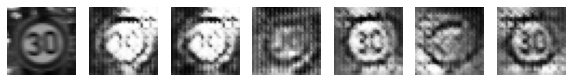

Epoch 4211 g_loss= 0.7006534 d_loss= 1.5918901 real_acc= 0.38 fake_acc= 0.42
Epoch 4212 g_loss= 0.68388456 d_loss= 1.5350964 real_acc= 0.38 fake_acc= 0.38
Epoch 4213 g_loss= 0.66385 d_loss= 1.4801087 real_acc= 0.52 fake_acc= 0.34
Epoch 4214 g_loss= 0.61371446 d_loss= 1.5328574 real_acc= 0.5 fake_acc= 0.18
Epoch 4215 g_loss= 0.6295104 d_loss= 1.5334167 real_acc= 0.54 fake_acc= 0.24
Epoch 4216 g_loss= 0.63190335 d_loss= 1.437365 real_acc= 0.64 fake_acc= 0.28
Epoch 4217 g_loss= 0.672878 d_loss= 1.400507 real_acc= 0.66 fake_acc= 0.32
Epoch 4218 g_loss= 0.72865176 d_loss= 1.438004 real_acc= 0.48 fake_acc= 0.56
Epoch 4219 g_loss= 0.79102933 d_loss= 1.5119705 real_acc= 0.36 fake_acc= 0.68
Epoch 4220 g_loss= 0.7959496 d_loss= 1.4704211 real_acc= 0.3 fake_acc= 0.6


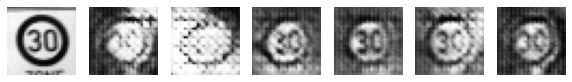

Epoch 4221 g_loss= 0.83930254 d_loss= 1.412893 real_acc= 0.34 fake_acc= 0.7
Epoch 4222 g_loss= 0.79810286 d_loss= 1.4166219 real_acc= 0.38 fake_acc= 0.62
Epoch 4223 g_loss= 0.7323793 d_loss= 1.3769643 real_acc= 0.52 fake_acc= 0.44
Epoch 4224 g_loss= 0.7088415 d_loss= 1.4108183 real_acc= 0.62 fake_acc= 0.4
Epoch 4225 g_loss= 0.63547474 d_loss= 1.5414655 real_acc= 0.56 fake_acc= 0.28
Epoch 4226 g_loss= 0.61775947 d_loss= 1.4485809 real_acc= 0.68 fake_acc= 0.18
Epoch 4227 g_loss= 0.6063576 d_loss= 1.4688807 real_acc= 0.66 fake_acc= 0.22
Epoch 4228 g_loss= 0.61825633 d_loss= 1.3795273 real_acc= 0.8 fake_acc= 0.24
Epoch 4229 g_loss= 0.70713174 d_loss= 1.4172072 real_acc= 0.54 fake_acc= 0.42
Epoch 4230 g_loss= 0.7978924 d_loss= 1.4321911 real_acc= 0.42 fake_acc= 0.6


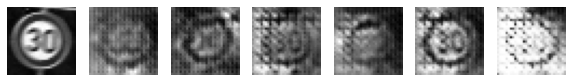

Epoch 4231 g_loss= 0.8379792 d_loss= 1.411775 real_acc= 0.36 fake_acc= 0.64
Epoch 4232 g_loss= 0.8295607 d_loss= 1.4286435 real_acc= 0.42 fake_acc= 0.66
Epoch 4233 g_loss= 0.7962878 d_loss= 1.5095923 real_acc= 0.26 fake_acc= 0.54
Epoch 4234 g_loss= 0.773399 d_loss= 1.4090445 real_acc= 0.52 fake_acc= 0.58
Epoch 4235 g_loss= 0.6946229 d_loss= 1.4993998 real_acc= 0.44 fake_acc= 0.34
Epoch 4236 g_loss= 0.69941556 d_loss= 1.4529665 real_acc= 0.46 fake_acc= 0.42
Epoch 4237 g_loss= 0.6543397 d_loss= 1.4593668 real_acc= 0.58 fake_acc= 0.4
Epoch 4238 g_loss= 0.5493985 d_loss= 1.4851677 real_acc= 0.72 fake_acc= 0.1
Epoch 4239 g_loss= 0.5932274 d_loss= 1.4735532 real_acc= 0.64 fake_acc= 0.2
Epoch 4240 g_loss= 0.6059058 d_loss= 1.5000032 real_acc= 0.68 fake_acc= 0.3


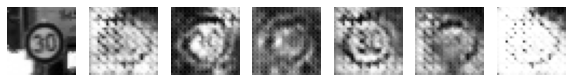

Epoch 4241 g_loss= 0.63933617 d_loss= 1.475789 real_acc= 0.62 fake_acc= 0.34
Epoch 4242 g_loss= 0.6624571 d_loss= 1.4268845 real_acc= 0.54 fake_acc= 0.38
Epoch 4243 g_loss= 0.7145878 d_loss= 1.4986042 real_acc= 0.34 fake_acc= 0.4
Epoch 4244 g_loss= 0.7723479 d_loss= 1.4679732 real_acc= 0.34 fake_acc= 0.52
Epoch 4245 g_loss= 0.75265414 d_loss= 1.4930346 real_acc= 0.4 fake_acc= 0.48
Epoch 4246 g_loss= 0.800463 d_loss= 1.4870859 real_acc= 0.4 fake_acc= 0.6
Epoch 4247 g_loss= 0.7953369 d_loss= 1.4633772 real_acc= 0.34 fake_acc= 0.62
Epoch 4248 g_loss= 0.71214557 d_loss= 1.4135985 real_acc= 0.54 fake_acc= 0.56
Epoch 4249 g_loss= 0.6748475 d_loss= 1.4786003 real_acc= 0.46 fake_acc= 0.36
Epoch 4250 g_loss= 0.6909374 d_loss= 1.3589749 real_acc= 0.64 fake_acc= 0.44


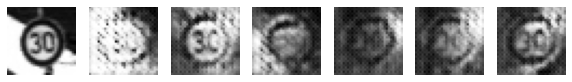

Epoch 4251 g_loss= 0.6525743 d_loss= 1.4347286 real_acc= 0.54 fake_acc= 0.34
Epoch 4252 g_loss= 0.6249509 d_loss= 1.3583938 real_acc= 0.8 fake_acc= 0.16
Epoch 4253 g_loss= 0.66580176 d_loss= 1.3302886 real_acc= 0.78 fake_acc= 0.34
Epoch 4254 g_loss= 0.78194135 d_loss= 1.3002398 real_acc= 0.56 fake_acc= 0.76
Epoch 4255 g_loss= 0.8027351 d_loss= 1.289302 real_acc= 0.52 fake_acc= 0.72
Epoch 4256 g_loss= 0.88118196 d_loss= 1.2522779 real_acc= 0.48 fake_acc= 0.78
Epoch 4257 g_loss= 0.9224276 d_loss= 1.2104666 real_acc= 0.6 fake_acc= 0.92
Epoch 4258 g_loss= 0.95146894 d_loss= 1.2502012 real_acc= 0.48 fake_acc= 0.96
Epoch 4259 g_loss= 0.99598473 d_loss= 1.2994715 real_acc= 0.32 fake_acc= 0.96
Epoch 4260 g_loss= 0.97534394 d_loss= 1.1899363 real_acc= 0.5 fake_acc= 0.96


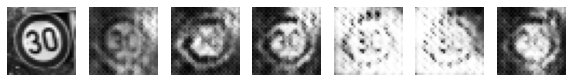

Epoch 4261 g_loss= 0.95590943 d_loss= 1.2233526 real_acc= 0.6 fake_acc= 0.98
Epoch 4262 g_loss= 0.9114141 d_loss= 1.1951249 real_acc= 0.52 fake_acc= 0.94
Epoch 4263 g_loss= 0.902029 d_loss= 1.1761085 real_acc= 0.74 fake_acc= 0.88
Epoch 4264 g_loss= 0.9113508 d_loss= 1.1501728 real_acc= 0.72 fake_acc= 0.92
Epoch 4265 g_loss= 0.8554584 d_loss= 1.1396177 real_acc= 0.74 fake_acc= 0.8
Epoch 4266 g_loss= 0.86640626 d_loss= 1.1208256 real_acc= 0.82 fake_acc= 0.94
Epoch 4267 g_loss= 0.83512586 d_loss= 1.1094786 real_acc= 0.88 fake_acc= 0.84
Epoch 4268 g_loss= 0.87523216 d_loss= 1.0868014 real_acc= 0.82 fake_acc= 0.94
Epoch 4269 g_loss= 0.9679255 d_loss= 1.0678535 real_acc= 0.82 fake_acc= 0.9
Epoch 4270 g_loss= 0.9672304 d_loss= 1.074647 real_acc= 0.82 fake_acc= 0.88


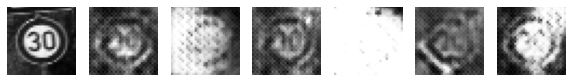

Epoch 4271 g_loss= 0.95488554 d_loss= 1.0835185 real_acc= 0.72 fake_acc= 0.94
Epoch 4272 g_loss= 0.9909867 d_loss= 1.0295327 real_acc= 0.8 fake_acc= 1.0
Epoch 4273 g_loss= 1.0404353 d_loss= 1.0421289 real_acc= 0.74 fake_acc= 0.98
Epoch 4274 g_loss= 1.0214839 d_loss= 1.0173099 real_acc= 0.82 fake_acc= 1.0
Epoch 4275 g_loss= 1.001999 d_loss= 1.0198648 real_acc= 0.82 fake_acc= 0.92
Epoch 4276 g_loss= 1.002802 d_loss= 1.0708895 real_acc= 0.78 fake_acc= 0.9
Epoch 4277 g_loss= 0.93992734 d_loss= 1.039746 real_acc= 0.92 fake_acc= 0.92
Epoch 4278 g_loss= 0.9085886 d_loss= 1.0507094 real_acc= 0.88 fake_acc= 0.8
Epoch 4279 g_loss= 0.9204576 d_loss= 1.0530677 real_acc= 0.86 fake_acc= 0.9
Epoch 4280 g_loss= 0.8972328 d_loss= 1.0540599 real_acc= 0.84 fake_acc= 0.78


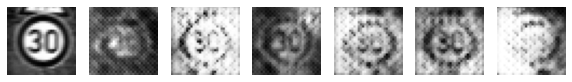

Epoch 4281 g_loss= 0.91040504 d_loss= 1.028474 real_acc= 0.88 fake_acc= 0.84
Epoch 4282 g_loss= 0.8826709 d_loss= 1.0400869 real_acc= 0.92 fake_acc= 0.84
Epoch 4283 g_loss= 0.90261096 d_loss= 1.0388882 real_acc= 0.86 fake_acc= 0.84
Epoch 4284 g_loss= 0.8958944 d_loss= 1.0302202 real_acc= 0.9 fake_acc= 0.92
Epoch 4285 g_loss= 0.97891253 d_loss= 1.037049 real_acc= 0.88 fake_acc= 0.94
Epoch 4286 g_loss= 1.0350051 d_loss= 1.025054 real_acc= 0.82 fake_acc= 0.88
Epoch 4287 g_loss= 1.0320766 d_loss= 1.0883495 real_acc= 0.7 fake_acc= 0.88
Epoch 4288 g_loss= 1.0442833 d_loss= 1.0589387 real_acc= 0.68 fake_acc= 0.94
Epoch 4289 g_loss= 0.99674356 d_loss= 1.0782325 real_acc= 0.78 fake_acc= 0.9
Epoch 4290 g_loss= 0.9695762 d_loss= 1.0785072 real_acc= 0.82 fake_acc= 0.82


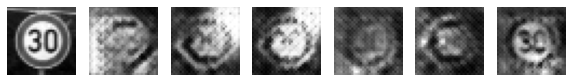

Epoch 4291 g_loss= 0.8999137 d_loss= 1.0350407 real_acc= 0.9 fake_acc= 0.74
Epoch 4292 g_loss= 0.8247521 d_loss= 1.12955 real_acc= 0.86 fake_acc= 0.64
Epoch 4293 g_loss= 0.90631837 d_loss= 1.1267687 real_acc= 0.78 fake_acc= 0.74
Epoch 4294 g_loss= 0.8844648 d_loss= 1.1354566 real_acc= 0.78 fake_acc= 0.8
Epoch 4295 g_loss= 0.83074135 d_loss= 1.1890078 real_acc= 0.68 fake_acc= 0.64
Epoch 4296 g_loss= 0.825027 d_loss= 1.1844817 real_acc= 0.72 fake_acc= 0.54
Epoch 4297 g_loss= 0.8420114 d_loss= 1.1395502 real_acc= 0.84 fake_acc= 0.74
Epoch 4298 g_loss= 0.7993279 d_loss= 1.222773 real_acc= 0.7 fake_acc= 0.54
Epoch 4299 g_loss= 0.7570724 d_loss= 1.1822066 real_acc= 0.9 fake_acc= 0.46
Epoch 4300 g_loss= 0.7203669 d_loss= 1.2394514 real_acc= 0.84 fake_acc= 0.36


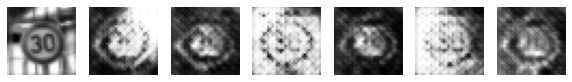

Epoch 4301 g_loss= 0.7933952 d_loss= 1.336027 real_acc= 0.58 fake_acc= 0.58
Epoch 4302 g_loss= 0.82918197 d_loss= 1.2217441 real_acc= 0.74 fake_acc= 0.54
Epoch 4303 g_loss= 0.8016061 d_loss= 1.2759571 real_acc= 0.72 fake_acc= 0.42
Epoch 4304 g_loss= 0.7892015 d_loss= 1.3220356 real_acc= 0.66 fake_acc= 0.46
Epoch 4305 g_loss= 0.80577815 d_loss= 1.2684525 real_acc= 0.76 fake_acc= 0.56
Epoch 4306 g_loss= 0.71180475 d_loss= 1.4086916 real_acc= 0.62 fake_acc= 0.34
Epoch 4307 g_loss= 0.6667706 d_loss= 1.3991107 real_acc= 0.64 fake_acc= 0.32
Epoch 4308 g_loss= 0.7742298 d_loss= 1.3700993 real_acc= 0.58 fake_acc= 0.38
Epoch 4309 g_loss= 0.70208955 d_loss= 1.3759224 real_acc= 0.68 fake_acc= 0.38
Epoch 4310 g_loss= 0.7245355 d_loss= 1.4549305 real_acc= 0.46 fake_acc= 0.44


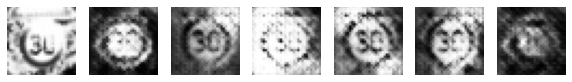

Epoch 4311 g_loss= 0.6831694 d_loss= 1.4809575 real_acc= 0.5 fake_acc= 0.32
Epoch 4312 g_loss= 0.66019636 d_loss= 1.4849393 real_acc= 0.54 fake_acc= 0.26
Epoch 4313 g_loss= 0.6342993 d_loss= 1.4590687 real_acc= 0.7 fake_acc= 0.38
Epoch 4314 g_loss= 0.6156621 d_loss= 1.5301452 real_acc= 0.56 fake_acc= 0.26
Epoch 4315 g_loss= 0.6404222 d_loss= 1.515012 real_acc= 0.56 fake_acc= 0.28
Epoch 4316 g_loss= 0.6669671 d_loss= 1.53006 real_acc= 0.5 fake_acc= 0.34
Epoch 4317 g_loss= 0.6418923 d_loss= 1.6696026 real_acc= 0.28 fake_acc= 0.26
Epoch 4318 g_loss= 0.6403313 d_loss= 1.6206689 real_acc= 0.38 fake_acc= 0.24
Epoch 4319 g_loss= 0.6186583 d_loss= 1.5647371 real_acc= 0.46 fake_acc= 0.26
Epoch 4320 g_loss= 0.58300626 d_loss= 1.6609937 real_acc= 0.34 fake_acc= 0.2


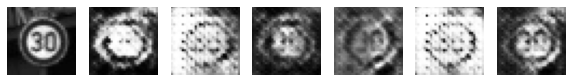

Epoch 4321 g_loss= 0.5589915 d_loss= 1.5264888 real_acc= 0.64 fake_acc= 0.12
Epoch 4322 g_loss= 0.521657 d_loss= 1.6571184 real_acc= 0.56 fake_acc= 0.08
Epoch 4323 g_loss= 0.5452485 d_loss= 1.5823282 real_acc= 0.58 fake_acc= 0.16
Epoch 4324 g_loss= 0.53864026 d_loss= 1.6345949 real_acc= 0.5 fake_acc= 0.1
Epoch 4325 g_loss= 0.5850733 d_loss= 1.6234043 real_acc= 0.44 fake_acc= 0.22
Epoch 4326 g_loss= 0.6686018 d_loss= 1.6006279 real_acc= 0.28 fake_acc= 0.32
Epoch 4327 g_loss= 0.626111 d_loss= 1.583096 real_acc= 0.38 fake_acc= 0.28
Epoch 4328 g_loss= 0.71127516 d_loss= 1.5322268 real_acc= 0.3 fake_acc= 0.36
Epoch 4329 g_loss= 0.6700311 d_loss= 1.5523229 real_acc= 0.3 fake_acc= 0.32
Epoch 4330 g_loss= 0.6335428 d_loss= 1.5530319 real_acc= 0.4 fake_acc= 0.26


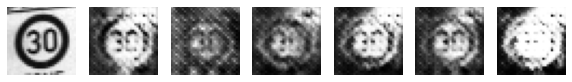

Epoch 4331 g_loss= 0.58784246 d_loss= 1.6148365 real_acc= 0.38 fake_acc= 0.18
Epoch 4332 g_loss= 0.5667047 d_loss= 1.5564637 real_acc= 0.48 fake_acc= 0.2
Epoch 4333 g_loss= 0.5851826 d_loss= 1.4679991 real_acc= 0.62 fake_acc= 0.22
Epoch 4334 g_loss= 0.5753056 d_loss= 1.5265471 real_acc= 0.56 fake_acc= 0.22
Epoch 4335 g_loss= 0.6190313 d_loss= 1.474066 real_acc= 0.54 fake_acc= 0.26
Epoch 4336 g_loss= 0.6535337 d_loss= 1.4144461 real_acc= 0.54 fake_acc= 0.26
Epoch 4337 g_loss= 0.6983838 d_loss= 1.4642475 real_acc= 0.4 fake_acc= 0.34
Epoch 4338 g_loss= 0.7102651 d_loss= 1.3935192 real_acc= 0.6 fake_acc= 0.38
Epoch 4339 g_loss= 0.6986258 d_loss= 1.4039605 real_acc= 0.56 fake_acc= 0.28
Epoch 4340 g_loss= 0.73969597 d_loss= 1.3179498 real_acc= 0.58 fake_acc= 0.48


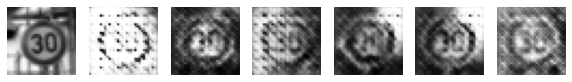

Epoch 4341 g_loss= 0.714586 d_loss= 1.3541794 real_acc= 0.66 fake_acc= 0.32
Epoch 4342 g_loss= 0.7245176 d_loss= 1.317218 real_acc= 0.66 fake_acc= 0.38
Epoch 4343 g_loss= 0.73244673 d_loss= 1.3335958 real_acc= 0.68 fake_acc= 0.4
Epoch 4344 g_loss= 0.7868153 d_loss= 1.2926738 real_acc= 0.68 fake_acc= 0.64
Epoch 4345 g_loss= 0.7642252 d_loss= 1.2803881 real_acc= 0.74 fake_acc= 0.46
Epoch 4346 g_loss= 0.8188084 d_loss= 1.2076122 real_acc= 0.78 fake_acc= 0.7
Epoch 4347 g_loss= 0.8233667 d_loss= 1.1639233 real_acc= 0.86 fake_acc= 0.74
Epoch 4348 g_loss= 0.85646296 d_loss= 1.1568805 real_acc= 0.76 fake_acc= 0.72
Epoch 4349 g_loss= 0.8520296 d_loss= 1.1457965 real_acc= 0.82 fake_acc= 0.7
Epoch 4350 g_loss= 0.8436078 d_loss= 1.1156286 real_acc= 0.84 fake_acc= 0.86


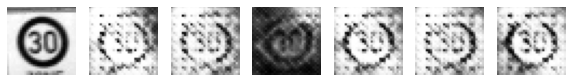

Epoch 4351 g_loss= 0.91062796 d_loss= 1.0993016 real_acc= 0.8 fake_acc= 0.88
Epoch 4352 g_loss= 0.93274957 d_loss= 1.0905682 real_acc= 0.8 fake_acc= 0.86
Epoch 4353 g_loss= 0.9803082 d_loss= 1.0676651 real_acc= 0.84 fake_acc= 0.94
Epoch 4354 g_loss= 1.0254722 d_loss= 1.0154946 real_acc= 0.84 fake_acc= 0.92
Epoch 4355 g_loss= 1.0473142 d_loss= 1.063709 real_acc= 0.76 fake_acc= 0.96
Epoch 4356 g_loss= 1.0130908 d_loss= 1.0420215 real_acc= 0.78 fake_acc= 0.98
Epoch 4357 g_loss= 1.0288587 d_loss= 1.0936404 real_acc= 0.72 fake_acc= 0.96
Epoch 4358 g_loss= 1.013047 d_loss= 1.028534 real_acc= 0.88 fake_acc= 1.0
Epoch 4359 g_loss= 0.9503297 d_loss= 1.0481622 real_acc= 0.92 fake_acc= 0.96
Epoch 4360 g_loss= 0.91531444 d_loss= 1.0752101 real_acc= 0.9 fake_acc= 0.94


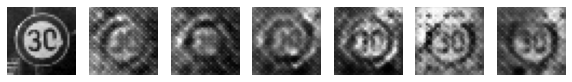

Epoch 4361 g_loss= 0.9145879 d_loss= 1.0510347 real_acc= 0.88 fake_acc= 0.84
Epoch 4362 g_loss= 0.9625593 d_loss= 1.038836 real_acc= 0.9 fake_acc= 0.94
Epoch 4363 g_loss= 0.87844473 d_loss= 1.1352 real_acc= 0.78 fake_acc= 0.88
Epoch 4364 g_loss= 0.94918543 d_loss= 1.1095109 real_acc= 0.8 fake_acc= 0.98
Epoch 4365 g_loss= 0.99674094 d_loss= 1.1194581 real_acc= 0.74 fake_acc= 0.98
Epoch 4366 g_loss= 0.9398563 d_loss= 1.1793902 real_acc= 0.68 fake_acc= 0.92
Epoch 4367 g_loss= 0.92980087 d_loss= 1.1795986 real_acc= 0.66 fake_acc= 0.94
Epoch 4368 g_loss= 0.9110817 d_loss= 1.1966985 real_acc= 0.6 fake_acc= 0.86
Epoch 4369 g_loss= 0.87032026 d_loss= 1.104398 real_acc= 0.84 fake_acc= 0.88
Epoch 4370 g_loss= 0.8265621 d_loss= 1.2103021 real_acc= 0.72 fake_acc= 0.84


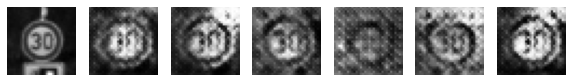

Epoch 4371 g_loss= 0.73075897 d_loss= 1.2359525 real_acc= 0.82 fake_acc= 0.66
Epoch 4372 g_loss= 0.7368658 d_loss= 1.2265546 real_acc= 0.86 fake_acc= 0.64
Epoch 4373 g_loss= 0.7270094 d_loss= 1.2224438 real_acc= 0.8 fake_acc= 0.64
Epoch 4374 g_loss= 0.75603837 d_loss= 1.2737699 real_acc= 0.72 fake_acc= 0.66
Epoch 4375 g_loss= 0.7646601 d_loss= 1.2967305 real_acc= 0.66 fake_acc= 0.5
Epoch 4376 g_loss= 0.8294461 d_loss= 1.2897102 real_acc= 0.5 fake_acc= 0.84
Epoch 4377 g_loss= 0.8899318 d_loss= 1.2580209 real_acc= 0.56 fake_acc= 0.88
Epoch 4378 g_loss= 0.838538 d_loss= 1.3275939 real_acc= 0.6 fake_acc= 0.8
Epoch 4379 g_loss= 0.762834 d_loss= 1.3814313 real_acc= 0.54 fake_acc= 0.56
Epoch 4380 g_loss= 0.70929307 d_loss= 1.373147 real_acc= 0.62 fake_acc= 0.56


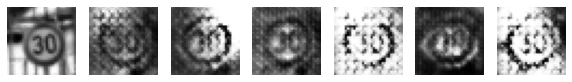

Epoch 4381 g_loss= 0.7015386 d_loss= 1.3112743 real_acc= 0.68 fake_acc= 0.54
Epoch 4382 g_loss= 0.6285564 d_loss= 1.3709415 real_acc= 0.76 fake_acc= 0.34
Epoch 4383 g_loss= 0.66373897 d_loss= 1.3540276 real_acc= 0.7 fake_acc= 0.36
Epoch 4384 g_loss= 0.65004945 d_loss= 1.3449813 real_acc= 0.8 fake_acc= 0.26
Epoch 4385 g_loss= 0.68351233 d_loss= 1.339745 real_acc= 0.72 fake_acc= 0.4
Epoch 4386 g_loss= 0.78854257 d_loss= 1.3614545 real_acc= 0.5 fake_acc= 0.64
Epoch 4387 g_loss= 0.83079886 d_loss= 1.4067743 real_acc= 0.46 fake_acc= 0.7
Epoch 4388 g_loss= 0.8036107 d_loss= 1.4108485 real_acc= 0.46 fake_acc= 0.6
Epoch 4389 g_loss= 0.7851175 d_loss= 1.4169776 real_acc= 0.5 fake_acc= 0.58
Epoch 4390 g_loss= 0.7123415 d_loss= 1.4044565 real_acc= 0.54 fake_acc= 0.48


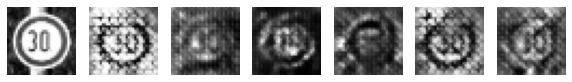

Epoch 4391 g_loss= 0.670848 d_loss= 1.3862898 real_acc= 0.74 fake_acc= 0.32
Epoch 4392 g_loss= 0.6805253 d_loss= 1.3895519 real_acc= 0.72 fake_acc= 0.34
Epoch 4393 g_loss= 0.73853195 d_loss= 1.4004154 real_acc= 0.54 fake_acc= 0.52
Epoch 4394 g_loss= 0.6949248 d_loss= 1.3857956 real_acc= 0.64 fake_acc= 0.42
Epoch 4395 g_loss= 0.68714523 d_loss= 1.3527024 real_acc= 0.74 fake_acc= 0.42
Epoch 4396 g_loss= 0.7071648 d_loss= 1.3449397 real_acc= 0.68 fake_acc= 0.48
Epoch 4397 g_loss= 0.77834845 d_loss= 1.3028295 real_acc= 0.74 fake_acc= 0.5
Epoch 4398 g_loss= 0.7393483 d_loss= 1.3559904 real_acc= 0.64 fake_acc= 0.46
Epoch 4399 g_loss= 0.7441834 d_loss= 1.3721021 real_acc= 0.6 fake_acc= 0.46
Epoch 4400 g_loss= 0.77110505 d_loss= 1.2611554 real_acc= 0.84 fake_acc= 0.5


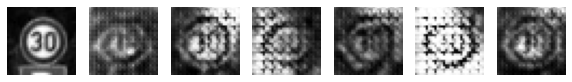

Epoch 4401 g_loss= 0.86977357 d_loss= 1.2094512 real_acc= 0.82 fake_acc= 0.66
Epoch 4402 g_loss= 0.8594829 d_loss= 1.2514732 real_acc= 0.8 fake_acc= 0.58
Epoch 4403 g_loss= 0.7975425 d_loss= 1.184545 real_acc= 0.88 fake_acc= 0.54
Epoch 4404 g_loss= 0.8018376 d_loss= 1.248396 real_acc= 0.82 fake_acc= 0.48
Epoch 4405 g_loss= 0.7827434 d_loss= 1.1847811 real_acc= 0.92 fake_acc= 0.5
Epoch 4406 g_loss= 0.8727659 d_loss= 1.1745582 real_acc= 0.84 fake_acc= 0.6
Epoch 4407 g_loss= 0.828928 d_loss= 1.1737612 real_acc= 0.92 fake_acc= 0.48
Epoch 4408 g_loss= 0.861085 d_loss= 1.1546352 real_acc= 0.9 fake_acc= 0.48
Epoch 4409 g_loss= 0.98616576 d_loss= 1.0659268 real_acc= 0.9 fake_acc= 0.68
Epoch 4410 g_loss= 0.94407916 d_loss= 1.1600482 real_acc= 0.8 fake_acc= 0.6


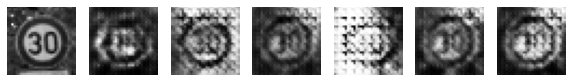

Epoch 4411 g_loss= 0.95325714 d_loss= 1.1108143 real_acc= 0.88 fake_acc= 0.52
Epoch 4412 g_loss= 1.0430245 d_loss= 1.0993834 real_acc= 0.76 fake_acc= 0.66
Epoch 4413 g_loss= 1.0261128 d_loss= 1.0474081 real_acc= 0.82 fake_acc= 0.68
Epoch 4414 g_loss= 1.0639904 d_loss= 1.0435547 real_acc= 0.88 fake_acc= 0.64
Epoch 4415 g_loss= 1.0945704 d_loss= 1.0359068 real_acc= 0.84 fake_acc= 0.72
Epoch 4416 g_loss= 0.9628107 d_loss= 1.0139973 real_acc= 0.98 fake_acc= 0.7
Epoch 4417 g_loss= 0.963959 d_loss= 1.0598166 real_acc= 0.82 fake_acc= 0.76
Epoch 4418 g_loss= 0.95599914 d_loss= 0.9997463 real_acc= 0.88 fake_acc= 0.78
Epoch 4419 g_loss= 0.92629313 d_loss= 1.0295113 real_acc= 0.94 fake_acc= 0.7
Epoch 4420 g_loss= 0.9623867 d_loss= 1.0465068 real_acc= 0.84 fake_acc= 0.7


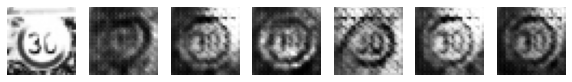

Epoch 4421 g_loss= 1.0273868 d_loss= 1.01245 real_acc= 0.86 fake_acc= 0.84
Epoch 4422 g_loss= 1.0208879 d_loss= 1.0550476 real_acc= 0.84 fake_acc= 0.84
Epoch 4423 g_loss= 1.0220094 d_loss= 1.0938134 real_acc= 0.74 fake_acc= 0.82
Epoch 4424 g_loss= 1.1510231 d_loss= 1.0608988 real_acc= 0.66 fake_acc= 0.92
Epoch 4425 g_loss= 0.95970243 d_loss= 1.0840809 real_acc= 0.8 fake_acc= 0.72
Epoch 4426 g_loss= 0.8886575 d_loss= 1.0939856 real_acc= 0.8 fake_acc= 0.72
Epoch 4427 g_loss= 1.0027534 d_loss= 1.0649601 real_acc= 0.76 fake_acc= 0.88
Epoch 4428 g_loss= 0.8903183 d_loss= 1.0830891 real_acc= 0.82 fake_acc= 0.84
Epoch 4429 g_loss= 0.8762429 d_loss= 1.1235267 real_acc= 0.8 fake_acc= 0.74
Epoch 4430 g_loss= 0.91162103 d_loss= 1.0911365 real_acc= 0.8 fake_acc= 0.84


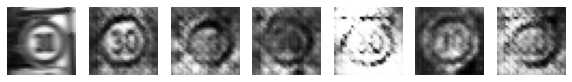

Epoch 4431 g_loss= 0.89212126 d_loss= 1.1626837 real_acc= 0.64 fake_acc= 0.74
Epoch 4432 g_loss= 0.82912576 d_loss= 1.2078887 real_acc= 0.76 fake_acc= 0.6
Epoch 4433 g_loss= 0.81378657 d_loss= 1.2684693 real_acc= 0.72 fake_acc= 0.64
Epoch 4434 g_loss= 0.92643106 d_loss= 1.2641788 real_acc= 0.58 fake_acc= 0.8
Epoch 4435 g_loss= 0.8147966 d_loss= 1.2909987 real_acc= 0.62 fake_acc= 0.6
Epoch 4436 g_loss= 0.80537844 d_loss= 1.3230078 real_acc= 0.54 fake_acc= 0.58
Epoch 4437 g_loss= 0.780567 d_loss= 1.4454163 real_acc= 0.54 fake_acc= 0.52
Epoch 4438 g_loss= 0.6854017 d_loss= 1.4174011 real_acc= 0.66 fake_acc= 0.32
Epoch 4439 g_loss= 0.6839687 d_loss= 1.4792554 real_acc= 0.44 fake_acc= 0.34
Epoch 4440 g_loss= 0.62506396 d_loss= 1.4205871 real_acc= 0.7 fake_acc= 0.24


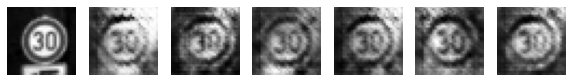

Epoch 4441 g_loss= 0.5654426 d_loss= 1.5709398 real_acc= 0.6 fake_acc= 0.22
Epoch 4442 g_loss= 0.61735624 d_loss= 1.595483 real_acc= 0.48 fake_acc= 0.28
Epoch 4443 g_loss= 0.67877716 d_loss= 1.5086558 real_acc= 0.4 fake_acc= 0.36
Epoch 4444 g_loss= 0.7003013 d_loss= 1.5643394 real_acc= 0.38 fake_acc= 0.36
Epoch 4445 g_loss= 0.7257307 d_loss= 1.590029 real_acc= 0.26 fake_acc= 0.44
Epoch 4446 g_loss= 0.7132711 d_loss= 1.5995567 real_acc= 0.38 fake_acc= 0.4
Epoch 4447 g_loss= 0.60428655 d_loss= 1.6280863 real_acc= 0.38 fake_acc= 0.26
Epoch 4448 g_loss= 0.542794 d_loss= 1.6311845 real_acc= 0.52 fake_acc= 0.16
Epoch 4449 g_loss= 0.52802664 d_loss= 1.6290252 real_acc= 0.48 fake_acc= 0.14
Epoch 4450 g_loss= 0.5015161 d_loss= 1.6503105 real_acc= 0.58 fake_acc= 0.12


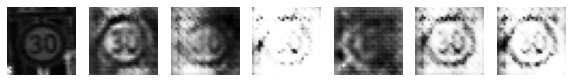

Epoch 4451 g_loss= 0.4764611 d_loss= 1.6849651 real_acc= 0.52 fake_acc= 0.06
Epoch 4452 g_loss= 0.57861716 d_loss= 1.7036679 real_acc= 0.3 fake_acc= 0.16
Epoch 4453 g_loss= 0.6575272 d_loss= 1.6330314 real_acc= 0.34 fake_acc= 0.32
Epoch 4454 g_loss= 0.6013038 d_loss= 1.5888891 real_acc= 0.42 fake_acc= 0.16
Epoch 4455 g_loss= 0.6970104 d_loss= 1.5709519 real_acc= 0.32 fake_acc= 0.3
Epoch 4456 g_loss= 0.6961853 d_loss= 1.6024451 real_acc= 0.18 fake_acc= 0.36
Epoch 4457 g_loss= 0.678914 d_loss= 1.5422556 real_acc= 0.3 fake_acc= 0.28
Epoch 4458 g_loss= 0.64593095 d_loss= 1.5211663 real_acc= 0.4 fake_acc= 0.26
Epoch 4459 g_loss= 0.63055575 d_loss= 1.5061307 real_acc= 0.46 fake_acc= 0.26
Epoch 4460 g_loss= 0.66491187 d_loss= 1.4082572 real_acc= 0.62 fake_acc= 0.36


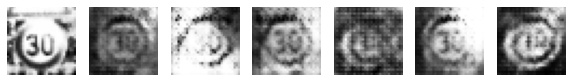

Epoch 4461 g_loss= 0.6258977 d_loss= 1.5000335 real_acc= 0.46 fake_acc= 0.26
Epoch 4462 g_loss= 0.6308673 d_loss= 1.4747114 real_acc= 0.52 fake_acc= 0.2
Epoch 4463 g_loss= 0.701273 d_loss= 1.4393218 real_acc= 0.42 fake_acc= 0.44
Epoch 4464 g_loss= 0.75880784 d_loss= 1.3888586 real_acc= 0.4 fake_acc= 0.5
Epoch 4465 g_loss= 0.7815175 d_loss= 1.405733 real_acc= 0.36 fake_acc= 0.7
Epoch 4466 g_loss= 0.81670153 d_loss= 1.356984 real_acc= 0.36 fake_acc= 0.62
Epoch 4467 g_loss= 0.7786444 d_loss= 1.4120628 real_acc= 0.26 fake_acc= 0.66
Epoch 4468 g_loss= 0.7669953 d_loss= 1.3699661 real_acc= 0.32 fake_acc= 0.66
Epoch 4469 g_loss= 0.8199488 d_loss= 1.3342438 real_acc= 0.4 fake_acc= 0.82
Epoch 4470 g_loss= 0.7794816 d_loss= 1.3028827 real_acc= 0.56 fake_acc= 0.78


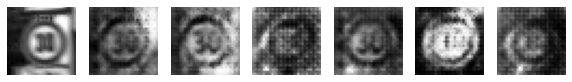

Epoch 4471 g_loss= 0.81498426 d_loss= 1.2657701 real_acc= 0.62 fake_acc= 0.76
Epoch 4472 g_loss= 0.7971388 d_loss= 1.2344277 real_acc= 0.64 fake_acc= 0.76
Epoch 4473 g_loss= 0.7507238 d_loss= 1.3047034 real_acc= 0.68 fake_acc= 0.66
Epoch 4474 g_loss= 0.73234236 d_loss= 1.3189359 real_acc= 0.6 fake_acc= 0.58
Epoch 4475 g_loss= 0.8039848 d_loss= 1.2579865 real_acc= 0.64 fake_acc= 0.78
Epoch 4476 g_loss= 0.8614668 d_loss= 1.2817392 real_acc= 0.52 fake_acc= 0.86
Epoch 4477 g_loss= 0.9075645 d_loss= 1.2117591 real_acc= 0.48 fake_acc= 0.88
Epoch 4478 g_loss= 0.8830315 d_loss= 1.2676219 real_acc= 0.44 fake_acc= 0.9
Epoch 4479 g_loss= 0.93878275 d_loss= 1.2587876 real_acc= 0.48 fake_acc= 0.8
Epoch 4480 g_loss= 0.87729394 d_loss= 1.1886125 real_acc= 0.68 fake_acc= 0.78


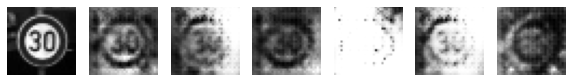

Epoch 4481 g_loss= 0.897068 d_loss= 1.1650627 real_acc= 0.72 fake_acc= 0.74
Epoch 4482 g_loss= 0.7889497 d_loss= 1.204741 real_acc= 0.76 fake_acc= 0.62
Epoch 4483 g_loss= 0.8067438 d_loss= 1.2630394 real_acc= 0.6 fake_acc= 0.62
Epoch 4484 g_loss= 0.79619956 d_loss= 1.2184331 real_acc= 0.74 fake_acc= 0.52
Epoch 4485 g_loss= 0.77876824 d_loss= 1.2399769 real_acc= 0.66 fake_acc= 0.56
Epoch 4486 g_loss= 0.79858696 d_loss= 1.2763692 real_acc= 0.68 fake_acc= 0.62
Epoch 4487 g_loss= 0.7537965 d_loss= 1.2870173 real_acc= 0.6 fake_acc= 0.52
Epoch 4488 g_loss= 0.7820176 d_loss= 1.2179484 real_acc= 0.7 fake_acc= 0.48
Epoch 4489 g_loss= 0.83036226 d_loss= 1.2719803 real_acc= 0.6 fake_acc= 0.5
Epoch 4490 g_loss= 0.8036525 d_loss= 1.2895226 real_acc= 0.52 fake_acc= 0.66


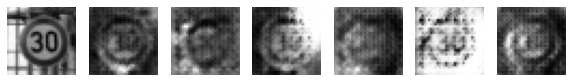

Epoch 4491 g_loss= 0.8170166 d_loss= 1.1939158 real_acc= 0.7 fake_acc= 0.54
Epoch 4492 g_loss= 0.7773826 d_loss= 1.2203233 real_acc= 0.74 fake_acc= 0.52
Epoch 4493 g_loss= 0.800851 d_loss= 1.2878844 real_acc= 0.48 fake_acc= 0.54
Epoch 4494 g_loss= 0.77669805 d_loss= 1.2997053 real_acc= 0.6 fake_acc= 0.46
Epoch 4495 g_loss= 0.77848655 d_loss= 1.3048184 real_acc= 0.54 fake_acc= 0.6
Epoch 4496 g_loss= 0.76156634 d_loss= 1.3236698 real_acc= 0.5 fake_acc= 0.44
Epoch 4497 g_loss= 0.83551735 d_loss= 1.3111978 real_acc= 0.46 fake_acc= 0.68
Epoch 4498 g_loss= 0.7971549 d_loss= 1.30546 real_acc= 0.62 fake_acc= 0.56
Epoch 4499 g_loss= 0.7422934 d_loss= 1.4000154 real_acc= 0.38 fake_acc= 0.54
Epoch 4500 g_loss= 0.7777601 d_loss= 1.2963002 real_acc= 0.54 fake_acc= 0.62


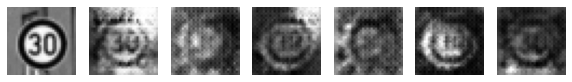

Epoch 4501 g_loss= 0.7527419 d_loss= 1.3570741 real_acc= 0.52 fake_acc= 0.58
Epoch 4502 g_loss= 0.76007223 d_loss= 1.3539325 real_acc= 0.46 fake_acc= 0.64
Epoch 4503 g_loss= 0.7503442 d_loss= 1.3387654 real_acc= 0.5 fake_acc= 0.54
Epoch 4504 g_loss= 0.78942525 d_loss= 1.2730373 real_acc= 0.66 fake_acc= 0.58
Epoch 4505 g_loss= 0.81353045 d_loss= 1.2702123 real_acc= 0.58 fake_acc= 0.64
Epoch 4506 g_loss= 0.76188767 d_loss= 1.4304626 real_acc= 0.32 fake_acc= 0.6
Epoch 4507 g_loss= 0.8231258 d_loss= 1.2915242 real_acc= 0.52 fake_acc= 0.68
Epoch 4508 g_loss= 0.7888199 d_loss= 1.2303306 real_acc= 0.68 fake_acc= 0.64
Epoch 4509 g_loss= 0.7592676 d_loss= 1.4209797 real_acc= 0.4 fake_acc= 0.54
Epoch 4510 g_loss= 0.7774771 d_loss= 1.3721924 real_acc= 0.42 fake_acc= 0.7


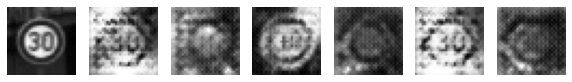

Epoch 4511 g_loss= 0.79047906 d_loss= 1.3209646 real_acc= 0.52 fake_acc= 0.58
Epoch 4512 g_loss= 0.67030245 d_loss= 1.4545155 real_acc= 0.48 fake_acc= 0.42
Epoch 4513 g_loss= 0.6857106 d_loss= 1.3817369 real_acc= 0.62 fake_acc= 0.44
Epoch 4514 g_loss= 0.6811065 d_loss= 1.3667321 real_acc= 0.58 fake_acc= 0.5
Epoch 4515 g_loss= 0.7021059 d_loss= 1.3553228 real_acc= 0.6 fake_acc= 0.42
Epoch 4516 g_loss= 0.76005864 d_loss= 1.3359814 real_acc= 0.54 fake_acc= 0.68
Epoch 4517 g_loss= 0.7715534 d_loss= 1.3234334 real_acc= 0.56 fake_acc= 0.62
Epoch 4518 g_loss= 0.81697905 d_loss= 1.3964413 real_acc= 0.44 fake_acc= 0.8
Epoch 4519 g_loss= 0.78945863 d_loss= 1.4419599 real_acc= 0.36 fake_acc= 0.62
Epoch 4520 g_loss= 0.747578 d_loss= 1.3916049 real_acc= 0.5 fake_acc= 0.64


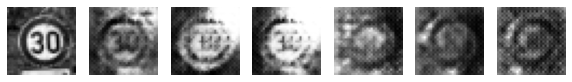

Epoch 4521 g_loss= 0.7481384 d_loss= 1.3413832 real_acc= 0.68 fake_acc= 0.54
Epoch 4522 g_loss= 0.6685017 d_loss= 1.4518918 real_acc= 0.54 fake_acc= 0.4
Epoch 4523 g_loss= 0.7050327 d_loss= 1.3500011 real_acc= 0.62 fake_acc= 0.52
Epoch 4524 g_loss= 0.68739474 d_loss= 1.3545197 real_acc= 0.56 fake_acc= 0.5
Epoch 4525 g_loss= 0.68293387 d_loss= 1.3723365 real_acc= 0.64 fake_acc= 0.56
Epoch 4526 g_loss= 0.7382984 d_loss= 1.3998946 real_acc= 0.52 fake_acc= 0.58
Epoch 4527 g_loss= 0.7524443 d_loss= 1.3838894 real_acc= 0.46 fake_acc= 0.62
Epoch 4528 g_loss= 0.7769685 d_loss= 1.4307685 real_acc= 0.44 fake_acc= 0.74
Epoch 4529 g_loss= 0.81591576 d_loss= 1.3971822 real_acc= 0.42 fake_acc= 0.74
Epoch 4530 g_loss= 0.8495934 d_loss= 1.4253709 real_acc= 0.34 fake_acc= 0.78


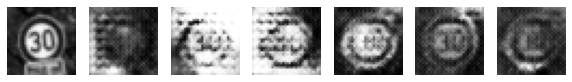

Epoch 4531 g_loss= 0.8616772 d_loss= 1.3742691 real_acc= 0.36 fake_acc= 0.88
Epoch 4532 g_loss= 0.79839796 d_loss= 1.4578866 real_acc= 0.42 fake_acc= 0.74
Epoch 4533 g_loss= 0.8280389 d_loss= 1.2928629 real_acc= 0.5 fake_acc= 0.72
Epoch 4534 g_loss= 0.83094674 d_loss= 1.3844172 real_acc= 0.38 fake_acc= 0.9
Epoch 4535 g_loss= 0.7677286 d_loss= 1.371985 real_acc= 0.44 fake_acc= 0.74
Epoch 4536 g_loss= 0.71849054 d_loss= 1.3630173 real_acc= 0.6 fake_acc= 0.54
Epoch 4537 g_loss= 0.72972536 d_loss= 1.3537564 real_acc= 0.56 fake_acc= 0.54
Epoch 4538 g_loss= 0.7133709 d_loss= 1.2998631 real_acc= 0.7 fake_acc= 0.52
Epoch 4539 g_loss= 0.71046996 d_loss= 1.3245137 real_acc= 0.68 fake_acc= 0.54
Epoch 4540 g_loss= 0.71115196 d_loss= 1.3351824 real_acc= 0.64 fake_acc= 0.48


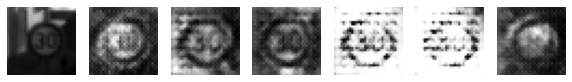

Epoch 4541 g_loss= 0.77632976 d_loss= 1.4265895 real_acc= 0.4 fake_acc= 0.68
Epoch 4542 g_loss= 0.80651206 d_loss= 1.3258557 real_acc= 0.62 fake_acc= 0.66
Epoch 4543 g_loss= 0.7655583 d_loss= 1.3208106 real_acc= 0.56 fake_acc= 0.66
Epoch 4544 g_loss= 0.77941597 d_loss= 1.3463073 real_acc= 0.48 fake_acc= 0.7
Epoch 4545 g_loss= 0.88114744 d_loss= 1.254442 real_acc= 0.54 fake_acc= 0.82
Epoch 4546 g_loss= 0.88630944 d_loss= 1.2914174 real_acc= 0.46 fake_acc= 0.78
Epoch 4547 g_loss= 0.82807195 d_loss= 1.3417315 real_acc= 0.54 fake_acc= 0.66
Epoch 4548 g_loss= 0.8781193 d_loss= 1.2578648 real_acc= 0.56 fake_acc= 0.72
Epoch 4549 g_loss= 0.8439206 d_loss= 1.2773471 real_acc= 0.6 fake_acc= 0.8
Epoch 4550 g_loss= 0.8000622 d_loss= 1.3071773 real_acc= 0.6 fake_acc= 0.76


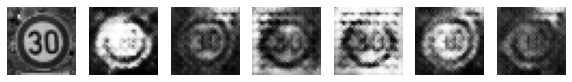

Epoch 4551 g_loss= 0.7962842 d_loss= 1.2859317 real_acc= 0.66 fake_acc= 0.58
Epoch 4552 g_loss= 0.8281741 d_loss= 1.2428333 real_acc= 0.68 fake_acc= 0.62
Epoch 4553 g_loss= 0.80940765 d_loss= 1.1582321 real_acc= 0.82 fake_acc= 0.68
Epoch 4554 g_loss= 0.8798346 d_loss= 1.1673679 real_acc= 0.7 fake_acc= 0.78
Epoch 4555 g_loss= 0.8396915 d_loss= 1.2064192 real_acc= 0.72 fake_acc= 0.66
Epoch 4556 g_loss= 0.86881465 d_loss= 1.183074 real_acc= 0.64 fake_acc= 0.8
Epoch 4557 g_loss= 0.931869 d_loss= 1.1724927 real_acc= 0.6 fake_acc= 0.76
Epoch 4558 g_loss= 0.9443417 d_loss= 1.1377194 real_acc= 0.72 fake_acc= 0.82
Epoch 4559 g_loss= 0.9717762 d_loss= 1.1326411 real_acc= 0.64 fake_acc= 0.88
Epoch 4560 g_loss= 1.0144683 d_loss= 1.1778867 real_acc= 0.5 fake_acc= 0.88


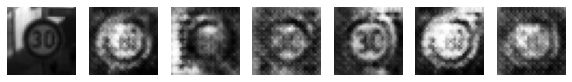

Epoch 4561 g_loss= 0.95589525 d_loss= 1.2253506 real_acc= 0.52 fake_acc= 0.82
Epoch 4562 g_loss= 0.90805054 d_loss= 1.18455 real_acc= 0.68 fake_acc= 0.82
Epoch 4563 g_loss= 0.873642 d_loss= 1.1738398 real_acc= 0.72 fake_acc= 0.7
Epoch 4564 g_loss= 0.8265242 d_loss= 1.1799458 real_acc= 0.72 fake_acc= 0.72
Epoch 4565 g_loss= 0.8154521 d_loss= 1.2046678 real_acc= 0.78 fake_acc= 0.64
Epoch 4566 g_loss= 0.8812575 d_loss= 1.1282008 real_acc= 0.74 fake_acc= 0.7
Epoch 4567 g_loss= 0.870733 d_loss= 1.0935596 real_acc= 0.88 fake_acc= 0.7
Epoch 4568 g_loss= 0.89786947 d_loss= 1.1170678 real_acc= 0.82 fake_acc= 0.76
Epoch 4569 g_loss= 0.90012825 d_loss= 1.0741942 real_acc= 0.84 fake_acc= 0.74
Epoch 4570 g_loss= 0.9623159 d_loss= 1.1247153 real_acc= 0.66 fake_acc= 0.76


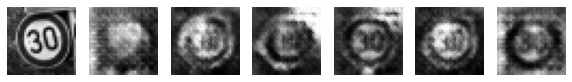

Epoch 4571 g_loss= 0.9918982 d_loss= 1.0969205 real_acc= 0.76 fake_acc= 0.86
Epoch 4572 g_loss= 0.908584 d_loss= 1.2016051 real_acc= 0.7 fake_acc= 0.84
Epoch 4573 g_loss= 0.93082535 d_loss= 1.1969022 real_acc= 0.62 fake_acc= 0.9
Epoch 4574 g_loss= 0.94518477 d_loss= 1.12532 real_acc= 0.64 fake_acc= 0.86
Epoch 4575 g_loss= 0.89127886 d_loss= 1.1141868 real_acc= 0.76 fake_acc= 0.78
Epoch 4576 g_loss= 0.8448535 d_loss= 1.1616426 real_acc= 0.78 fake_acc= 0.76
Epoch 4577 g_loss= 0.8115885 d_loss= 1.1704729 real_acc= 0.8 fake_acc= 0.64
Epoch 4578 g_loss= 0.8105823 d_loss= 1.1830783 real_acc= 0.78 fake_acc= 0.66
Epoch 4579 g_loss= 0.8503824 d_loss= 1.1440754 real_acc= 0.82 fake_acc= 0.68
Epoch 4580 g_loss= 0.8616028 d_loss= 1.2096306 real_acc= 0.68 fake_acc= 0.74


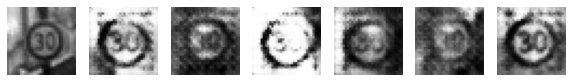

Epoch 4581 g_loss= 0.8204895 d_loss= 1.2322946 real_acc= 0.66 fake_acc= 0.64
Epoch 4582 g_loss= 0.9084528 d_loss= 1.1466274 real_acc= 0.72 fake_acc= 0.84
Epoch 4583 g_loss= 0.911071 d_loss= 1.17203 real_acc= 0.68 fake_acc= 0.9
Epoch 4584 g_loss= 0.8946674 d_loss= 1.1852815 real_acc= 0.72 fake_acc= 0.8
Epoch 4585 g_loss= 0.84857917 d_loss= 1.1920726 real_acc= 0.76 fake_acc= 0.72
Epoch 4586 g_loss= 0.8364558 d_loss= 1.2324119 real_acc= 0.62 fake_acc= 0.76
Epoch 4587 g_loss= 0.8053222 d_loss= 1.2023714 real_acc= 0.74 fake_acc= 0.68
Epoch 4588 g_loss= 0.77595866 d_loss= 1.2593777 real_acc= 0.78 fake_acc= 0.62
Epoch 4589 g_loss= 0.87243253 d_loss= 1.2317874 real_acc= 0.64 fake_acc= 0.74
Epoch 4590 g_loss= 0.79579324 d_loss= 1.3241177 real_acc= 0.5 fake_acc= 0.72


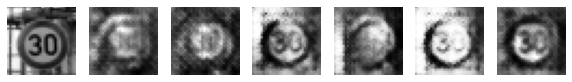

Epoch 4591 g_loss= 0.82546145 d_loss= 1.2634897 real_acc= 0.62 fake_acc= 0.66
Epoch 4592 g_loss= 0.75476575 d_loss= 1.3060751 real_acc= 0.68 fake_acc= 0.56
Epoch 4593 g_loss= 0.76127946 d_loss= 1.3048534 real_acc= 0.66 fake_acc= 0.56
Epoch 4594 g_loss= 0.7613572 d_loss= 1.3006512 real_acc= 0.62 fake_acc= 0.68
Epoch 4595 g_loss= 0.76217914 d_loss= 1.3024287 real_acc= 0.6 fake_acc= 0.56
Epoch 4596 g_loss= 0.80264175 d_loss= 1.323755 real_acc= 0.62 fake_acc= 0.52
Epoch 4597 g_loss= 0.7776096 d_loss= 1.3344307 real_acc= 0.62 fake_acc= 0.54
Epoch 4598 g_loss= 0.7631921 d_loss= 1.3745916 real_acc= 0.5 fake_acc= 0.56
Epoch 4599 g_loss= 0.70437133 d_loss= 1.3303325 real_acc= 0.66 fake_acc= 0.48
Epoch 4600 g_loss= 0.75251997 d_loss= 1.3327007 real_acc= 0.64 fake_acc= 0.48


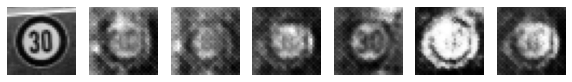

Epoch 4601 g_loss= 0.7466311 d_loss= 1.3204478 real_acc= 0.74 fake_acc= 0.5
Epoch 4602 g_loss= 0.693785 d_loss= 1.3111352 real_acc= 0.78 fake_acc= 0.42
Epoch 4603 g_loss= 0.7353014 d_loss= 1.3770827 real_acc= 0.52 fake_acc= 0.52
Epoch 4604 g_loss= 0.7622111 d_loss= 1.371049 real_acc= 0.58 fake_acc= 0.64
Epoch 4605 g_loss= 0.8401641 d_loss= 1.2764642 real_acc= 0.62 fake_acc= 0.64
Epoch 4606 g_loss= 0.825329 d_loss= 1.2613833 real_acc= 0.58 fake_acc= 0.76
Epoch 4607 g_loss= 0.7951805 d_loss= 1.3840041 real_acc= 0.4 fake_acc= 0.68
Epoch 4608 g_loss= 0.77762604 d_loss= 1.2958915 real_acc= 0.68 fake_acc= 0.62
Epoch 4609 g_loss= 0.74058074 d_loss= 1.2840426 real_acc= 0.68 fake_acc= 0.62
Epoch 4610 g_loss= 0.7774285 d_loss= 1.2907654 real_acc= 0.66 fake_acc= 0.66


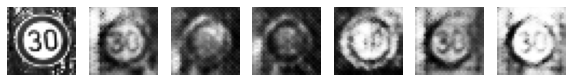

Epoch 4611 g_loss= 0.76645994 d_loss= 1.3184068 real_acc= 0.6 fake_acc= 0.54
Epoch 4612 g_loss= 0.7374968 d_loss= 1.2671373 real_acc= 0.78 fake_acc= 0.56
Epoch 4613 g_loss= 0.75334966 d_loss= 1.194596 real_acc= 0.84 fake_acc= 0.58
Epoch 4614 g_loss= 0.7968497 d_loss= 1.2031039 real_acc= 0.8 fake_acc= 0.66
Epoch 4615 g_loss= 0.7387622 d_loss= 1.3066778 real_acc= 0.72 fake_acc= 0.54
Epoch 4616 g_loss= 0.8919293 d_loss= 1.268697 real_acc= 0.54 fake_acc= 0.74
Epoch 4617 g_loss= 0.9349901 d_loss= 1.1911496 real_acc= 0.6 fake_acc= 0.9
Epoch 4618 g_loss= 0.8485051 d_loss= 1.2330971 real_acc= 0.66 fake_acc= 0.84
Epoch 4619 g_loss= 0.92532724 d_loss= 1.2231116 real_acc= 0.52 fake_acc= 0.86
Epoch 4620 g_loss= 0.8592789 d_loss= 1.2276297 real_acc= 0.64 fake_acc= 0.8


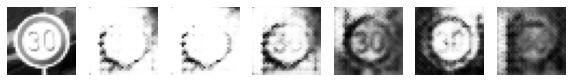

Epoch 4621 g_loss= 0.89822936 d_loss= 1.2081892 real_acc= 0.6 fake_acc= 0.84
Epoch 4622 g_loss= 0.8998542 d_loss= 1.1562525 real_acc= 0.74 fake_acc= 0.82
Epoch 4623 g_loss= 0.81490445 d_loss= 1.1574179 real_acc= 0.84 fake_acc= 0.68
Epoch 4624 g_loss= 0.81183505 d_loss= 1.2125432 real_acc= 0.74 fake_acc= 0.7
Epoch 4625 g_loss= 0.8108557 d_loss= 1.1776246 real_acc= 0.82 fake_acc= 0.68
Epoch 4626 g_loss= 0.82755715 d_loss= 1.1906024 real_acc= 0.82 fake_acc= 0.74
Epoch 4627 g_loss= 0.8508119 d_loss= 1.1720796 real_acc= 0.74 fake_acc= 0.74
Epoch 4628 g_loss= 0.80929756 d_loss= 1.1962218 real_acc= 0.78 fake_acc= 0.74
Epoch 4629 g_loss= 0.81823677 d_loss= 1.2446072 real_acc= 0.66 fake_acc= 0.7
Epoch 4630 g_loss= 0.9107705 d_loss= 1.1001523 real_acc= 0.88 fake_acc= 0.78


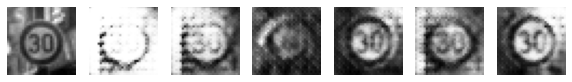

Epoch 4631 g_loss= 0.9310155 d_loss= 1.1942024 real_acc= 0.7 fake_acc= 0.74
Epoch 4632 g_loss= 0.80427796 d_loss= 1.2167904 real_acc= 0.74 fake_acc= 0.74
Epoch 4633 g_loss= 0.851923 d_loss= 1.2690187 real_acc= 0.66 fake_acc= 0.68
Epoch 4634 g_loss= 0.9097808 d_loss= 1.2522609 real_acc= 0.62 fake_acc= 0.84
Epoch 4635 g_loss= 0.8949129 d_loss= 1.1910522 real_acc= 0.72 fake_acc= 0.76
Epoch 4636 g_loss= 0.8632904 d_loss= 1.1493709 real_acc= 0.86 fake_acc= 0.66
Epoch 4637 g_loss= 0.7890405 d_loss= 1.2674787 real_acc= 0.72 fake_acc= 0.54
Epoch 4638 g_loss= 0.8655218 d_loss= 1.1979997 real_acc= 0.74 fake_acc= 0.68
Epoch 4639 g_loss= 0.7893963 d_loss= 1.3012538 real_acc= 0.64 fake_acc= 0.62
Epoch 4640 g_loss= 0.83339936 d_loss= 1.2535903 real_acc= 0.8 fake_acc= 0.56


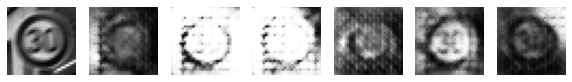

Epoch 4641 g_loss= 0.8789494 d_loss= 1.2432318 real_acc= 0.68 fake_acc= 0.62
Epoch 4642 g_loss= 0.72988397 d_loss= 1.3772418 real_acc= 0.64 fake_acc= 0.44
Epoch 4643 g_loss= 0.81396013 d_loss= 1.254031 real_acc= 0.72 fake_acc= 0.52
Epoch 4644 g_loss= 0.7458042 d_loss= 1.3399704 real_acc= 0.66 fake_acc= 0.4
Epoch 4645 g_loss= 0.73313123 d_loss= 1.3238747 real_acc= 0.68 fake_acc= 0.44
Epoch 4646 g_loss= 0.74250185 d_loss= 1.3586171 real_acc= 0.66 fake_acc= 0.42
Epoch 4647 g_loss= 0.7438014 d_loss= 1.3227398 real_acc= 0.68 fake_acc= 0.5
Epoch 4648 g_loss= 0.7631805 d_loss= 1.3148098 real_acc= 0.68 fake_acc= 0.5
Epoch 4649 g_loss= 0.67768824 d_loss= 1.3253942 real_acc= 0.82 fake_acc= 0.36
Epoch 4650 g_loss= 0.769104 d_loss= 1.2711036 real_acc= 0.68 fake_acc= 0.54


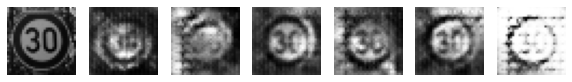

Epoch 4651 g_loss= 0.79054445 d_loss= 1.3350124 real_acc= 0.72 fake_acc= 0.54
Epoch 4652 g_loss= 0.72923493 d_loss= 1.3944207 real_acc= 0.68 fake_acc= 0.38
Epoch 4653 g_loss= 0.77523696 d_loss= 1.2870984 real_acc= 0.7 fake_acc= 0.52
Epoch 4654 g_loss= 0.7329695 d_loss= 1.4065874 real_acc= 0.62 fake_acc= 0.52
Epoch 4655 g_loss= 0.7804573 d_loss= 1.2654653 real_acc= 0.76 fake_acc= 0.48
Epoch 4656 g_loss= 0.7230471 d_loss= 1.443193 real_acc= 0.54 fake_acc= 0.44
Epoch 4657 g_loss= 0.7407067 d_loss= 1.4798949 real_acc= 0.46 fake_acc= 0.4
Epoch 4658 g_loss= 0.70335764 d_loss= 1.4581133 real_acc= 0.54 fake_acc= 0.46
Epoch 4659 g_loss= 0.6759131 d_loss= 1.4352922 real_acc= 0.7 fake_acc= 0.32
Epoch 4660 g_loss= 0.6555999 d_loss= 1.4845684 real_acc= 0.58 fake_acc= 0.36


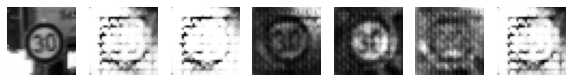

Epoch 4661 g_loss= 0.73220223 d_loss= 1.4075975 real_acc= 0.72 fake_acc= 0.48
Epoch 4662 g_loss= 0.69123465 d_loss= 1.5523882 real_acc= 0.48 fake_acc= 0.36
Epoch 4663 g_loss= 0.6937406 d_loss= 1.3741239 real_acc= 0.72 fake_acc= 0.42
Epoch 4664 g_loss= 0.70822626 d_loss= 1.359884 real_acc= 0.7 fake_acc= 0.36
Epoch 4665 g_loss= 0.7076967 d_loss= 1.3388784 real_acc= 0.72 fake_acc= 0.46
Epoch 4666 g_loss= 0.72818077 d_loss= 1.3680124 real_acc= 0.6 fake_acc= 0.48
Epoch 4667 g_loss= 0.76305467 d_loss= 1.4152033 real_acc= 0.54 fake_acc= 0.56
Epoch 4668 g_loss= 0.74703157 d_loss= 1.2896202 real_acc= 0.68 fake_acc= 0.52
Epoch 4669 g_loss= 0.7186227 d_loss= 1.38556 real_acc= 0.68 fake_acc= 0.38
Epoch 4670 g_loss= 0.6647439 d_loss= 1.4932711 real_acc= 0.5 fake_acc= 0.28


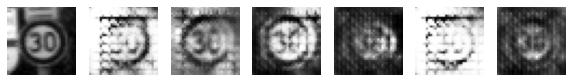

Epoch 4671 g_loss= 0.7736921 d_loss= 1.4457804 real_acc= 0.5 fake_acc= 0.5
Epoch 4672 g_loss= 0.73033 d_loss= 1.4423242 real_acc= 0.56 fake_acc= 0.42
Epoch 4673 g_loss= 0.760595 d_loss= 1.4073886 real_acc= 0.52 fake_acc= 0.46
Epoch 4674 g_loss= 0.7120309 d_loss= 1.3511134 real_acc= 0.64 fake_acc= 0.48
Epoch 4675 g_loss= 0.748466 d_loss= 1.3298352 real_acc= 0.68 fake_acc= 0.46
Epoch 4676 g_loss= 0.70570546 d_loss= 1.3224559 real_acc= 0.7 fake_acc= 0.42
Epoch 4677 g_loss= 0.79124916 d_loss= 1.3127623 real_acc= 0.72 fake_acc= 0.48
Epoch 4678 g_loss= 0.79840773 d_loss= 1.362943 real_acc= 0.62 fake_acc= 0.58
Epoch 4679 g_loss= 0.83990324 d_loss= 1.2656364 real_acc= 0.66 fake_acc= 0.5
Epoch 4680 g_loss= 0.85651803 d_loss= 1.3378303 real_acc= 0.54 fake_acc= 0.6


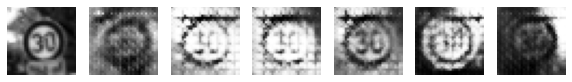

Epoch 4681 g_loss= 0.71264726 d_loss= 1.3769269 real_acc= 0.72 fake_acc= 0.4
Epoch 4682 g_loss= 0.7380685 d_loss= 1.4408681 real_acc= 0.54 fake_acc= 0.48
Epoch 4683 g_loss= 0.859359 d_loss= 1.2756394 real_acc= 0.68 fake_acc= 0.64
Epoch 4684 g_loss= 0.76069933 d_loss= 1.3237779 real_acc= 0.66 fake_acc= 0.5
Epoch 4685 g_loss= 0.69166315 d_loss= 1.3981463 real_acc= 0.6 fake_acc= 0.38
Epoch 4686 g_loss= 0.74774396 d_loss= 1.2608802 real_acc= 0.78 fake_acc= 0.48
Epoch 4687 g_loss= 0.7252447 d_loss= 1.2673206 real_acc= 0.76 fake_acc= 0.44
Epoch 4688 g_loss= 0.8357661 d_loss= 1.1907849 real_acc= 0.76 fake_acc= 0.62
Epoch 4689 g_loss= 0.77303267 d_loss= 1.2419283 real_acc= 0.74 fake_acc= 0.48
Epoch 4690 g_loss= 0.89805293 d_loss= 1.2062919 real_acc= 0.68 fake_acc= 0.74


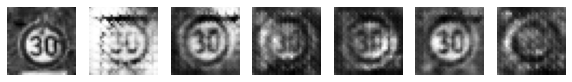

Epoch 4691 g_loss= 0.82536024 d_loss= 1.3180956 real_acc= 0.56 fake_acc= 0.52
Epoch 4692 g_loss= 0.8222005 d_loss= 1.3221481 real_acc= 0.58 fake_acc= 0.5
Epoch 4693 g_loss= 0.8797306 d_loss= 1.2375294 real_acc= 0.7 fake_acc= 0.68
Epoch 4694 g_loss= 0.87917036 d_loss= 1.308543 real_acc= 0.5 fake_acc= 0.68
Epoch 4695 g_loss= 0.83314586 d_loss= 1.266387 real_acc= 0.62 fake_acc= 0.62
Epoch 4696 g_loss= 0.8552959 d_loss= 1.2113628 real_acc= 0.74 fake_acc= 0.54
Epoch 4697 g_loss= 0.8006982 d_loss= 1.2670798 real_acc= 0.7 fake_acc= 0.6
Epoch 4698 g_loss= 0.8063815 d_loss= 1.2205663 real_acc= 0.84 fake_acc= 0.58
Epoch 4699 g_loss= 0.808428 d_loss= 1.2765594 real_acc= 0.76 fake_acc= 0.58
Epoch 4700 g_loss= 0.83807474 d_loss= 1.2544286 real_acc= 0.68 fake_acc= 0.6


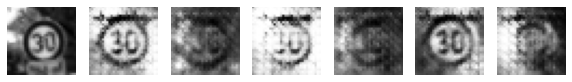

Epoch 4701 g_loss= 0.96369696 d_loss= 1.161358 real_acc= 0.72 fake_acc= 0.74
Epoch 4702 g_loss= 0.8851639 d_loss= 1.1950552 real_acc= 0.74 fake_acc= 0.68
Epoch 4703 g_loss= 0.9047806 d_loss= 1.1971962 real_acc= 0.66 fake_acc= 0.56
Epoch 4704 g_loss= 0.8701768 d_loss= 1.2558591 real_acc= 0.64 fake_acc= 0.64
Epoch 4705 g_loss= 0.8857518 d_loss= 1.2661983 real_acc= 0.62 fake_acc= 0.68
Epoch 4706 g_loss= 0.8065256 d_loss= 1.3318007 real_acc= 0.62 fake_acc= 0.54
Epoch 4707 g_loss= 0.80958724 d_loss= 1.314499 real_acc= 0.68 fake_acc= 0.62
Epoch 4708 g_loss= 0.8099024 d_loss= 1.2815087 real_acc= 0.7 fake_acc= 0.58
Epoch 4709 g_loss= 0.723601 d_loss= 1.3182299 real_acc= 0.7 fake_acc= 0.36
Epoch 4710 g_loss= 0.79089415 d_loss= 1.2105082 real_acc= 0.8 fake_acc= 0.46


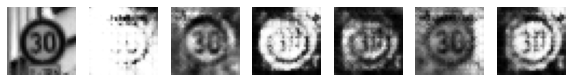

Epoch 4711 g_loss= 0.77434266 d_loss= 1.2795459 real_acc= 0.78 fake_acc= 0.52
Epoch 4712 g_loss= 0.7336439 d_loss= 1.3051232 real_acc= 0.72 fake_acc= 0.44
Epoch 4713 g_loss= 0.7153705 d_loss= 1.2994998 real_acc= 0.8 fake_acc= 0.48
Epoch 4714 g_loss= 0.7592537 d_loss= 1.2473776 real_acc= 0.82 fake_acc= 0.48
Epoch 4715 g_loss= 0.7613454 d_loss= 1.2867689 real_acc= 0.74 fake_acc= 0.52
Epoch 4716 g_loss= 0.7861309 d_loss= 1.3085887 real_acc= 0.7 fake_acc= 0.52
Epoch 4717 g_loss= 0.77391213 d_loss= 1.3289771 real_acc= 0.68 fake_acc= 0.48
Epoch 4718 g_loss= 0.7781538 d_loss= 1.3034189 real_acc= 0.68 fake_acc= 0.48
Epoch 4719 g_loss= 0.79872024 d_loss= 1.3114595 real_acc= 0.66 fake_acc= 0.52
Epoch 4720 g_loss= 0.8229416 d_loss= 1.3034574 real_acc= 0.64 fake_acc= 0.5


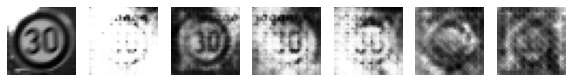

Epoch 4721 g_loss= 0.8065153 d_loss= 1.2835574 real_acc= 0.64 fake_acc= 0.56
Epoch 4722 g_loss= 0.777443 d_loss= 1.2860273 real_acc= 0.66 fake_acc= 0.6
Epoch 4723 g_loss= 0.73554116 d_loss= 1.3704085 real_acc= 0.7 fake_acc= 0.38
Epoch 4724 g_loss= 0.78050673 d_loss= 1.2826743 real_acc= 0.66 fake_acc= 0.56
Epoch 4725 g_loss= 0.7443598 d_loss= 1.3029468 real_acc= 0.84 fake_acc= 0.46
Epoch 4726 g_loss= 0.7356017 d_loss= 1.3124793 real_acc= 0.78 fake_acc= 0.38
Epoch 4727 g_loss= 0.707073 d_loss= 1.2976952 real_acc= 0.78 fake_acc= 0.5
Epoch 4728 g_loss= 0.7144174 d_loss= 1.3676746 real_acc= 0.72 fake_acc= 0.4
Epoch 4729 g_loss= 0.73467195 d_loss= 1.3314981 real_acc= 0.72 fake_acc= 0.44
Epoch 4730 g_loss= 0.72704995 d_loss= 1.3260794 real_acc= 0.72 fake_acc= 0.44


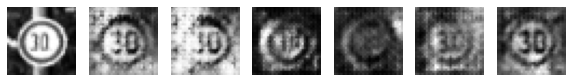

Epoch 4731 g_loss= 0.7463321 d_loss= 1.2976396 real_acc= 0.74 fake_acc= 0.44
Epoch 4732 g_loss= 0.7272352 d_loss= 1.3107256 real_acc= 0.7 fake_acc= 0.38
Epoch 4733 g_loss= 0.8174522 d_loss= 1.3167078 real_acc= 0.6 fake_acc= 0.56
Epoch 4734 g_loss= 0.78790694 d_loss= 1.3525128 real_acc= 0.58 fake_acc= 0.64
Epoch 4735 g_loss= 0.8420312 d_loss= 1.2830977 real_acc= 0.56 fake_acc= 0.64
Epoch 4736 g_loss= 0.79956 d_loss= 1.2490587 real_acc= 0.68 fake_acc= 0.66
Epoch 4737 g_loss= 0.7757661 d_loss= 1.2302287 real_acc= 0.8 fake_acc= 0.64
Epoch 4738 g_loss= 0.79203653 d_loss= 1.2679358 real_acc= 0.74 fake_acc= 0.6
Epoch 4739 g_loss= 0.83067614 d_loss= 1.3029046 real_acc= 0.56 fake_acc= 0.66
Epoch 4740 g_loss= 0.82646066 d_loss= 1.2478849 real_acc= 0.66 fake_acc= 0.74


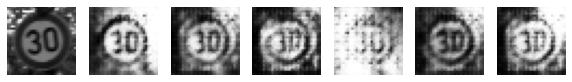

Epoch 4741 g_loss= 0.8285845 d_loss= 1.1957349 real_acc= 0.86 fake_acc= 0.7
Epoch 4742 g_loss= 0.849435 d_loss= 1.247417 real_acc= 0.66 fake_acc= 0.74
Epoch 4743 g_loss= 0.8725844 d_loss= 1.2731295 real_acc= 0.58 fake_acc= 0.76
Epoch 4744 g_loss= 0.8858468 d_loss= 1.2650023 real_acc= 0.62 fake_acc= 0.82
Epoch 4745 g_loss= 0.8528224 d_loss= 1.2787447 real_acc= 0.52 fake_acc= 0.8
Epoch 4746 g_loss= 0.8691657 d_loss= 1.2764528 real_acc= 0.6 fake_acc= 0.76
Epoch 4747 g_loss= 0.86198705 d_loss= 1.2332443 real_acc= 0.68 fake_acc= 0.82
Epoch 4748 g_loss= 0.8727138 d_loss= 1.3118198 real_acc= 0.54 fake_acc= 0.7
Epoch 4749 g_loss= 0.8082148 d_loss= 1.2892764 real_acc= 0.62 fake_acc= 0.72
Epoch 4750 g_loss= 0.831495 d_loss= 1.2823794 real_acc= 0.58 fake_acc= 0.62


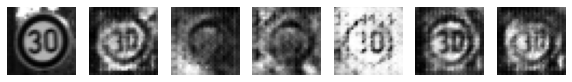

Epoch 4751 g_loss= 0.7991677 d_loss= 1.3048128 real_acc= 0.68 fake_acc= 0.7
Epoch 4752 g_loss= 0.8045069 d_loss= 1.3298949 real_acc= 0.6 fake_acc= 0.54
Epoch 4753 g_loss= 0.75988245 d_loss= 1.3628504 real_acc= 0.6 fake_acc= 0.54
Epoch 4754 g_loss= 0.7639882 d_loss= 1.2748667 real_acc= 0.74 fake_acc= 0.62
Epoch 4755 g_loss= 0.79696107 d_loss= 1.2781547 real_acc= 0.76 fake_acc= 0.68
Epoch 4756 g_loss= 0.7706215 d_loss= 1.2720141 real_acc= 0.74 fake_acc= 0.56
Epoch 4757 g_loss= 0.7861266 d_loss= 1.2594867 real_acc= 0.7 fake_acc= 0.56
Epoch 4758 g_loss= 0.80745226 d_loss= 1.2841586 real_acc= 0.74 fake_acc= 0.66
Epoch 4759 g_loss= 0.83262026 d_loss= 1.2490902 real_acc= 0.74 fake_acc= 0.66
Epoch 4760 g_loss= 0.84513617 d_loss= 1.2881751 real_acc= 0.66 fake_acc= 0.76


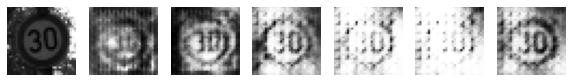

Epoch 4761 g_loss= 0.8509739 d_loss= 1.2694054 real_acc= 0.64 fake_acc= 0.8
Epoch 4762 g_loss= 0.863591 d_loss= 1.3811965 real_acc= 0.48 fake_acc= 0.76
Epoch 4763 g_loss= 0.8879109 d_loss= 1.2474569 real_acc= 0.66 fake_acc= 0.74
Epoch 4764 g_loss= 0.81257546 d_loss= 1.2574811 real_acc= 0.78 fake_acc= 0.62
Epoch 4765 g_loss= 0.90509665 d_loss= 1.3482592 real_acc= 0.58 fake_acc= 0.74
Epoch 4766 g_loss= 0.89173543 d_loss= 1.2705455 real_acc= 0.6 fake_acc= 0.8
Epoch 4767 g_loss= 0.8556196 d_loss= 1.3348156 real_acc= 0.68 fake_acc= 0.68
Epoch 4768 g_loss= 0.81617415 d_loss= 1.2718945 real_acc= 0.78 fake_acc= 0.54
Epoch 4769 g_loss= 0.80214685 d_loss= 1.3061323 real_acc= 0.62 fake_acc= 0.68
Epoch 4770 g_loss= 0.81215566 d_loss= 1.3446571 real_acc= 0.62 fake_acc= 0.52


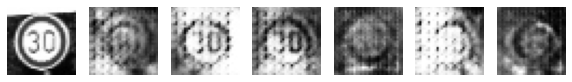

Epoch 4771 g_loss= 0.75176096 d_loss= 1.3877747 real_acc= 0.74 fake_acc= 0.5
Epoch 4772 g_loss= 0.69129974 d_loss= 1.3362467 real_acc= 0.74 fake_acc= 0.42
Epoch 4773 g_loss= 0.6827575 d_loss= 1.3189745 real_acc= 0.84 fake_acc= 0.4
Epoch 4774 g_loss= 0.66677636 d_loss= 1.3227451 real_acc= 0.72 fake_acc= 0.4
Epoch 4775 g_loss= 0.71276283 d_loss= 1.4188265 real_acc= 0.6 fake_acc= 0.32
Epoch 4776 g_loss= 0.7254829 d_loss= 1.2438345 real_acc= 0.78 fake_acc= 0.46
Epoch 4777 g_loss= 0.79678744 d_loss= 1.335327 real_acc= 0.74 fake_acc= 0.46
Epoch 4778 g_loss= 0.7605211 d_loss= 1.3800191 real_acc= 0.66 fake_acc= 0.52
Epoch 4779 g_loss= 0.80927366 d_loss= 1.3235793 real_acc= 0.68 fake_acc= 0.58
Epoch 4780 g_loss= 0.788244 d_loss= 1.3866119 real_acc= 0.58 fake_acc= 0.5


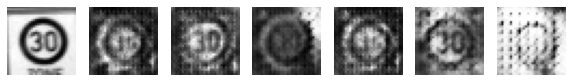

Epoch 4781 g_loss= 0.85513604 d_loss= 1.3718414 real_acc= 0.52 fake_acc= 0.62
Epoch 4782 g_loss= 0.8338316 d_loss= 1.3481331 real_acc= 0.68 fake_acc= 0.56
Epoch 4783 g_loss= 0.73301333 d_loss= 1.2921424 real_acc= 0.78 fake_acc= 0.42
Epoch 4784 g_loss= 0.6992714 d_loss= 1.3141856 real_acc= 0.76 fake_acc= 0.46
Epoch 4785 g_loss= 0.71532476 d_loss= 1.4282746 real_acc= 0.64 fake_acc= 0.34
Epoch 4786 g_loss= 0.7145219 d_loss= 1.3984656 real_acc= 0.6 fake_acc= 0.36
Epoch 4787 g_loss= 0.7129071 d_loss= 1.2986879 real_acc= 0.8 fake_acc= 0.4
Epoch 4788 g_loss= 0.6691488 d_loss= 1.3942428 real_acc= 0.68 fake_acc= 0.32
Epoch 4789 g_loss= 0.7014138 d_loss= 1.3584968 real_acc= 0.66 fake_acc= 0.44
Epoch 4790 g_loss= 0.71837807 d_loss= 1.3429332 real_acc= 0.66 fake_acc= 0.46


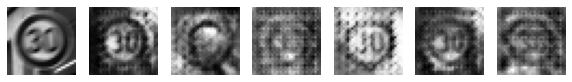

Epoch 4791 g_loss= 0.75944984 d_loss= 1.2898912 real_acc= 0.78 fake_acc= 0.44
Epoch 4792 g_loss= 0.7322467 d_loss= 1.4416115 real_acc= 0.64 fake_acc= 0.44
Epoch 4793 g_loss= 0.72800565 d_loss= 1.355906 real_acc= 0.72 fake_acc= 0.38
Epoch 4794 g_loss= 0.72606546 d_loss= 1.3331392 real_acc= 0.7 fake_acc= 0.48
Epoch 4795 g_loss= 0.7092438 d_loss= 1.4350007 real_acc= 0.58 fake_acc= 0.46
Epoch 4796 g_loss= 0.77292496 d_loss= 1.4305081 real_acc= 0.54 fake_acc= 0.58
Epoch 4797 g_loss= 0.7978216 d_loss= 1.4644246 real_acc= 0.56 fake_acc= 0.64
Epoch 4798 g_loss= 0.78394645 d_loss= 1.473497 real_acc= 0.46 fake_acc= 0.62
Epoch 4799 g_loss= 0.77578515 d_loss= 1.3474541 real_acc= 0.66 fake_acc= 0.5
Epoch 4800 g_loss= 0.728865 d_loss= 1.4209995 real_acc= 0.64 fake_acc= 0.46


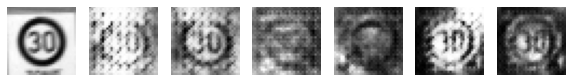

Epoch 4801 g_loss= 0.7247776 d_loss= 1.3520043 real_acc= 0.68 fake_acc= 0.42
Epoch 4802 g_loss= 0.7246916 d_loss= 1.4246469 real_acc= 0.6 fake_acc= 0.44
Epoch 4803 g_loss= 0.6547232 d_loss= 1.4091151 real_acc= 0.6 fake_acc= 0.34
Epoch 4804 g_loss= 0.64220667 d_loss= 1.3981725 real_acc= 0.74 fake_acc= 0.3
Epoch 4805 g_loss= 0.68233657 d_loss= 1.3728825 real_acc= 0.66 fake_acc= 0.34
Epoch 4806 g_loss= 0.64699954 d_loss= 1.4272019 real_acc= 0.58 fake_acc= 0.38
Epoch 4807 g_loss= 0.7143633 d_loss= 1.3883135 real_acc= 0.66 fake_acc= 0.4
Epoch 4808 g_loss= 0.7200853 d_loss= 1.2925153 real_acc= 0.68 fake_acc= 0.46
Epoch 4809 g_loss= 0.77717745 d_loss= 1.3380184 real_acc= 0.56 fake_acc= 0.58
Epoch 4810 g_loss= 0.80009186 d_loss= 1.2730486 real_acc= 0.72 fake_acc= 0.6


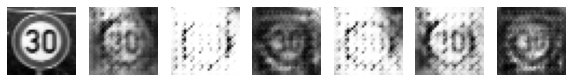

Epoch 4811 g_loss= 0.78699136 d_loss= 1.3200423 real_acc= 0.58 fake_acc= 0.42
Epoch 4812 g_loss= 0.76945513 d_loss= 1.3859634 real_acc= 0.56 fake_acc= 0.46
Epoch 4813 g_loss= 0.8964655 d_loss= 1.3172945 real_acc= 0.56 fake_acc= 0.74
Epoch 4814 g_loss= 0.8912358 d_loss= 1.3272338 real_acc= 0.5 fake_acc= 0.78
Epoch 4815 g_loss= 0.8396771 d_loss= 1.30903 real_acc= 0.56 fake_acc= 0.68
Epoch 4816 g_loss= 0.83366066 d_loss= 1.2968035 real_acc= 0.6 fake_acc= 0.62
Epoch 4817 g_loss= 0.83949643 d_loss= 1.254366 real_acc= 0.68 fake_acc= 0.64
Epoch 4818 g_loss= 0.8056744 d_loss= 1.271666 real_acc= 0.64 fake_acc= 0.62
Epoch 4819 g_loss= 0.7583667 d_loss= 1.2386351 real_acc= 0.76 fake_acc= 0.56
Epoch 4820 g_loss= 0.7893677 d_loss= 1.2315174 real_acc= 0.7 fake_acc= 0.56


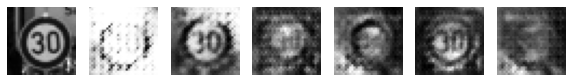

Epoch 4821 g_loss= 0.77101105 d_loss= 1.1733925 real_acc= 0.74 fake_acc= 0.6
Epoch 4822 g_loss= 0.78828883 d_loss= 1.2982906 real_acc= 0.58 fake_acc= 0.56
Epoch 4823 g_loss= 0.81579953 d_loss= 1.2006809 real_acc= 0.76 fake_acc= 0.64
Epoch 4824 g_loss= 0.83614564 d_loss= 1.2818725 real_acc= 0.64 fake_acc= 0.6
Epoch 4825 g_loss= 0.8165199 d_loss= 1.2879732 real_acc= 0.56 fake_acc= 0.68
Epoch 4826 g_loss= 0.84709024 d_loss= 1.2892549 real_acc= 0.58 fake_acc= 0.54
Epoch 4827 g_loss= 0.78796685 d_loss= 1.2678581 real_acc= 0.7 fake_acc= 0.58
Epoch 4828 g_loss= 0.83540016 d_loss= 1.2369626 real_acc= 0.66 fake_acc= 0.66
Epoch 4829 g_loss= 0.79310274 d_loss= 1.3044153 real_acc= 0.7 fake_acc= 0.5
Epoch 4830 g_loss= 0.8353751 d_loss= 1.2644279 real_acc= 0.66 fake_acc= 0.62


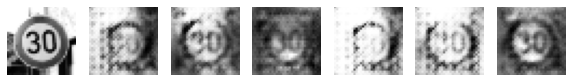

Epoch 4831 g_loss= 0.82649577 d_loss= 1.2332873 real_acc= 0.66 fake_acc= 0.62
Epoch 4832 g_loss= 0.77140856 d_loss= 1.367064 real_acc= 0.6 fake_acc= 0.52
Epoch 4833 g_loss= 0.76389086 d_loss= 1.2381457 real_acc= 0.76 fake_acc= 0.64
Epoch 4834 g_loss= 0.77831453 d_loss= 1.2860934 real_acc= 0.66 fake_acc= 0.52
Epoch 4835 g_loss= 0.7564112 d_loss= 1.2231275 real_acc= 0.76 fake_acc= 0.56
Epoch 4836 g_loss= 0.749548 d_loss= 1.2448902 real_acc= 0.66 fake_acc= 0.5
Epoch 4837 g_loss= 0.7337646 d_loss= 1.2676387 real_acc= 0.76 fake_acc= 0.56
Epoch 4838 g_loss= 0.7421215 d_loss= 1.2530675 real_acc= 0.78 fake_acc= 0.48
Epoch 4839 g_loss= 0.74809784 d_loss= 1.323024 real_acc= 0.64 fake_acc= 0.52
Epoch 4840 g_loss= 0.7915365 d_loss= 1.3175788 real_acc= 0.54 fake_acc= 0.64


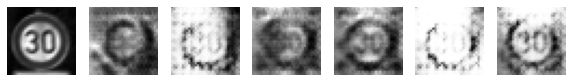

Epoch 4841 g_loss= 0.7534349 d_loss= 1.359329 real_acc= 0.54 fake_acc= 0.56
Epoch 4842 g_loss= 0.788895 d_loss= 1.3112392 real_acc= 0.54 fake_acc= 0.62
Epoch 4843 g_loss= 0.79343635 d_loss= 1.332277 real_acc= 0.52 fake_acc= 0.58
Epoch 4844 g_loss= 0.77492654 d_loss= 1.3244591 real_acc= 0.6 fake_acc= 0.58
Epoch 4845 g_loss= 0.7818862 d_loss= 1.3780959 real_acc= 0.56 fake_acc= 0.56
Epoch 4846 g_loss= 0.7149506 d_loss= 1.3803723 real_acc= 0.56 fake_acc= 0.42
Epoch 4847 g_loss= 0.7446735 d_loss= 1.3988935 real_acc= 0.5 fake_acc= 0.52
Epoch 4848 g_loss= 0.6666908 d_loss= 1.4273076 real_acc= 0.58 fake_acc= 0.36
Epoch 4849 g_loss= 0.67460907 d_loss= 1.3506405 real_acc= 0.64 fake_acc= 0.32
Epoch 4850 g_loss= 0.6596134 d_loss= 1.3592114 real_acc= 0.72 fake_acc= 0.28


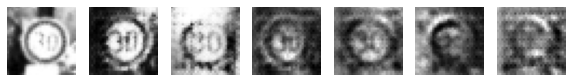

Epoch 4851 g_loss= 0.6279604 d_loss= 1.362442 real_acc= 0.74 fake_acc= 0.28
Epoch 4852 g_loss= 0.64086074 d_loss= 1.3923559 real_acc= 0.66 fake_acc= 0.26
Epoch 4853 g_loss= 0.67515975 d_loss= 1.3959159 real_acc= 0.62 fake_acc= 0.3
Epoch 4854 g_loss= 0.671438 d_loss= 1.3854599 real_acc= 0.62 fake_acc= 0.34
Epoch 4855 g_loss= 0.70971876 d_loss= 1.4015374 real_acc= 0.58 fake_acc= 0.3
Epoch 4856 g_loss= 0.7504828 d_loss= 1.4259204 real_acc= 0.5 fake_acc= 0.5
Epoch 4857 g_loss= 0.7589489 d_loss= 1.4087827 real_acc= 0.42 fake_acc= 0.48
Epoch 4858 g_loss= 0.7998317 d_loss= 1.3524542 real_acc= 0.58 fake_acc= 0.58
Epoch 4859 g_loss= 0.75775826 d_loss= 1.4042279 real_acc= 0.5 fake_acc= 0.56
Epoch 4860 g_loss= 0.7076966 d_loss= 1.4508779 real_acc= 0.52 fake_acc= 0.44


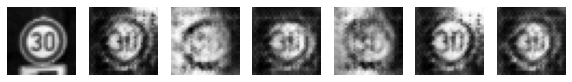

Epoch 4861 g_loss= 0.7362484 d_loss= 1.3608179 real_acc= 0.68 fake_acc= 0.44
Epoch 4862 g_loss= 0.64265805 d_loss= 1.4207103 real_acc= 0.68 fake_acc= 0.26
Epoch 4863 g_loss= 0.6418888 d_loss= 1.4010501 real_acc= 0.76 fake_acc= 0.24
Epoch 4864 g_loss= 0.63633585 d_loss= 1.3963869 real_acc= 0.74 fake_acc= 0.32
Epoch 4865 g_loss= 0.63850576 d_loss= 1.3979483 real_acc= 0.68 fake_acc= 0.3
Epoch 4866 g_loss= 0.64389914 d_loss= 1.4457324 real_acc= 0.68 fake_acc= 0.3
Epoch 4867 g_loss= 0.6374923 d_loss= 1.4026994 real_acc= 0.76 fake_acc= 0.3
Epoch 4868 g_loss= 0.70755804 d_loss= 1.33182 real_acc= 0.82 fake_acc= 0.36
Epoch 4869 g_loss= 0.6825099 d_loss= 1.2888112 real_acc= 0.9 fake_acc= 0.38
Epoch 4870 g_loss= 0.7156555 d_loss= 1.3573105 real_acc= 0.7 fake_acc= 0.42


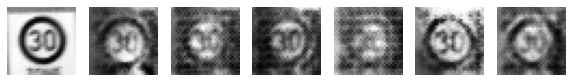

Epoch 4871 g_loss= 0.74089277 d_loss= 1.2882719 real_acc= 0.84 fake_acc= 0.42
Epoch 4872 g_loss= 0.7964592 d_loss= 1.2905731 real_acc= 0.68 fake_acc= 0.56
Epoch 4873 g_loss= 0.7854628 d_loss= 1.2984113 real_acc= 0.74 fake_acc= 0.5
Epoch 4874 g_loss= 0.7937544 d_loss= 1.3132447 real_acc= 0.64 fake_acc= 0.62
Epoch 4875 g_loss= 0.83692765 d_loss= 1.3259697 real_acc= 0.56 fake_acc= 0.62
Epoch 4876 g_loss= 0.80967087 d_loss= 1.2472284 real_acc= 0.76 fake_acc= 0.54
Epoch 4877 g_loss= 0.75526965 d_loss= 1.2625064 real_acc= 0.84 fake_acc= 0.48
Epoch 4878 g_loss= 0.74981743 d_loss= 1.2373888 real_acc= 0.84 fake_acc= 0.58
Epoch 4879 g_loss= 0.73662543 d_loss= 1.2565207 real_acc= 0.84 fake_acc= 0.56
Epoch 4880 g_loss= 0.74274635 d_loss= 1.2419887 real_acc= 0.9 fake_acc= 0.42


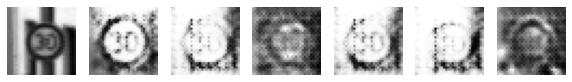

Epoch 4881 g_loss= 0.7313813 d_loss= 1.2030902 real_acc= 0.88 fake_acc= 0.5
Epoch 4882 g_loss= 0.82283705 d_loss= 1.1494405 real_acc= 0.8 fake_acc= 0.58
Epoch 4883 g_loss= 0.8306874 d_loss= 1.1468527 real_acc= 0.9 fake_acc= 0.64
Epoch 4884 g_loss= 0.855415 d_loss= 1.1598793 real_acc= 0.88 fake_acc= 0.82
Epoch 4885 g_loss= 0.90019524 d_loss= 1.1388698 real_acc= 0.8 fake_acc= 0.74
Epoch 4886 g_loss= 0.92135465 d_loss= 1.1292887 real_acc= 0.78 fake_acc= 0.88
Epoch 4887 g_loss= 0.9900796 d_loss= 1.1528978 real_acc= 0.62 fake_acc= 0.86
Epoch 4888 g_loss= 0.92392266 d_loss= 1.1345549 real_acc= 0.8 fake_acc= 0.88
Epoch 4889 g_loss= 0.9487638 d_loss= 1.1506695 real_acc= 0.74 fake_acc= 0.88
Epoch 4890 g_loss= 1.0231729 d_loss= 1.134261 real_acc= 0.68 fake_acc= 0.92


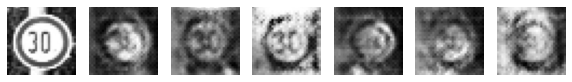

Epoch 4891 g_loss= 1.0381801 d_loss= 1.186973 real_acc= 0.56 fake_acc= 0.98
Epoch 4892 g_loss= 0.90006137 d_loss= 1.1103323 real_acc= 0.76 fake_acc= 0.94
Epoch 4893 g_loss= 0.86185616 d_loss= 1.1654679 real_acc= 0.82 fake_acc= 0.84
Epoch 4894 g_loss= 0.9446875 d_loss= 1.0410887 real_acc= 0.92 fake_acc= 0.92
Epoch 4895 g_loss= 0.88472193 d_loss= 1.07036 real_acc= 0.94 fake_acc= 0.82
Epoch 4896 g_loss= 0.9038868 d_loss= 1.0519749 real_acc= 0.92 fake_acc= 0.82
Epoch 4897 g_loss= 0.8751098 d_loss= 1.0496168 real_acc= 0.94 fake_acc= 0.84
Epoch 4898 g_loss= 0.88795507 d_loss= 1.1467755 real_acc= 0.74 fake_acc= 0.78
Epoch 4899 g_loss= 0.9415229 d_loss= 1.0442717 real_acc= 0.88 fake_acc= 0.88
Epoch 4900 g_loss= 0.92036146 d_loss= 1.1328952 real_acc= 0.74 fake_acc= 0.94


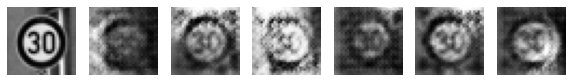

Epoch 4901 g_loss= 0.90493655 d_loss= 1.1051319 real_acc= 0.78 fake_acc= 0.84
Epoch 4902 g_loss= 0.9745445 d_loss= 1.0938997 real_acc= 0.66 fake_acc= 0.94
Epoch 4903 g_loss= 0.95901597 d_loss= 1.1207769 real_acc= 0.72 fake_acc= 0.9
Epoch 4904 g_loss= 0.8834064 d_loss= 1.1564541 real_acc= 0.74 fake_acc= 0.8
Epoch 4905 g_loss= 0.9776456 d_loss= 1.0731478 real_acc= 0.76 fake_acc= 0.92
Epoch 4906 g_loss= 0.8847278 d_loss= 1.1792663 real_acc= 0.62 fake_acc= 0.86
Epoch 4907 g_loss= 0.9326725 d_loss= 1.1705995 real_acc= 0.7 fake_acc= 0.86
Epoch 4908 g_loss= 0.9213161 d_loss= 1.1297063 real_acc= 0.72 fake_acc= 0.88
Epoch 4909 g_loss= 0.8074376 d_loss= 1.2172523 real_acc= 0.78 fake_acc= 0.66
Epoch 4910 g_loss= 0.8568379 d_loss= 1.2133026 real_acc= 0.7 fake_acc= 0.8


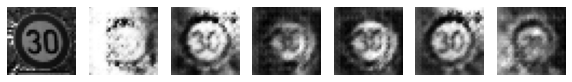

Epoch 4911 g_loss= 0.87096614 d_loss= 1.2783558 real_acc= 0.6 fake_acc= 0.86
Epoch 4912 g_loss= 0.8710174 d_loss= 1.2470311 real_acc= 0.66 fake_acc= 0.76
Epoch 4913 g_loss= 0.8362175 d_loss= 1.2753344 real_acc= 0.5 fake_acc= 0.7
Epoch 4914 g_loss= 0.87370926 d_loss= 1.2735559 real_acc= 0.56 fake_acc= 0.82
Epoch 4915 g_loss= 0.8958533 d_loss= 1.3765414 real_acc= 0.54 fake_acc= 0.76
Epoch 4916 g_loss= 0.7957467 d_loss= 1.402215 real_acc= 0.52 fake_acc= 0.74
Epoch 4917 g_loss= 0.7729816 d_loss= 1.3264872 real_acc= 0.6 fake_acc= 0.64
Epoch 4918 g_loss= 0.798653 d_loss= 1.3250638 real_acc= 0.56 fake_acc= 0.66
Epoch 4919 g_loss= 0.7699574 d_loss= 1.4213877 real_acc= 0.48 fake_acc= 0.66
Epoch 4920 g_loss= 0.80990237 d_loss= 1.2525554 real_acc= 0.68 fake_acc= 0.68


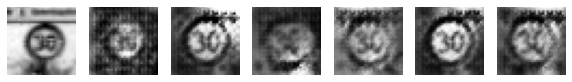

Epoch 4921 g_loss= 0.7073068 d_loss= 1.3560734 real_acc= 0.7 fake_acc= 0.62
Epoch 4922 g_loss= 0.74584466 d_loss= 1.3961878 real_acc= 0.6 fake_acc= 0.58
Epoch 4923 g_loss= 0.6947766 d_loss= 1.4255528 real_acc= 0.58 fake_acc= 0.46
Epoch 4924 g_loss= 0.68753546 d_loss= 1.3573313 real_acc= 0.66 fake_acc= 0.48
Epoch 4925 g_loss= 0.7047004 d_loss= 1.4409146 real_acc= 0.48 fake_acc= 0.54
Epoch 4926 g_loss= 0.723713 d_loss= 1.3472301 real_acc= 0.68 fake_acc= 0.54
Epoch 4927 g_loss= 0.7074282 d_loss= 1.3517249 real_acc= 0.74 fake_acc= 0.44
Epoch 4928 g_loss= 0.7437529 d_loss= 1.3165107 real_acc= 0.64 fake_acc= 0.48
Epoch 4929 g_loss= 0.7825196 d_loss= 1.3241422 real_acc= 0.62 fake_acc= 0.5
Epoch 4930 g_loss= 0.78965515 d_loss= 1.2623918 real_acc= 0.68 fake_acc= 0.64


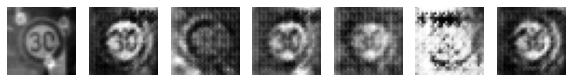

Epoch 4931 g_loss= 0.79989207 d_loss= 1.3830348 real_acc= 0.5 fake_acc= 0.7
Epoch 4932 g_loss= 0.8524625 d_loss= 1.2976884 real_acc= 0.6 fake_acc= 0.74
Epoch 4933 g_loss= 0.84208983 d_loss= 1.3653235 real_acc= 0.62 fake_acc= 0.72
Epoch 4934 g_loss= 0.7793419 d_loss= 1.3033671 real_acc= 0.72 fake_acc= 0.5
Epoch 4935 g_loss= 0.7869764 d_loss= 1.2145795 real_acc= 0.8 fake_acc= 0.6
Epoch 4936 g_loss= 0.7872328 d_loss= 1.2651908 real_acc= 0.7 fake_acc= 0.52
Epoch 4937 g_loss= 0.77810067 d_loss= 1.2569125 real_acc= 0.68 fake_acc= 0.48
Epoch 4938 g_loss= 0.70670927 d_loss= 1.251853 real_acc= 0.8 fake_acc= 0.4
Epoch 4939 g_loss= 0.74481356 d_loss= 1.2784032 real_acc= 0.76 fake_acc= 0.56
Epoch 4940 g_loss= 0.7914176 d_loss= 1.213187 real_acc= 0.76 fake_acc= 0.56


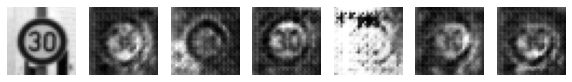

Epoch 4941 g_loss= 0.7706422 d_loss= 1.2221693 real_acc= 0.82 fake_acc= 0.54
Epoch 4942 g_loss= 0.85997635 d_loss= 1.1589165 real_acc= 0.7 fake_acc= 0.7
Epoch 4943 g_loss= 0.9046285 d_loss= 1.1758057 real_acc= 0.7 fake_acc= 0.86
Epoch 4944 g_loss= 0.95241874 d_loss= 1.1445776 real_acc= 0.72 fake_acc= 0.84
Epoch 4945 g_loss= 0.9560845 d_loss= 1.1488087 real_acc= 0.7 fake_acc= 0.84
Epoch 4946 g_loss= 1.0427912 d_loss= 1.1111007 real_acc= 0.7 fake_acc= 0.86
Epoch 4947 g_loss= 0.96688896 d_loss= 1.12251 real_acc= 0.7 fake_acc= 0.8
Epoch 4948 g_loss= 0.85727996 d_loss= 1.1494734 real_acc= 0.76 fake_acc= 0.8
Epoch 4949 g_loss= 0.83958524 d_loss= 1.193841 real_acc= 0.72 fake_acc= 0.68
Epoch 4950 g_loss= 0.8850517 d_loss= 1.1355773 real_acc= 0.82 fake_acc= 0.68


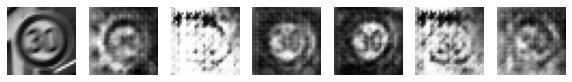

Epoch 4951 g_loss= 0.8543458 d_loss= 1.0863584 real_acc= 0.88 fake_acc= 0.68
Epoch 4952 g_loss= 0.8635884 d_loss= 1.126159 real_acc= 0.9 fake_acc= 0.78
Epoch 4953 g_loss= 0.80828685 d_loss= 1.0916196 real_acc= 0.92 fake_acc= 0.68
Epoch 4954 g_loss= 0.8410931 d_loss= 1.137733 real_acc= 0.84 fake_acc= 0.72
Epoch 4955 g_loss= 0.9325417 d_loss= 1.1198772 real_acc= 0.7 fake_acc= 0.82
Epoch 4956 g_loss= 1.0231687 d_loss= 1.0678499 real_acc= 0.74 fake_acc= 0.94
Epoch 4957 g_loss= 1.088533 d_loss= 1.0904075 real_acc= 0.74 fake_acc= 0.82
Epoch 4958 g_loss= 1.085526 d_loss= 1.1328521 real_acc= 0.64 fake_acc= 0.88
Epoch 4959 g_loss= 1.0384892 d_loss= 1.1260769 real_acc= 0.64 fake_acc= 0.88
Epoch 4960 g_loss= 0.9317199 d_loss= 1.1912098 real_acc= 0.58 fake_acc= 0.92


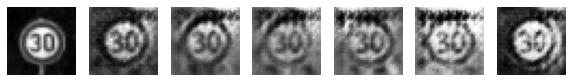

Epoch 4961 g_loss= 0.90261763 d_loss= 1.078482 real_acc= 0.82 fake_acc= 0.78
Epoch 4962 g_loss= 0.86635506 d_loss= 1.1640496 real_acc= 0.76 fake_acc= 0.64
Epoch 4963 g_loss= 0.8917805 d_loss= 1.1262326 real_acc= 0.78 fake_acc= 0.76
Epoch 4964 g_loss= 0.8117479 d_loss= 1.1648722 real_acc= 0.82 fake_acc= 0.58
Epoch 4965 g_loss= 0.8839274 d_loss= 1.1007411 real_acc= 0.92 fake_acc= 0.72
Epoch 4966 g_loss= 0.9309924 d_loss= 1.1945753 real_acc= 0.7 fake_acc= 0.72
Epoch 4967 g_loss= 1.0478616 d_loss= 1.2255065 real_acc= 0.54 fake_acc= 0.82
Epoch 4968 g_loss= 0.9568549 d_loss= 1.2191722 real_acc= 0.76 fake_acc= 0.8
Epoch 4969 g_loss= 0.91206276 d_loss= 1.2469912 real_acc= 0.74 fake_acc= 0.62
Epoch 4970 g_loss= 0.88678795 d_loss= 1.3437343 real_acc= 0.6 fake_acc= 0.6


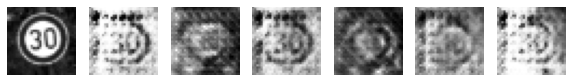

Epoch 4971 g_loss= 0.8405181 d_loss= 1.4223626 real_acc= 0.52 fake_acc= 0.56
Epoch 4972 g_loss= 0.74926084 d_loss= 1.3017008 real_acc= 0.64 fake_acc= 0.5
Epoch 4973 g_loss= 0.7154391 d_loss= 1.3867824 real_acc= 0.74 fake_acc= 0.36
Epoch 4974 g_loss= 0.68750465 d_loss= 1.4068696 real_acc= 0.66 fake_acc= 0.42
Epoch 4975 g_loss= 0.6129155 d_loss= 1.4406078 real_acc= 0.68 fake_acc= 0.3
Epoch 4976 g_loss= 0.61985636 d_loss= 1.5797439 real_acc= 0.56 fake_acc= 0.32
Epoch 4977 g_loss= 0.68329954 d_loss= 1.3897499 real_acc= 0.64 fake_acc= 0.46
Epoch 4978 g_loss= 0.7109034 d_loss= 1.4128072 real_acc= 0.66 fake_acc= 0.44
Epoch 4979 g_loss= 0.7822101 d_loss= 1.5736918 real_acc= 0.48 fake_acc= 0.52
Epoch 4980 g_loss= 0.8651725 d_loss= 1.4628067 real_acc= 0.56 fake_acc= 0.6


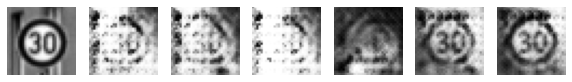

Epoch 4981 g_loss= 0.7985708 d_loss= 1.5177761 real_acc= 0.56 fake_acc= 0.5
Epoch 4982 g_loss= 0.73056406 d_loss= 1.5103507 real_acc= 0.58 fake_acc= 0.46
Epoch 4983 g_loss= 0.69455695 d_loss= 1.5337582 real_acc= 0.56 fake_acc= 0.42
Epoch 4984 g_loss= 0.66137034 d_loss= 1.6006978 real_acc= 0.6 fake_acc= 0.28
Epoch 4985 g_loss= 0.6811652 d_loss= 1.5694305 real_acc= 0.6 fake_acc= 0.26
Epoch 4986 g_loss= 0.5829546 d_loss= 1.544009 real_acc= 0.62 fake_acc= 0.18
Epoch 4987 g_loss= 0.63181055 d_loss= 1.5312316 real_acc= 0.64 fake_acc= 0.3
Epoch 4988 g_loss= 0.6677902 d_loss= 1.5581679 real_acc= 0.56 fake_acc= 0.42
Epoch 4989 g_loss= 0.74560326 d_loss= 1.5425305 real_acc= 0.54 fake_acc= 0.38
Epoch 4990 g_loss= 0.83629173 d_loss= 1.4472302 real_acc= 0.5 fake_acc= 0.58


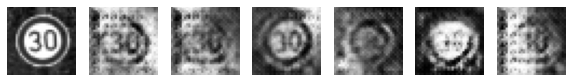

Epoch 4991 g_loss= 0.8534819 d_loss= 1.4801128 real_acc= 0.56 fake_acc= 0.62
Epoch 4992 g_loss= 0.6977035 d_loss= 1.557146 real_acc= 0.52 fake_acc= 0.48
Epoch 4993 g_loss= 0.7172799 d_loss= 1.4645452 real_acc= 0.6 fake_acc= 0.44
Epoch 4994 g_loss= 0.6937353 d_loss= 1.4694095 real_acc= 0.6 fake_acc= 0.32
Epoch 4995 g_loss= 0.75646347 d_loss= 1.4052017 real_acc= 0.7 fake_acc= 0.38
Epoch 4996 g_loss= 0.67212695 d_loss= 1.4576309 real_acc= 0.68 fake_acc= 0.34
Epoch 4997 g_loss= 0.70195127 d_loss= 1.4520215 real_acc= 0.62 fake_acc= 0.44
Epoch 4998 g_loss= 0.67507553 d_loss= 1.5429817 real_acc= 0.54 fake_acc= 0.34
Epoch 4999 g_loss= 0.6960007 d_loss= 1.4694402 real_acc= 0.66 fake_acc= 0.4
Epoch 5000 g_loss= 0.834614 d_loss= 1.3036679 real_acc= 0.64 fake_acc= 0.48


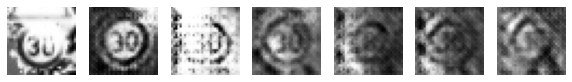

Epoch 5001 g_loss= 0.8438251 d_loss= 1.3970935 real_acc= 0.58 fake_acc= 0.66
Epoch 5002 g_loss= 0.84394556 d_loss= 1.5078881 real_acc= 0.48 fake_acc= 0.62
Epoch 5003 g_loss= 0.84930205 d_loss= 1.5189967 real_acc= 0.38 fake_acc= 0.7
Epoch 5004 g_loss= 0.8360505 d_loss= 1.3247275 real_acc= 0.64 fake_acc= 0.62
Epoch 5005 g_loss= 0.8256668 d_loss= 1.3468103 real_acc= 0.62 fake_acc= 0.62
Epoch 5006 g_loss= 0.73207694 d_loss= 1.36344 real_acc= 0.66 fake_acc= 0.42
Epoch 5007 g_loss= 0.7189955 d_loss= 1.3714297 real_acc= 0.64 fake_acc= 0.44
Epoch 5008 g_loss= 0.67922056 d_loss= 1.373318 real_acc= 0.76 fake_acc= 0.3
Epoch 5009 g_loss= 0.69515777 d_loss= 1.4350152 real_acc= 0.66 fake_acc= 0.36
Epoch 5010 g_loss= 0.7624793 d_loss= 1.3942795 real_acc= 0.66 fake_acc= 0.52


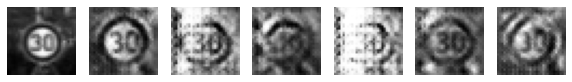

Epoch 5011 g_loss= 0.68871915 d_loss= 1.457222 real_acc= 0.54 fake_acc= 0.42
Epoch 5012 g_loss= 0.8301955 d_loss= 1.302039 real_acc= 0.76 fake_acc= 0.58
Epoch 5013 g_loss= 0.7595038 d_loss= 1.3437538 real_acc= 0.7 fake_acc= 0.5
Epoch 5014 g_loss= 0.8935524 d_loss= 1.3668909 real_acc= 0.44 fake_acc= 0.76
Epoch 5015 g_loss= 0.84990096 d_loss= 1.3978953 real_acc= 0.54 fake_acc= 0.66
Epoch 5016 g_loss= 0.8520808 d_loss= 1.4355451 real_acc= 0.42 fake_acc= 0.8
Epoch 5017 g_loss= 0.8211283 d_loss= 1.3973606 real_acc= 0.56 fake_acc= 0.58
Epoch 5018 g_loss= 0.7842536 d_loss= 1.3969315 real_acc= 0.5 fake_acc= 0.66
Epoch 5019 g_loss= 0.6862058 d_loss= 1.3683633 real_acc= 0.62 fake_acc= 0.42
Epoch 5020 g_loss= 0.7544389 d_loss= 1.3181281 real_acc= 0.72 fake_acc= 0.52


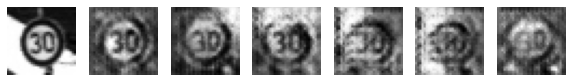

Epoch 5021 g_loss= 0.7791347 d_loss= 1.3177955 real_acc= 0.64 fake_acc= 0.56
Epoch 5022 g_loss= 0.74728984 d_loss= 1.3527606 real_acc= 0.72 fake_acc= 0.52
Epoch 5023 g_loss= 0.7791737 d_loss= 1.3246626 real_acc= 0.64 fake_acc= 0.62
Epoch 5024 g_loss= 0.781972 d_loss= 1.3998687 real_acc= 0.58 fake_acc= 0.6
Epoch 5025 g_loss= 0.75471115 d_loss= 1.3055832 real_acc= 0.74 fake_acc= 0.6
Epoch 5026 g_loss= 0.82292175 d_loss= 1.2838125 real_acc= 0.68 fake_acc= 0.66
Epoch 5027 g_loss= 0.7910428 d_loss= 1.3204125 real_acc= 0.58 fake_acc= 0.62
Epoch 5028 g_loss= 0.83827543 d_loss= 1.3586539 real_acc= 0.64 fake_acc= 0.66
Epoch 5029 g_loss= 0.87015945 d_loss= 1.2822453 real_acc= 0.6 fake_acc= 0.7
Epoch 5030 g_loss= 0.87669355 d_loss= 1.2795317 real_acc= 0.64 fake_acc= 0.76


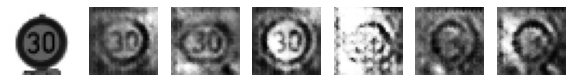

Epoch 5031 g_loss= 0.8868231 d_loss= 1.2909409 real_acc= 0.52 fake_acc= 0.72
Epoch 5032 g_loss= 0.8756511 d_loss= 1.2498763 real_acc= 0.56 fake_acc= 0.78
Epoch 5033 g_loss= 0.8185574 d_loss= 1.2951114 real_acc= 0.62 fake_acc= 0.72
Epoch 5034 g_loss= 0.8149276 d_loss= 1.2655058 real_acc= 0.76 fake_acc= 0.64
Epoch 5035 g_loss= 0.82956976 d_loss= 1.2348961 real_acc= 0.74 fake_acc= 0.7
Epoch 5036 g_loss= 0.8613424 d_loss= 1.2378488 real_acc= 0.62 fake_acc= 0.64
Epoch 5037 g_loss= 0.8358503 d_loss= 1.3290763 real_acc= 0.58 fake_acc= 0.68
Epoch 5038 g_loss= 0.91977113 d_loss= 1.249543 real_acc= 0.58 fake_acc= 0.78
Epoch 5039 g_loss= 0.90154815 d_loss= 1.229882 real_acc= 0.66 fake_acc= 0.78
Epoch 5040 g_loss= 0.9045698 d_loss= 1.3135737 real_acc= 0.54 fake_acc= 0.74


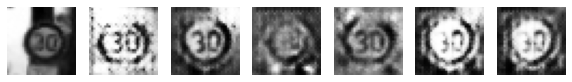

Epoch 5041 g_loss= 0.8340253 d_loss= 1.2714564 real_acc= 0.68 fake_acc= 0.64
Epoch 5042 g_loss= 0.8582425 d_loss= 1.3072054 real_acc= 0.6 fake_acc= 0.68
Epoch 5043 g_loss= 0.7746593 d_loss= 1.2817702 real_acc= 0.72 fake_acc= 0.56
Epoch 5044 g_loss= 0.6821183 d_loss= 1.3419883 real_acc= 0.78 fake_acc= 0.44
Epoch 5045 g_loss= 0.81241953 d_loss= 1.2511306 real_acc= 0.78 fake_acc= 0.62
Epoch 5046 g_loss= 0.8310593 d_loss= 1.2592772 real_acc= 0.64 fake_acc= 0.68
Epoch 5047 g_loss= 0.9506193 d_loss= 1.2614326 real_acc= 0.6 fake_acc= 0.76
Epoch 5048 g_loss= 1.064726 d_loss= 1.1881101 real_acc= 0.64 fake_acc= 0.88
Epoch 5049 g_loss= 0.942492 d_loss= 1.2121589 real_acc= 0.74 fake_acc= 0.66
Epoch 5050 g_loss= 0.95217794 d_loss= 1.2763205 real_acc= 0.56 fake_acc= 0.76


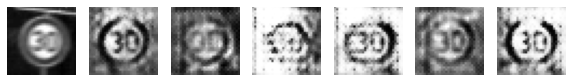

Epoch 5051 g_loss= 0.89877325 d_loss= 1.2151384 real_acc= 0.6 fake_acc= 0.78
Epoch 5052 g_loss= 0.8820894 d_loss= 1.2101526 real_acc= 0.76 fake_acc= 0.62
Epoch 5053 g_loss= 0.84256494 d_loss= 1.264576 real_acc= 0.68 fake_acc= 0.6
Epoch 5054 g_loss= 0.7659978 d_loss= 1.2104152 real_acc= 0.86 fake_acc= 0.46
Epoch 5055 g_loss= 0.89405406 d_loss= 1.2154177 real_acc= 0.68 fake_acc= 0.66
Epoch 5056 g_loss= 0.8606535 d_loss= 1.2672043 real_acc= 0.76 fake_acc= 0.66
Epoch 5057 g_loss= 1.0059483 d_loss= 1.1781138 real_acc= 0.72 fake_acc= 0.74
Epoch 5058 g_loss= 0.99500865 d_loss= 1.2257895 real_acc= 0.6 fake_acc= 0.74
Epoch 5059 g_loss= 1.081738 d_loss= 1.0960572 real_acc= 0.74 fake_acc= 0.76
Epoch 5060 g_loss= 0.950681 d_loss= 1.165231 real_acc= 0.7 fake_acc= 0.76


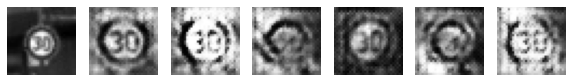

Epoch 5061 g_loss= 0.8601434 d_loss= 1.1910038 real_acc= 0.76 fake_acc= 0.66
Epoch 5062 g_loss= 0.84808654 d_loss= 1.180318 real_acc= 0.78 fake_acc= 0.68
Epoch 5063 g_loss= 0.88658065 d_loss= 1.2407598 real_acc= 0.62 fake_acc= 0.62
Epoch 5064 g_loss= 0.9107972 d_loss= 1.1678333 real_acc= 0.8 fake_acc= 0.58
Epoch 5065 g_loss= 0.9734867 d_loss= 1.1901479 real_acc= 0.72 fake_acc= 0.76
Epoch 5066 g_loss= 0.9445534 d_loss= 1.2295222 real_acc= 0.72 fake_acc= 0.68
Epoch 5067 g_loss= 1.0512761 d_loss= 1.2828324 real_acc= 0.62 fake_acc= 0.68
Epoch 5068 g_loss= 0.9632576 d_loss= 1.2188385 real_acc= 0.7 fake_acc= 0.66
Epoch 5069 g_loss= 0.91579825 d_loss= 1.4152167 real_acc= 0.5 fake_acc= 0.72
Epoch 5070 g_loss= 1.0810645 d_loss= 1.2425098 real_acc= 0.7 fake_acc= 0.74


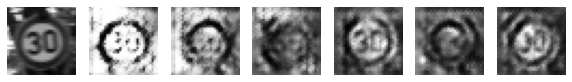

Epoch 5071 g_loss= 0.88190216 d_loss= 1.3315822 real_acc= 0.58 fake_acc= 0.64
Epoch 5072 g_loss= 0.8103667 d_loss= 1.3082786 real_acc= 0.7 fake_acc= 0.6
Epoch 5073 g_loss= 0.7302611 d_loss= 1.3962722 real_acc= 0.7 fake_acc= 0.6
Epoch 5074 g_loss= 0.77517587 d_loss= 1.3714725 real_acc= 0.62 fake_acc= 0.52
Epoch 5075 g_loss= 0.7793351 d_loss= 1.3642277 real_acc= 0.62 fake_acc= 0.48
Epoch 5076 g_loss= 0.8046638 d_loss= 1.3543863 real_acc= 0.7 fake_acc= 0.62
Epoch 5077 g_loss= 0.8489274 d_loss= 1.3057822 real_acc= 0.58 fake_acc= 0.62
Epoch 5078 g_loss= 0.8533442 d_loss= 1.340105 real_acc= 0.6 fake_acc= 0.66
Epoch 5079 g_loss= 0.86579317 d_loss= 1.422744 real_acc= 0.46 fake_acc= 0.64
Epoch 5080 g_loss= 0.7844171 d_loss= 1.5255668 real_acc= 0.44 fake_acc= 0.52


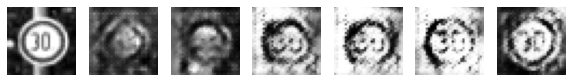

Epoch 5081 g_loss= 0.8117529 d_loss= 1.4167104 real_acc= 0.54 fake_acc= 0.6
Epoch 5082 g_loss= 0.68455535 d_loss= 1.5143435 real_acc= 0.56 fake_acc= 0.34
Epoch 5083 g_loss= 0.75046486 d_loss= 1.4971168 real_acc= 0.48 fake_acc= 0.56
Epoch 5084 g_loss= 0.68303525 d_loss= 1.460216 real_acc= 0.52 fake_acc= 0.42
Epoch 5085 g_loss= 0.6310528 d_loss= 1.6840034 real_acc= 0.36 fake_acc= 0.3
Epoch 5086 g_loss= 0.654596 d_loss= 1.6836255 real_acc= 0.38 fake_acc= 0.46
Epoch 5087 g_loss= 0.6461081 d_loss= 1.5122511 real_acc= 0.58 fake_acc= 0.34
Epoch 5088 g_loss= 0.64141005 d_loss= 1.5734076 real_acc= 0.44 fake_acc= 0.4
Epoch 5089 g_loss= 0.65697145 d_loss= 1.600173 real_acc= 0.34 fake_acc= 0.36
Epoch 5090 g_loss= 0.69477063 d_loss= 1.5869007 real_acc= 0.46 fake_acc= 0.46


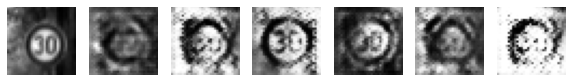

Epoch 5091 g_loss= 0.7770574 d_loss= 1.4872338 real_acc= 0.42 fake_acc= 0.48
Epoch 5092 g_loss= 0.7601428 d_loss= 1.5283799 real_acc= 0.4 fake_acc= 0.5
Epoch 5093 g_loss= 0.733629 d_loss= 1.5219605 real_acc= 0.44 fake_acc= 0.5
Epoch 5094 g_loss= 0.729687 d_loss= 1.6278789 real_acc= 0.32 fake_acc= 0.46
Epoch 5095 g_loss= 0.65668565 d_loss= 1.6108205 real_acc= 0.34 fake_acc= 0.36
Epoch 5096 g_loss= 0.6863509 d_loss= 1.5110203 real_acc= 0.58 fake_acc= 0.38
Epoch 5097 g_loss= 0.65498275 d_loss= 1.46802 real_acc= 0.5 fake_acc= 0.36
Epoch 5098 g_loss= 0.62868935 d_loss= 1.508152 real_acc= 0.58 fake_acc= 0.3
Epoch 5099 g_loss= 0.6511081 d_loss= 1.5218713 real_acc= 0.48 fake_acc= 0.36
Epoch 5100 g_loss= 0.6809404 d_loss= 1.4410082 real_acc= 0.56 fake_acc= 0.4


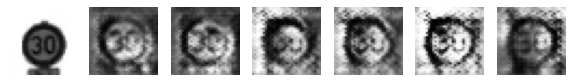

Epoch 5101 g_loss= 0.7280943 d_loss= 1.4313619 real_acc= 0.54 fake_acc= 0.54
Epoch 5102 g_loss= 0.8166137 d_loss= 1.331737 real_acc= 0.58 fake_acc= 0.66
Epoch 5103 g_loss= 0.8219365 d_loss= 1.3810537 real_acc= 0.42 fake_acc= 0.56
Epoch 5104 g_loss= 0.8113283 d_loss= 1.4595208 real_acc= 0.48 fake_acc= 0.68
Epoch 5105 g_loss= 0.77737474 d_loss= 1.3924432 real_acc= 0.66 fake_acc= 0.5
Epoch 5106 g_loss= 0.794357 d_loss= 1.4236159 real_acc= 0.52 fake_acc= 0.5
Epoch 5107 g_loss= 0.8375337 d_loss= 1.3731685 real_acc= 0.48 fake_acc= 0.6
Epoch 5108 g_loss= 0.7756176 d_loss= 1.3127191 real_acc= 0.74 fake_acc= 0.56
Epoch 5109 g_loss= 0.6775865 d_loss= 1.353534 real_acc= 0.82 fake_acc= 0.38
Epoch 5110 g_loss= 0.7499907 d_loss= 1.2852609 real_acc= 0.74 fake_acc= 0.56


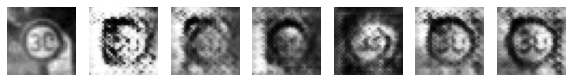

Epoch 5111 g_loss= 0.72749853 d_loss= 1.3309493 real_acc= 0.68 fake_acc= 0.56
Epoch 5112 g_loss= 0.71273786 d_loss= 1.3218149 real_acc= 0.76 fake_acc= 0.48
Epoch 5113 g_loss= 0.7433744 d_loss= 1.2775166 real_acc= 0.78 fake_acc= 0.5
Epoch 5114 g_loss= 0.8464587 d_loss= 1.2518065 real_acc= 0.7 fake_acc= 0.64
Epoch 5115 g_loss= 0.79540634 d_loss= 1.2641978 real_acc= 0.74 fake_acc= 0.7
Epoch 5116 g_loss= 0.80636805 d_loss= 1.2932506 real_acc= 0.72 fake_acc= 0.64
Epoch 5117 g_loss= 0.81576043 d_loss= 1.2252625 real_acc= 0.78 fake_acc= 0.74
Epoch 5118 g_loss= 0.83567 d_loss= 1.2278467 real_acc= 0.74 fake_acc= 0.7
Epoch 5119 g_loss= 0.8416021 d_loss= 1.2707845 real_acc= 0.76 fake_acc= 0.76
Epoch 5120 g_loss= 0.96307 d_loss= 1.1812581 real_acc= 0.6 fake_acc= 0.94


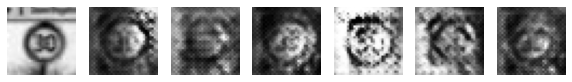

Epoch 5121 g_loss= 0.9540236 d_loss= 1.11218 real_acc= 0.76 fake_acc= 0.82
Epoch 5122 g_loss= 0.8052812 d_loss= 1.2365052 real_acc= 0.76 fake_acc= 0.84
Epoch 5123 g_loss= 0.86861 d_loss= 1.2447817 real_acc= 0.7 fake_acc= 0.8
Epoch 5124 g_loss= 0.8308152 d_loss= 1.2302151 real_acc= 0.7 fake_acc= 0.8
Epoch 5125 g_loss= 0.90436965 d_loss= 1.169985 real_acc= 0.78 fake_acc= 0.96
Epoch 5126 g_loss= 0.84581923 d_loss= 1.1676679 real_acc= 0.82 fake_acc= 0.8
Epoch 5127 g_loss= 0.86967325 d_loss= 1.1296835 real_acc= 0.78 fake_acc= 0.92
Epoch 5128 g_loss= 0.85463655 d_loss= 1.2208428 real_acc= 0.72 fake_acc= 0.8
Epoch 5129 g_loss= 0.8692185 d_loss= 1.1690278 real_acc= 0.82 fake_acc= 0.84
Epoch 5130 g_loss= 0.83821326 d_loss= 1.1748357 real_acc= 0.72 fake_acc= 0.78


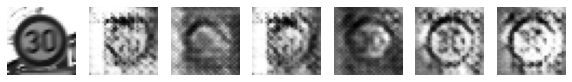

Epoch 5131 g_loss= 0.8376728 d_loss= 1.1545234 real_acc= 0.74 fake_acc= 0.74
Epoch 5132 g_loss= 0.92026055 d_loss= 1.1515608 real_acc= 0.8 fake_acc= 0.88
Epoch 5133 g_loss= 0.84668577 d_loss= 1.1810704 real_acc= 0.82 fake_acc= 0.78
Epoch 5134 g_loss= 0.8686525 d_loss= 1.1512462 real_acc= 0.78 fake_acc= 0.84
Epoch 5135 g_loss= 0.9325651 d_loss= 1.1313093 real_acc= 0.76 fake_acc= 0.9
Epoch 5136 g_loss= 0.9885944 d_loss= 1.1154541 real_acc= 0.7 fake_acc= 0.92
Epoch 5137 g_loss= 0.9089125 d_loss= 1.0818413 real_acc= 0.88 fake_acc= 0.94
Epoch 5138 g_loss= 0.829641 d_loss= 1.2094314 real_acc= 0.72 fake_acc= 0.76
Epoch 5139 g_loss= 0.8573113 d_loss= 1.172724 real_acc= 0.76 fake_acc= 0.94
Epoch 5140 g_loss= 0.946106 d_loss= 1.1753293 real_acc= 0.7 fake_acc= 0.86


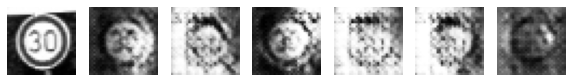

Epoch 5141 g_loss= 0.8722005 d_loss= 1.2567763 real_acc= 0.6 fake_acc= 0.92
Epoch 5142 g_loss= 0.91290885 d_loss= 1.224649 real_acc= 0.64 fake_acc= 0.9
Epoch 5143 g_loss= 0.93617636 d_loss= 1.2051754 real_acc= 0.66 fake_acc= 0.94
Epoch 5144 g_loss= 0.77288294 d_loss= 1.1883802 real_acc= 0.84 fake_acc= 0.74
Epoch 5145 g_loss= 0.87716216 d_loss= 1.1401912 real_acc= 0.84 fake_acc= 0.84
Epoch 5146 g_loss= 0.85828924 d_loss= 1.1855679 real_acc= 0.66 fake_acc= 0.82
Epoch 5147 g_loss= 0.78734964 d_loss= 1.2334118 real_acc= 0.72 fake_acc= 0.72
Epoch 5148 g_loss= 0.73717606 d_loss= 1.2861631 real_acc= 0.8 fake_acc= 0.56
Epoch 5149 g_loss= 0.81990206 d_loss= 1.1217284 real_acc= 0.84 fake_acc= 0.76
Epoch 5150 g_loss= 0.80019516 d_loss= 1.1957676 real_acc= 0.74 fake_acc= 0.58


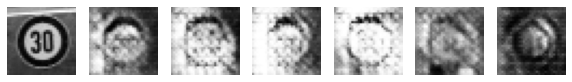

Epoch 5151 g_loss= 0.77108884 d_loss= 1.1907532 real_acc= 0.8 fake_acc= 0.64
Epoch 5152 g_loss= 0.7707294 d_loss= 1.1309986 real_acc= 0.86 fake_acc= 0.68
Epoch 5153 g_loss= 0.8631565 d_loss= 1.1773953 real_acc= 0.72 fake_acc= 0.76
Epoch 5154 g_loss= 0.87266076 d_loss= 1.1298363 real_acc= 0.76 fake_acc= 0.8
Epoch 5155 g_loss= 0.90524656 d_loss= 1.183528 real_acc= 0.68 fake_acc= 0.84
Epoch 5156 g_loss= 0.90256554 d_loss= 1.1825813 real_acc= 0.64 fake_acc= 0.82
Epoch 5157 g_loss= 0.9001464 d_loss= 1.1525371 real_acc= 0.76 fake_acc= 0.8
Epoch 5158 g_loss= 0.90190154 d_loss= 1.1805419 real_acc= 0.7 fake_acc= 0.8
Epoch 5159 g_loss= 0.8820036 d_loss= 1.2655561 real_acc= 0.58 fake_acc= 0.8
Epoch 5160 g_loss= 0.88069224 d_loss= 1.1690842 real_acc= 0.68 fake_acc= 0.78


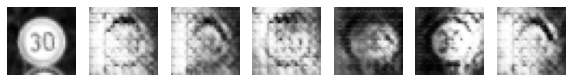

Epoch 5161 g_loss= 0.89299494 d_loss= 1.1997819 real_acc= 0.64 fake_acc= 0.78
Epoch 5162 g_loss= 0.8819081 d_loss= 1.1381509 real_acc= 0.76 fake_acc= 0.76
Epoch 5163 g_loss= 0.89813757 d_loss= 1.1639022 real_acc= 0.74 fake_acc= 0.76
Epoch 5164 g_loss= 0.82891655 d_loss= 1.2218024 real_acc= 0.66 fake_acc= 0.66
Epoch 5165 g_loss= 0.7886312 d_loss= 1.1706405 real_acc= 0.78 fake_acc= 0.6
Epoch 5166 g_loss= 0.8259207 d_loss= 1.1691797 real_acc= 0.76 fake_acc= 0.7
Epoch 5167 g_loss= 0.7999271 d_loss= 1.1290365 real_acc= 0.88 fake_acc= 0.6
Epoch 5168 g_loss= 0.7605947 d_loss= 1.148253 real_acc= 0.88 fake_acc= 0.62
Epoch 5169 g_loss= 0.85815465 d_loss= 1.1803298 real_acc= 0.74 fake_acc= 0.8
Epoch 5170 g_loss= 0.7840879 d_loss= 1.2162058 real_acc= 0.8 fake_acc= 0.58


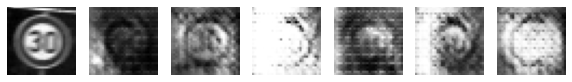

Epoch 5171 g_loss= 0.87664175 d_loss= 1.2178957 real_acc= 0.66 fake_acc= 0.68
Epoch 5172 g_loss= 0.9168014 d_loss= 1.1213741 real_acc= 0.8 fake_acc= 0.78
Epoch 5173 g_loss= 0.88709885 d_loss= 1.237498 real_acc= 0.64 fake_acc= 0.72
Epoch 5174 g_loss= 0.8530044 d_loss= 1.2327728 real_acc= 0.62 fake_acc= 0.72
Epoch 5175 g_loss= 0.81676406 d_loss= 1.2594323 real_acc= 0.6 fake_acc= 0.7
Epoch 5176 g_loss= 0.8429512 d_loss= 1.1828754 real_acc= 0.72 fake_acc= 0.68
Epoch 5177 g_loss= 0.86041266 d_loss= 1.1517836 real_acc= 0.7 fake_acc= 0.76
Epoch 5178 g_loss= 0.82910234 d_loss= 1.2373655 real_acc= 0.72 fake_acc= 0.7
Epoch 5179 g_loss= 0.8292971 d_loss= 1.1326162 real_acc= 0.82 fake_acc= 0.72
Epoch 5180 g_loss= 0.7989995 d_loss= 1.1973696 real_acc= 0.74 fake_acc= 0.74


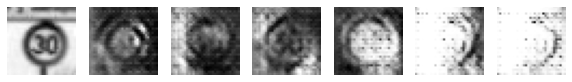

Epoch 5181 g_loss= 0.8515631 d_loss= 1.206146 real_acc= 0.66 fake_acc= 0.7
Epoch 5182 g_loss= 0.8390498 d_loss= 1.2132564 real_acc= 0.66 fake_acc= 0.66
Epoch 5183 g_loss= 0.80942607 d_loss= 1.1737572 real_acc= 0.72 fake_acc= 0.7
Epoch 5184 g_loss= 0.83503944 d_loss= 1.0538467 real_acc= 0.9 fake_acc= 0.68
Epoch 5185 g_loss= 0.8125474 d_loss= 1.100575 real_acc= 0.84 fake_acc= 0.66
Epoch 5186 g_loss= 0.8471002 d_loss= 1.1468298 real_acc= 0.74 fake_acc= 0.8
Epoch 5187 g_loss= 0.9204967 d_loss= 1.038245 real_acc= 0.74 fake_acc= 0.84
Epoch 5188 g_loss= 1.0020945 d_loss= 1.0035583 real_acc= 0.8 fake_acc= 0.84
Epoch 5189 g_loss= 1.0273778 d_loss= 1.1489664 real_acc= 0.6 fake_acc= 0.92
Epoch 5190 g_loss= 0.974466 d_loss= 1.047699 real_acc= 0.78 fake_acc= 0.9


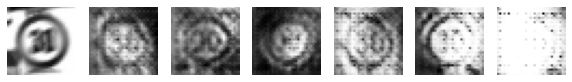

Epoch 5191 g_loss= 1.0396974 d_loss= 1.0068814 real_acc= 0.86 fake_acc= 0.94
Epoch 5192 g_loss= 0.97841626 d_loss= 1.0694699 real_acc= 0.68 fake_acc= 0.94
Epoch 5193 g_loss= 1.0276077 d_loss= 1.054777 real_acc= 0.78 fake_acc= 0.94
Epoch 5194 g_loss= 0.9440634 d_loss= 1.0533142 real_acc= 0.8 fake_acc= 0.86
Epoch 5195 g_loss= 0.97722316 d_loss= 1.0538746 real_acc= 0.74 fake_acc= 0.92
Epoch 5196 g_loss= 0.92862356 d_loss= 1.0107875 real_acc= 0.84 fake_acc= 0.86
Epoch 5197 g_loss= 0.8961079 d_loss= 1.1262197 real_acc= 0.74 fake_acc= 0.84
Epoch 5198 g_loss= 0.9375761 d_loss= 1.0383123 real_acc= 0.86 fake_acc= 0.8
Epoch 5199 g_loss= 0.90209955 d_loss= 1.0359539 real_acc= 0.84 fake_acc= 0.78
Epoch 5200 g_loss= 0.8802469 d_loss= 1.0104549 real_acc= 0.9 fake_acc= 0.82


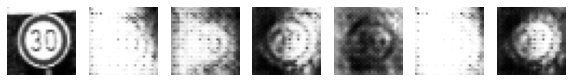

Epoch 5201 g_loss= 0.962475 d_loss= 1.0332844 real_acc= 0.8 fake_acc= 0.88
Epoch 5202 g_loss= 1.0053389 d_loss= 1.0444508 real_acc= 0.72 fake_acc= 0.94
Epoch 5203 g_loss= 0.94959396 d_loss= 1.0696986 real_acc= 0.76 fake_acc= 0.74
Epoch 5204 g_loss= 0.9024611 d_loss= 1.0543548 real_acc= 0.78 fake_acc= 0.88
Epoch 5205 g_loss= 0.9099086 d_loss= 1.069624 real_acc= 0.78 fake_acc= 0.86
Epoch 5206 g_loss= 1.024564 d_loss= 0.94304454 real_acc= 0.88 fake_acc= 0.82
Epoch 5207 g_loss= 0.9920301 d_loss= 1.0946738 real_acc= 0.74 fake_acc= 0.82
Epoch 5208 g_loss= 0.96344286 d_loss= 1.1124961 real_acc= 0.72 fake_acc= 0.76
Epoch 5209 g_loss= 0.9176818 d_loss= 1.1013196 real_acc= 0.8 fake_acc= 0.82
Epoch 5210 g_loss= 0.9585432 d_loss= 1.0086895 real_acc= 0.86 fake_acc= 0.82


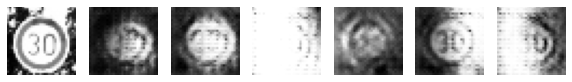

Epoch 5211 g_loss= 0.94924575 d_loss= 1.0306882 real_acc= 0.86 fake_acc= 0.8
Epoch 5212 g_loss= 0.89850324 d_loss= 1.0454464 real_acc= 0.88 fake_acc= 0.76
Epoch 5213 g_loss= 0.87925667 d_loss= 1.1097337 real_acc= 0.78 fake_acc= 0.8
Epoch 5214 g_loss= 0.89619136 d_loss= 1.0088276 real_acc= 0.86 fake_acc= 0.68
Epoch 5215 g_loss= 0.9311525 d_loss= 1.1776016 real_acc= 0.72 fake_acc= 0.74
Epoch 5216 g_loss= 0.9396872 d_loss= 1.0926144 real_acc= 0.7 fake_acc= 0.8
Epoch 5217 g_loss= 0.962065 d_loss= 1.1342571 real_acc= 0.72 fake_acc= 0.74
Epoch 5218 g_loss= 0.9166861 d_loss= 1.0767729 real_acc= 0.84 fake_acc= 0.78
Epoch 5219 g_loss= 0.97845644 d_loss= 1.1777198 real_acc= 0.6 fake_acc= 0.74
Epoch 5220 g_loss= 1.0008664 d_loss= 1.1637523 real_acc= 0.7 fake_acc= 0.84


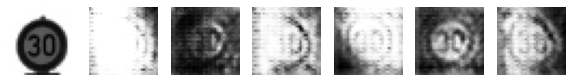

Epoch 5221 g_loss= 0.9616983 d_loss= 1.2378132 real_acc= 0.56 fake_acc= 0.78
Epoch 5222 g_loss= 0.9415773 d_loss= 1.1769288 real_acc= 0.66 fake_acc= 0.66
Epoch 5223 g_loss= 0.91823006 d_loss= 1.2008564 real_acc= 0.8 fake_acc= 0.62
Epoch 5224 g_loss= 0.82925 d_loss= 1.2178948 real_acc= 0.68 fake_acc= 0.56
Epoch 5225 g_loss= 0.8530147 d_loss= 1.2124001 real_acc= 0.72 fake_acc= 0.54
Epoch 5226 g_loss= 0.78438926 d_loss= 1.2179663 real_acc= 0.86 fake_acc= 0.48
Epoch 5227 g_loss= 0.740975 d_loss= 1.2108781 real_acc= 0.72 fake_acc= 0.48
Epoch 5228 g_loss= 0.7537513 d_loss= 1.2677171 real_acc= 0.74 fake_acc= 0.4
Epoch 5229 g_loss= 0.71376497 d_loss= 1.4100147 real_acc= 0.62 fake_acc= 0.36
Epoch 5230 g_loss= 0.7563183 d_loss= 1.1756294 real_acc= 0.76 fake_acc= 0.5


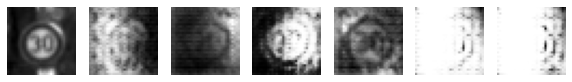

Epoch 5231 g_loss= 0.83143914 d_loss= 1.201275 real_acc= 0.78 fake_acc= 0.62
Epoch 5232 g_loss= 0.84923464 d_loss= 1.2880368 real_acc= 0.52 fake_acc= 0.62
Epoch 5233 g_loss= 0.87906593 d_loss= 1.3075407 real_acc= 0.6 fake_acc= 0.6
Epoch 5234 g_loss= 0.82936454 d_loss= 1.3767166 real_acc= 0.48 fake_acc= 0.58
Epoch 5235 g_loss= 0.8531754 d_loss= 1.2804325 real_acc= 0.68 fake_acc= 0.58
Epoch 5236 g_loss= 0.9080345 d_loss= 1.363162 real_acc= 0.48 fake_acc= 0.8
Epoch 5237 g_loss= 0.90968245 d_loss= 1.3309319 real_acc= 0.56 fake_acc= 0.66
Epoch 5238 g_loss= 0.8545827 d_loss= 1.2783494 real_acc= 0.56 fake_acc= 0.6
Epoch 5239 g_loss= 0.7985759 d_loss= 1.2882959 real_acc= 0.64 fake_acc= 0.6
Epoch 5240 g_loss= 0.7749573 d_loss= 1.3820726 real_acc= 0.56 fake_acc= 0.48


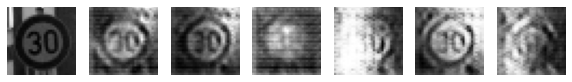

Epoch 5241 g_loss= 0.690616 d_loss= 1.4379238 real_acc= 0.6 fake_acc= 0.28
Epoch 5242 g_loss= 0.67155397 d_loss= 1.3698277 real_acc= 0.74 fake_acc= 0.3
Epoch 5243 g_loss= 0.7500953 d_loss= 1.3299611 real_acc= 0.64 fake_acc= 0.32
Epoch 5244 g_loss= 0.66116464 d_loss= 1.428242 real_acc= 0.66 fake_acc= 0.26
Epoch 5245 g_loss= 0.68476677 d_loss= 1.3609004 real_acc= 0.62 fake_acc= 0.38
Epoch 5246 g_loss= 0.6638887 d_loss= 1.5301163 real_acc= 0.5 fake_acc= 0.34
Epoch 5247 g_loss= 0.76667374 d_loss= 1.3651421 real_acc= 0.6 fake_acc= 0.42
Epoch 5248 g_loss= 0.8207588 d_loss= 1.443307 real_acc= 0.5 fake_acc= 0.58
Epoch 5249 g_loss= 0.7699383 d_loss= 1.3463359 real_acc= 0.6 fake_acc= 0.5
Epoch 5250 g_loss= 0.7402008 d_loss= 1.4174712 real_acc= 0.56 fake_acc= 0.5


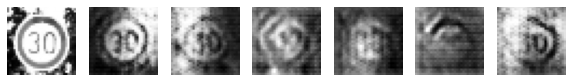

Epoch 5251 g_loss= 0.7928036 d_loss= 1.3236694 real_acc= 0.78 fake_acc= 0.5
Epoch 5252 g_loss= 0.7515502 d_loss= 1.4932866 real_acc= 0.52 fake_acc= 0.54
Epoch 5253 g_loss= 0.8385048 d_loss= 1.3624862 real_acc= 0.48 fake_acc= 0.64
Epoch 5254 g_loss= 0.7600204 d_loss= 1.4395207 real_acc= 0.6 fake_acc= 0.46
Epoch 5255 g_loss= 0.775409 d_loss= 1.3916204 real_acc= 0.6 fake_acc= 0.58
Epoch 5256 g_loss= 0.80864197 d_loss= 1.2911718 real_acc= 0.64 fake_acc= 0.56
Epoch 5257 g_loss= 0.72833353 d_loss= 1.4252738 real_acc= 0.6 fake_acc= 0.36
Epoch 5258 g_loss= 0.75405645 d_loss= 1.4942752 real_acc= 0.5 fake_acc= 0.58
Epoch 5259 g_loss= 0.7751266 d_loss= 1.4181917 real_acc= 0.56 fake_acc= 0.56
Epoch 5260 g_loss= 0.7233364 d_loss= 1.3950874 real_acc= 0.58 fake_acc= 0.5


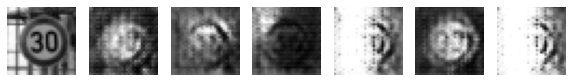

Epoch 5261 g_loss= 0.71503806 d_loss= 1.5533407 real_acc= 0.46 fake_acc= 0.42
Epoch 5262 g_loss= 0.6842411 d_loss= 1.4938037 real_acc= 0.64 fake_acc= 0.46
Epoch 5263 g_loss= 0.6737741 d_loss= 1.4653764 real_acc= 0.48 fake_acc= 0.42
Epoch 5264 g_loss= 0.63376975 d_loss= 1.5989091 real_acc= 0.36 fake_acc= 0.32
Epoch 5265 g_loss= 0.75234485 d_loss= 1.5107241 real_acc= 0.42 fake_acc= 0.52
Epoch 5266 g_loss= 0.7569667 d_loss= 1.4698392 real_acc= 0.38 fake_acc= 0.54
Epoch 5267 g_loss= 0.80506194 d_loss= 1.4446197 real_acc= 0.44 fake_acc= 0.64
Epoch 5268 g_loss= 0.79407156 d_loss= 1.3874286 real_acc= 0.5 fake_acc= 0.58
Epoch 5269 g_loss= 0.8002174 d_loss= 1.5013425 real_acc= 0.34 fake_acc= 0.68
Epoch 5270 g_loss= 0.77319026 d_loss= 1.4307226 real_acc= 0.48 fake_acc= 0.52


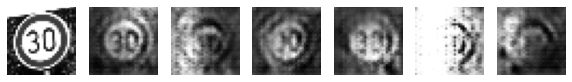

Epoch 5271 g_loss= 0.8068659 d_loss= 1.3580098 real_acc= 0.5 fake_acc= 0.62
Epoch 5272 g_loss= 0.71845156 d_loss= 1.4913294 real_acc= 0.54 fake_acc= 0.48
Epoch 5273 g_loss= 0.7621992 d_loss= 1.436413 real_acc= 0.52 fake_acc= 0.52
Epoch 5274 g_loss= 0.77016264 d_loss= 1.4849771 real_acc= 0.48 fake_acc= 0.54
Epoch 5275 g_loss= 0.6790645 d_loss= 1.4667113 real_acc= 0.52 fake_acc= 0.4
Epoch 5276 g_loss= 0.7442158 d_loss= 1.2870594 real_acc= 0.74 fake_acc= 0.54
Epoch 5277 g_loss= 0.7791742 d_loss= 1.4465461 real_acc= 0.52 fake_acc= 0.54
Epoch 5278 g_loss= 0.72921205 d_loss= 1.4485407 real_acc= 0.56 fake_acc= 0.52
Epoch 5279 g_loss= 0.7409894 d_loss= 1.3985832 real_acc= 0.56 fake_acc= 0.52
Epoch 5280 g_loss= 0.76593447 d_loss= 1.3412039 real_acc= 0.56 fake_acc= 0.6


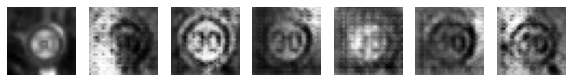

Epoch 5281 g_loss= 0.7508463 d_loss= 1.3651135 real_acc= 0.56 fake_acc= 0.54
Epoch 5282 g_loss= 0.7810435 d_loss= 1.3282439 real_acc= 0.64 fake_acc= 0.56
Epoch 5283 g_loss= 0.75442904 d_loss= 1.3299112 real_acc= 0.62 fake_acc= 0.52
Epoch 5284 g_loss= 0.76317185 d_loss= 1.3503656 real_acc= 0.62 fake_acc= 0.54
Epoch 5285 g_loss= 0.8153746 d_loss= 1.2867821 real_acc= 0.7 fake_acc= 0.66
Epoch 5286 g_loss= 0.79503965 d_loss= 1.2822468 real_acc= 0.62 fake_acc= 0.66
Epoch 5287 g_loss= 0.7402393 d_loss= 1.2847877 real_acc= 0.76 fake_acc= 0.54
Epoch 5288 g_loss= 0.7378826 d_loss= 1.35249 real_acc= 0.66 fake_acc= 0.52
Epoch 5289 g_loss= 0.7648457 d_loss= 1.3278728 real_acc= 0.54 fake_acc= 0.62
Epoch 5290 g_loss= 0.8711023 d_loss= 1.2228591 real_acc= 0.68 fake_acc= 0.72


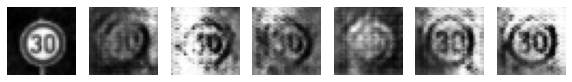

Epoch 5291 g_loss= 0.7514305 d_loss= 1.3154483 real_acc= 0.64 fake_acc= 0.54
Epoch 5292 g_loss= 0.8240013 d_loss= 1.2987297 real_acc= 0.52 fake_acc= 0.68
Epoch 5293 g_loss= 0.8213074 d_loss= 1.2732606 real_acc= 0.56 fake_acc= 0.72
Epoch 5294 g_loss= 0.80390394 d_loss= 1.2744416 real_acc= 0.6 fake_acc= 0.74
Epoch 5295 g_loss= 0.8525883 d_loss= 1.2901499 real_acc= 0.54 fake_acc= 0.8
Epoch 5296 g_loss= 0.8874777 d_loss= 1.279529 real_acc= 0.54 fake_acc= 0.84
Epoch 5297 g_loss= 0.8455188 d_loss= 1.3045877 real_acc= 0.58 fake_acc= 0.7
Epoch 5298 g_loss= 0.83024466 d_loss= 1.2566392 real_acc= 0.7 fake_acc= 0.74
Epoch 5299 g_loss= 0.7959267 d_loss= 1.331423 real_acc= 0.48 fake_acc= 0.66
Epoch 5300 g_loss= 0.80659395 d_loss= 1.3102996 real_acc= 0.62 fake_acc= 0.56


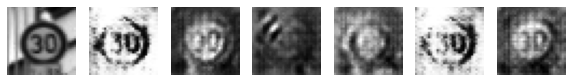

Epoch 5301 g_loss= 0.81026566 d_loss= 1.2289376 real_acc= 0.68 fake_acc= 0.64
Epoch 5302 g_loss= 0.80101275 d_loss= 1.3295735 real_acc= 0.54 fake_acc= 0.74
Epoch 5303 g_loss= 0.8487282 d_loss= 1.2477422 real_acc= 0.58 fake_acc= 0.82
Epoch 5304 g_loss= 0.8008945 d_loss= 1.2739849 real_acc= 0.58 fake_acc= 0.64
Epoch 5305 g_loss= 0.7716163 d_loss= 1.3313305 real_acc= 0.64 fake_acc= 0.58
Epoch 5306 g_loss= 0.7186798 d_loss= 1.2692089 real_acc= 0.76 fake_acc= 0.56
Epoch 5307 g_loss= 0.67586297 d_loss= 1.318604 real_acc= 0.78 fake_acc= 0.46
Epoch 5308 g_loss= 0.74849707 d_loss= 1.3159108 real_acc= 0.48 fake_acc= 0.6
Epoch 5309 g_loss= 0.7227032 d_loss= 1.3785574 real_acc= 0.58 fake_acc= 0.52
Epoch 5310 g_loss= 0.7210714 d_loss= 1.4231408 real_acc= 0.48 fake_acc= 0.44


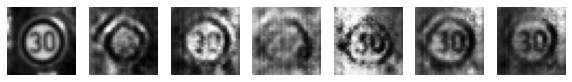

Epoch 5311 g_loss= 0.7890041 d_loss= 1.3507434 real_acc= 0.54 fake_acc= 0.64
Epoch 5312 g_loss= 0.83803475 d_loss= 1.339157 real_acc= 0.5 fake_acc= 0.72
Epoch 5313 g_loss= 0.8989328 d_loss= 1.2286633 real_acc= 0.68 fake_acc= 0.78
Epoch 5314 g_loss= 0.8090755 d_loss= 1.3583318 real_acc= 0.5 fake_acc= 0.72
Epoch 5315 g_loss= 0.80555534 d_loss= 1.3467613 real_acc= 0.52 fake_acc= 0.72
Epoch 5316 g_loss= 0.78613424 d_loss= 1.3874075 real_acc= 0.52 fake_acc= 0.66
Epoch 5317 g_loss= 0.78509545 d_loss= 1.4250448 real_acc= 0.44 fake_acc= 0.6
Epoch 5318 g_loss= 0.74973416 d_loss= 1.3272302 real_acc= 0.6 fake_acc= 0.54
Epoch 5319 g_loss= 0.7443975 d_loss= 1.3291147 real_acc= 0.7 fake_acc= 0.52
Epoch 5320 g_loss= 0.7187628 d_loss= 1.358007 real_acc= 0.66 fake_acc= 0.5


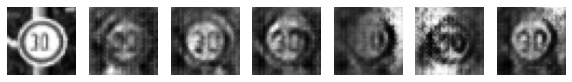

Epoch 5321 g_loss= 0.7105095 d_loss= 1.3769307 real_acc= 0.5 fake_acc= 0.52
Epoch 5322 g_loss= 0.7326207 d_loss= 1.3759251 real_acc= 0.58 fake_acc= 0.5
Epoch 5323 g_loss= 0.73659784 d_loss= 1.3304383 real_acc= 0.66 fake_acc= 0.5
Epoch 5324 g_loss= 0.75104 d_loss= 1.3298397 real_acc= 0.64 fake_acc= 0.48
Epoch 5325 g_loss= 0.7570164 d_loss= 1.3675709 real_acc= 0.58 fake_acc= 0.56
Epoch 5326 g_loss= 0.8456877 d_loss= 1.3214844 real_acc= 0.48 fake_acc= 0.66
Epoch 5327 g_loss= 0.8927456 d_loss= 1.2001579 real_acc= 0.6 fake_acc= 0.64
Epoch 5328 g_loss= 0.922158 d_loss= 1.3539444 real_acc= 0.42 fake_acc= 0.82
Epoch 5329 g_loss= 0.9381506 d_loss= 1.3256172 real_acc= 0.42 fake_acc= 0.86
Epoch 5330 g_loss= 0.8983285 d_loss= 1.4453453 real_acc= 0.46 fake_acc= 0.7


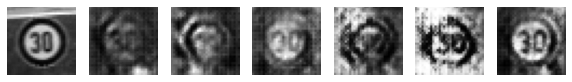

Epoch 5331 g_loss= 0.88252395 d_loss= 1.3460629 real_acc= 0.4 fake_acc= 0.74
Epoch 5332 g_loss= 0.8154142 d_loss= 1.3951654 real_acc= 0.5 fake_acc= 0.5
Epoch 5333 g_loss= 0.818337 d_loss= 1.4184684 real_acc= 0.42 fake_acc= 0.66
Epoch 5334 g_loss= 0.7594781 d_loss= 1.3278146 real_acc= 0.6 fake_acc= 0.54
Epoch 5335 g_loss= 0.70369524 d_loss= 1.291941 real_acc= 0.74 fake_acc= 0.44
Epoch 5336 g_loss= 0.7192073 d_loss= 1.3044864 real_acc= 0.74 fake_acc= 0.34
Epoch 5337 g_loss= 0.74645156 d_loss= 1.3090749 real_acc= 0.68 fake_acc= 0.46
Epoch 5338 g_loss= 0.72887117 d_loss= 1.4554629 real_acc= 0.52 fake_acc= 0.48
Epoch 5339 g_loss= 0.7488998 d_loss= 1.253804 real_acc= 0.84 fake_acc= 0.52
Epoch 5340 g_loss= 0.8076107 d_loss= 1.2926128 real_acc= 0.68 fake_acc= 0.56


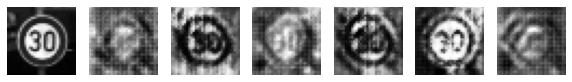

Epoch 5341 g_loss= 0.83480287 d_loss= 1.3360915 real_acc= 0.56 fake_acc= 0.58
Epoch 5342 g_loss= 0.86419904 d_loss= 1.2866813 real_acc= 0.44 fake_acc= 0.7
Epoch 5343 g_loss= 0.82327956 d_loss= 1.413394 real_acc= 0.56 fake_acc= 0.6
Epoch 5344 g_loss= 0.90525573 d_loss= 1.2704091 real_acc= 0.58 fake_acc= 0.74
Epoch 5345 g_loss= 0.9141031 d_loss= 1.295147 real_acc= 0.64 fake_acc= 0.7
Epoch 5346 g_loss= 0.86891615 d_loss= 1.2977962 real_acc= 0.54 fake_acc= 0.66
Epoch 5347 g_loss= 0.89692163 d_loss= 1.3878598 real_acc= 0.44 fake_acc= 0.72
Epoch 5348 g_loss= 0.8728523 d_loss= 1.2704096 real_acc= 0.62 fake_acc= 0.66
Epoch 5349 g_loss= 0.77245384 d_loss= 1.3372599 real_acc= 0.7 fake_acc= 0.46
Epoch 5350 g_loss= 0.8194007 d_loss= 1.2968422 real_acc= 0.68 fake_acc= 0.58


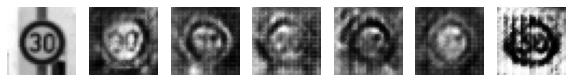

Epoch 5351 g_loss= 0.87892866 d_loss= 1.2725877 real_acc= 0.52 fake_acc= 0.72
Epoch 5352 g_loss= 0.8520889 d_loss= 1.3132452 real_acc= 0.58 fake_acc= 0.62
Epoch 5353 g_loss= 0.8864928 d_loss= 1.2893584 real_acc= 0.58 fake_acc= 0.72
Epoch 5354 g_loss= 0.85998094 d_loss= 1.2980707 real_acc= 0.62 fake_acc= 0.58
Epoch 5355 g_loss= 0.864311 d_loss= 1.2890866 real_acc= 0.58 fake_acc= 0.66
Epoch 5356 g_loss= 0.8941206 d_loss= 1.3034694 real_acc= 0.58 fake_acc= 0.66
Epoch 5357 g_loss= 0.9004335 d_loss= 1.175539 real_acc= 0.76 fake_acc= 0.8
Epoch 5358 g_loss= 0.86535996 d_loss= 1.2185585 real_acc= 0.66 fake_acc= 0.68
Epoch 5359 g_loss= 0.82069916 d_loss= 1.3461838 real_acc= 0.58 fake_acc= 0.62
Epoch 5360 g_loss= 0.8379099 d_loss= 1.2302891 real_acc= 0.76 fake_acc= 0.66


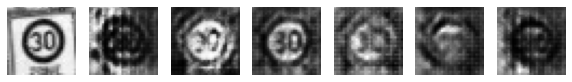

Epoch 5361 g_loss= 0.7960407 d_loss= 1.2753847 real_acc= 0.72 fake_acc= 0.54
Epoch 5362 g_loss= 0.8016977 d_loss= 1.3024023 real_acc= 0.64 fake_acc= 0.56
Epoch 5363 g_loss= 0.8355533 d_loss= 1.2687451 real_acc= 0.66 fake_acc= 0.58
Epoch 5364 g_loss= 0.78925467 d_loss= 1.2982881 real_acc= 0.66 fake_acc= 0.64
Epoch 5365 g_loss= 0.8009069 d_loss= 1.3451928 real_acc= 0.62 fake_acc= 0.68
Epoch 5366 g_loss= 0.81917816 d_loss= 1.3967255 real_acc= 0.44 fake_acc= 0.68
Epoch 5367 g_loss= 0.8884456 d_loss= 1.3039947 real_acc= 0.52 fake_acc= 0.68
Epoch 5368 g_loss= 0.85147554 d_loss= 1.4051137 real_acc= 0.46 fake_acc= 0.68
Epoch 5369 g_loss= 0.7359749 d_loss= 1.3278389 real_acc= 0.62 fake_acc= 0.5
Epoch 5370 g_loss= 0.79239446 d_loss= 1.381546 real_acc= 0.52 fake_acc= 0.58


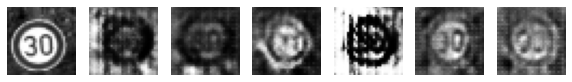

Epoch 5371 g_loss= 0.8341562 d_loss= 1.3749366 real_acc= 0.54 fake_acc= 0.56
Epoch 5372 g_loss= 0.8092565 d_loss= 1.4283805 real_acc= 0.38 fake_acc= 0.58
Epoch 5373 g_loss= 0.8235071 d_loss= 1.3136146 real_acc= 0.62 fake_acc= 0.58
Epoch 5374 g_loss= 0.790477 d_loss= 1.4781342 real_acc= 0.46 fake_acc= 0.44
Epoch 5375 g_loss= 0.8288302 d_loss= 1.4021997 real_acc= 0.46 fake_acc= 0.62
Epoch 5376 g_loss= 0.79544824 d_loss= 1.3806648 real_acc= 0.58 fake_acc= 0.68
Epoch 5377 g_loss= 0.73161393 d_loss= 1.4199116 real_acc= 0.52 fake_acc= 0.48
Epoch 5378 g_loss= 0.7289764 d_loss= 1.4163276 real_acc= 0.58 fake_acc= 0.44
Epoch 5379 g_loss= 0.75658303 d_loss= 1.4330199 real_acc= 0.6 fake_acc= 0.54
Epoch 5380 g_loss= 0.7232834 d_loss= 1.4458196 real_acc= 0.54 fake_acc= 0.5


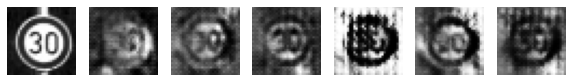

Epoch 5381 g_loss= 0.75778735 d_loss= 1.4195638 real_acc= 0.56 fake_acc= 0.54
Epoch 5382 g_loss= 0.7883813 d_loss= 1.3953453 real_acc= 0.6 fake_acc= 0.4
Epoch 5383 g_loss= 0.7593368 d_loss= 1.3952324 real_acc= 0.58 fake_acc= 0.5
Epoch 5384 g_loss= 0.8039655 d_loss= 1.431788 real_acc= 0.48 fake_acc= 0.48
Epoch 5385 g_loss= 0.74019647 d_loss= 1.4369354 real_acc= 0.5 fake_acc= 0.42
Epoch 5386 g_loss= 0.77271414 d_loss= 1.3924383 real_acc= 0.46 fake_acc= 0.44
Epoch 5387 g_loss= 0.72614884 d_loss= 1.4194754 real_acc= 0.68 fake_acc= 0.3
Epoch 5388 g_loss= 0.7493875 d_loss= 1.4222312 real_acc= 0.58 fake_acc= 0.38
Epoch 5389 g_loss= 0.73688555 d_loss= 1.386389 real_acc= 0.66 fake_acc= 0.42
Epoch 5390 g_loss= 0.7841796 d_loss= 1.4253409 real_acc= 0.52 fake_acc= 0.46


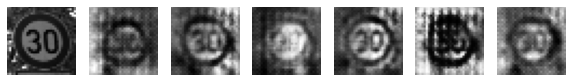

Epoch 5391 g_loss= 0.72283465 d_loss= 1.3456163 real_acc= 0.7 fake_acc= 0.46
Epoch 5392 g_loss= 0.79896426 d_loss= 1.3639687 real_acc= 0.62 fake_acc= 0.54
Epoch 5393 g_loss= 0.79971665 d_loss= 1.3935627 real_acc= 0.6 fake_acc= 0.54
Epoch 5394 g_loss= 0.8539684 d_loss= 1.3898561 real_acc= 0.56 fake_acc= 0.52
Epoch 5395 g_loss= 0.8297534 d_loss= 1.2872391 real_acc= 0.64 fake_acc= 0.6
Epoch 5396 g_loss= 0.80832505 d_loss= 1.294699 real_acc= 0.7 fake_acc= 0.6
Epoch 5397 g_loss= 0.8560455 d_loss= 1.2534705 real_acc= 0.66 fake_acc= 0.56
Epoch 5398 g_loss= 0.8451561 d_loss= 1.2237176 real_acc= 0.7 fake_acc= 0.54
Epoch 5399 g_loss= 0.8568042 d_loss= 1.2763002 real_acc= 0.58 fake_acc= 0.72
Epoch 5400 g_loss= 0.8960861 d_loss= 1.2302172 real_acc= 0.66 fake_acc= 0.74


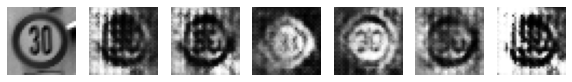

Epoch 5401 g_loss= 0.89736974 d_loss= 1.2680755 real_acc= 0.6 fake_acc= 0.66
Epoch 5402 g_loss= 0.79364985 d_loss= 1.2612925 real_acc= 0.72 fake_acc= 0.42
Epoch 5403 g_loss= 0.8249255 d_loss= 1.2733421 real_acc= 0.74 fake_acc= 0.68
Epoch 5404 g_loss= 0.8358942 d_loss= 1.2123761 real_acc= 0.66 fake_acc= 0.64
Epoch 5405 g_loss= 0.8259414 d_loss= 1.2642944 real_acc= 0.74 fake_acc= 0.6
Epoch 5406 g_loss= 0.8157961 d_loss= 1.1783111 real_acc= 0.8 fake_acc= 0.62
Epoch 5407 g_loss= 0.80774915 d_loss= 1.2833248 real_acc= 0.72 fake_acc= 0.52
Epoch 5408 g_loss= 0.80868375 d_loss= 1.2120225 real_acc= 0.82 fake_acc= 0.56
Epoch 5409 g_loss= 0.8829449 d_loss= 1.1748719 real_acc= 0.7 fake_acc= 0.8
Epoch 5410 g_loss= 0.8557702 d_loss= 1.2394106 real_acc= 0.7 fake_acc= 0.74


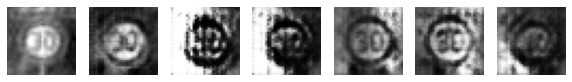

Epoch 5411 g_loss= 0.9193812 d_loss= 1.2129569 real_acc= 0.62 fake_acc= 0.78
Epoch 5412 g_loss= 0.8723271 d_loss= 1.2167294 real_acc= 0.74 fake_acc= 0.8
Epoch 5413 g_loss= 0.88401735 d_loss= 1.2722857 real_acc= 0.68 fake_acc= 0.82
Epoch 5414 g_loss= 0.8414588 d_loss= 1.1576433 real_acc= 0.78 fake_acc= 0.72
Epoch 5415 g_loss= 0.8411514 d_loss= 1.2694552 real_acc= 0.64 fake_acc= 0.72
Epoch 5416 g_loss= 0.80444276 d_loss= 1.2915647 real_acc= 0.66 fake_acc= 0.7
Epoch 5417 g_loss= 0.7974216 d_loss= 1.3473837 real_acc= 0.56 fake_acc= 0.68
Epoch 5418 g_loss= 0.792999 d_loss= 1.2606778 real_acc= 0.68 fake_acc= 0.72
Epoch 5419 g_loss= 0.7628081 d_loss= 1.2573495 real_acc= 0.72 fake_acc= 0.64
Epoch 5420 g_loss= 0.72070336 d_loss= 1.3138311 real_acc= 0.74 fake_acc= 0.56


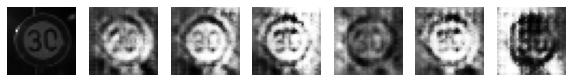

Epoch 5421 g_loss= 0.7312483 d_loss= 1.2651474 real_acc= 0.78 fake_acc= 0.5
Epoch 5422 g_loss= 0.70066714 d_loss= 1.4007072 real_acc= 0.56 fake_acc= 0.5
Epoch 5423 g_loss= 0.7454788 d_loss= 1.3313483 real_acc= 0.6 fake_acc= 0.56
Epoch 5424 g_loss= 0.72967744 d_loss= 1.3341992 real_acc= 0.66 fake_acc= 0.54
Epoch 5425 g_loss= 0.74103814 d_loss= 1.478116 real_acc= 0.5 fake_acc= 0.58
Epoch 5426 g_loss= 0.6946654 d_loss= 1.3661957 real_acc= 0.74 fake_acc= 0.48
Epoch 5427 g_loss= 0.7034868 d_loss= 1.3791318 real_acc= 0.62 fake_acc= 0.54
Epoch 5428 g_loss= 0.7365717 d_loss= 1.3833169 real_acc= 0.62 fake_acc= 0.64
Epoch 5429 g_loss= 0.6972116 d_loss= 1.3655632 real_acc= 0.72 fake_acc= 0.5
Epoch 5430 g_loss= 0.7106885 d_loss= 1.3684053 real_acc= 0.56 fake_acc= 0.56


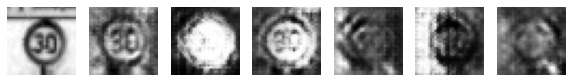

Epoch 5431 g_loss= 0.704582 d_loss= 1.3503456 real_acc= 0.64 fake_acc= 0.4
Epoch 5432 g_loss= 0.7463644 d_loss= 1.3617346 real_acc= 0.62 fake_acc= 0.6
Epoch 5433 g_loss= 0.7315816 d_loss= 1.4193578 real_acc= 0.6 fake_acc= 0.68
Epoch 5434 g_loss= 0.73605365 d_loss= 1.4415797 real_acc= 0.46 fake_acc= 0.58
Epoch 5435 g_loss= 0.7220905 d_loss= 1.4505475 real_acc= 0.5 fake_acc= 0.56
Epoch 5436 g_loss= 0.7185325 d_loss= 1.4108574 real_acc= 0.5 fake_acc= 0.54
Epoch 5437 g_loss= 0.6906702 d_loss= 1.4796689 real_acc= 0.46 fake_acc= 0.46
Epoch 5438 g_loss= 0.6874305 d_loss= 1.4559937 real_acc= 0.58 fake_acc= 0.5
Epoch 5439 g_loss= 0.6926773 d_loss= 1.4140781 real_acc= 0.62 fake_acc= 0.44
Epoch 5440 g_loss= 0.65635306 d_loss= 1.514082 real_acc= 0.44 fake_acc= 0.32


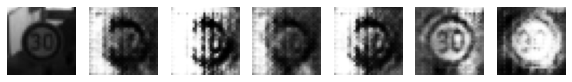

Epoch 5441 g_loss= 0.6818402 d_loss= 1.4438555 real_acc= 0.54 fake_acc= 0.38
Epoch 5442 g_loss= 0.6722174 d_loss= 1.474472 real_acc= 0.48 fake_acc= 0.44
Epoch 5443 g_loss= 0.68430346 d_loss= 1.3961649 real_acc= 0.66 fake_acc= 0.46
Epoch 5444 g_loss= 0.6758612 d_loss= 1.4825877 real_acc= 0.52 fake_acc= 0.4
Epoch 5445 g_loss= 0.6692399 d_loss= 1.4969431 real_acc= 0.48 fake_acc= 0.34
Epoch 5446 g_loss= 0.668933 d_loss= 1.4969637 real_acc= 0.44 fake_acc= 0.44
Epoch 5447 g_loss= 0.7051101 d_loss= 1.4467831 real_acc= 0.5 fake_acc= 0.52
Epoch 5448 g_loss= 0.6976095 d_loss= 1.4722309 real_acc= 0.54 fake_acc= 0.5
Epoch 5449 g_loss= 0.67199975 d_loss= 1.4085354 real_acc= 0.68 fake_acc= 0.4
Epoch 5450 g_loss= 0.688611 d_loss= 1.4703505 real_acc= 0.5 fake_acc= 0.4


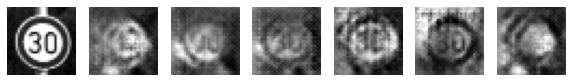

Epoch 5451 g_loss= 0.7153244 d_loss= 1.371645 real_acc= 0.68 fake_acc= 0.46
Epoch 5452 g_loss= 0.7370816 d_loss= 1.4401276 real_acc= 0.56 fake_acc= 0.52
Epoch 5453 g_loss= 0.67131096 d_loss= 1.3595598 real_acc= 0.66 fake_acc= 0.34
Epoch 5454 g_loss= 0.650771 d_loss= 1.3420072 real_acc= 0.7 fake_acc= 0.42
Epoch 5455 g_loss= 0.7011609 d_loss= 1.4055696 real_acc= 0.54 fake_acc= 0.46
Epoch 5456 g_loss= 0.7283118 d_loss= 1.4009182 real_acc= 0.58 fake_acc= 0.48
Epoch 5457 g_loss= 0.7110531 d_loss= 1.3702061 real_acc= 0.6 fake_acc= 0.44
Epoch 5458 g_loss= 0.7681131 d_loss= 1.3567603 real_acc= 0.6 fake_acc= 0.56
Epoch 5459 g_loss= 0.73844194 d_loss= 1.3217251 real_acc= 0.68 fake_acc= 0.52
Epoch 5460 g_loss= 0.74795234 d_loss= 1.3596654 real_acc= 0.6 fake_acc= 0.52


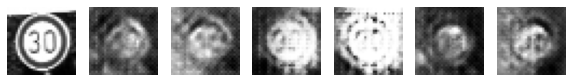

Epoch 5461 g_loss= 0.71383023 d_loss= 1.3336532 real_acc= 0.66 fake_acc= 0.42
Epoch 5462 g_loss= 0.80289704 d_loss= 1.2668188 real_acc= 0.76 fake_acc= 0.58
Epoch 5463 g_loss= 0.7646952 d_loss= 1.2881527 real_acc= 0.72 fake_acc= 0.6
Epoch 5464 g_loss= 0.7465381 d_loss= 1.3181094 real_acc= 0.62 fake_acc= 0.56
Epoch 5465 g_loss= 0.77706355 d_loss= 1.2679604 real_acc= 0.76 fake_acc= 0.62
Epoch 5466 g_loss= 0.78151625 d_loss= 1.28743 real_acc= 0.64 fake_acc= 0.62
Epoch 5467 g_loss= 0.8491686 d_loss= 1.2665898 real_acc= 0.68 fake_acc= 0.68
Epoch 5468 g_loss= 0.79086304 d_loss= 1.298387 real_acc= 0.64 fake_acc= 0.64
Epoch 5469 g_loss= 0.8117357 d_loss= 1.2605271 real_acc= 0.68 fake_acc= 0.66
Epoch 5470 g_loss= 0.8432971 d_loss= 1.20984 real_acc= 0.76 fake_acc= 0.78


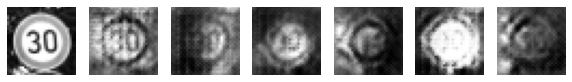

Epoch 5471 g_loss= 0.83879834 d_loss= 1.2888405 real_acc= 0.52 fake_acc= 0.7
Epoch 5472 g_loss= 0.87448233 d_loss= 1.2049353 real_acc= 0.72 fake_acc= 0.76
Epoch 5473 g_loss= 0.89192206 d_loss= 1.191553 real_acc= 0.68 fake_acc= 0.78
Epoch 5474 g_loss= 0.8978053 d_loss= 1.2013757 real_acc= 0.72 fake_acc= 0.78
Epoch 5475 g_loss= 0.8430173 d_loss= 1.231786 real_acc= 0.66 fake_acc= 0.72
Epoch 5476 g_loss= 0.8666268 d_loss= 1.2012234 real_acc= 0.78 fake_acc= 0.8
Epoch 5477 g_loss= 0.8857223 d_loss= 1.167674 real_acc= 0.84 fake_acc= 0.82
Epoch 5478 g_loss= 0.797142 d_loss= 1.2452292 real_acc= 0.72 fake_acc= 0.64
Epoch 5479 g_loss= 0.82141304 d_loss= 1.2489791 real_acc= 0.7 fake_acc= 0.76
Epoch 5480 g_loss= 0.8633052 d_loss= 1.235012 real_acc= 0.68 fake_acc= 0.74


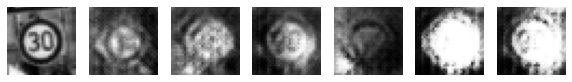

Epoch 5481 g_loss= 0.8912338 d_loss= 1.1704569 real_acc= 0.72 fake_acc= 0.84
Epoch 5482 g_loss= 0.9440291 d_loss= 1.1550533 real_acc= 0.72 fake_acc= 0.9
Epoch 5483 g_loss= 0.867152 d_loss= 1.2347777 real_acc= 0.62 fake_acc= 0.84
Epoch 5484 g_loss= 0.8309648 d_loss= 1.2108351 real_acc= 0.72 fake_acc= 0.76
Epoch 5485 g_loss= 0.8595341 d_loss= 1.1712306 real_acc= 0.74 fake_acc= 0.82
Epoch 5486 g_loss= 0.8782024 d_loss= 1.1561944 real_acc= 0.74 fake_acc= 0.8
Epoch 5487 g_loss= 0.84781927 d_loss= 1.1970042 real_acc= 0.7 fake_acc= 0.82
Epoch 5488 g_loss= 0.87886703 d_loss= 1.216342 real_acc= 0.64 fake_acc= 0.78
Epoch 5489 g_loss= 0.85727453 d_loss= 1.1984727 real_acc= 0.7 fake_acc= 0.76
Epoch 5490 g_loss= 0.8559952 d_loss= 1.167567 real_acc= 0.78 fake_acc= 0.72


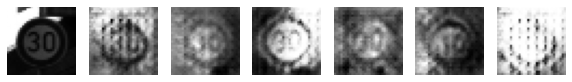

Epoch 5491 g_loss= 0.8205688 d_loss= 1.2046716 real_acc= 0.8 fake_acc= 0.68
Epoch 5492 g_loss= 0.83275026 d_loss= 1.1681992 real_acc= 0.86 fake_acc= 0.74
Epoch 5493 g_loss= 0.86045545 d_loss= 1.1560913 real_acc= 0.72 fake_acc= 0.66
Epoch 5494 g_loss= 0.8711215 d_loss= 1.2061745 real_acc= 0.68 fake_acc= 0.76
Epoch 5495 g_loss= 0.8302667 d_loss= 1.1920798 real_acc= 0.8 fake_acc= 0.7
Epoch 5496 g_loss= 0.8101632 d_loss= 1.2157476 real_acc= 0.72 fake_acc= 0.68
Epoch 5497 g_loss= 0.7562379 d_loss= 1.2689836 real_acc= 0.7 fake_acc= 0.58
Epoch 5498 g_loss= 0.8071218 d_loss= 1.2547266 real_acc= 0.66 fake_acc= 0.7
Epoch 5499 g_loss= 0.87605566 d_loss= 1.2160236 real_acc= 0.68 fake_acc= 0.82
Epoch 5500 g_loss= 0.8646305 d_loss= 1.2420263 real_acc= 0.72 fake_acc= 0.68


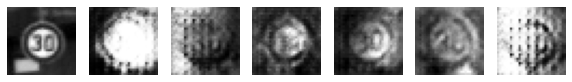

Epoch 5501 g_loss= 0.79490465 d_loss= 1.2509577 real_acc= 0.78 fake_acc= 0.5
Epoch 5502 g_loss= 0.83034587 d_loss= 1.2241591 real_acc= 0.74 fake_acc= 0.66
Epoch 5503 g_loss= 0.8013557 d_loss= 1.1914673 real_acc= 0.8 fake_acc= 0.76
Epoch 5504 g_loss= 0.7872885 d_loss= 1.2434217 real_acc= 0.74 fake_acc= 0.56
Epoch 5505 g_loss= 0.77922136 d_loss= 1.2558733 real_acc= 0.74 fake_acc= 0.68
Epoch 5506 g_loss= 0.80752134 d_loss= 1.2302747 real_acc= 0.76 fake_acc= 0.6
Epoch 5507 g_loss= 0.8173058 d_loss= 1.248424 real_acc= 0.64 fake_acc= 0.64
Epoch 5508 g_loss= 0.8126253 d_loss= 1.1981776 real_acc= 0.74 fake_acc= 0.76
Epoch 5509 g_loss= 0.8081279 d_loss= 1.1807325 real_acc= 0.78 fake_acc= 0.68
Epoch 5510 g_loss= 0.8876478 d_loss= 1.1965711 real_acc= 0.64 fake_acc= 0.84


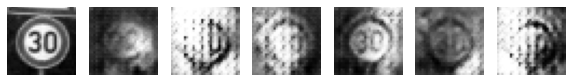

Epoch 5511 g_loss= 0.79396707 d_loss= 1.230288 real_acc= 0.72 fake_acc= 0.62
Epoch 5512 g_loss= 0.83602226 d_loss= 1.1898382 real_acc= 0.72 fake_acc= 0.64
Epoch 5513 g_loss= 0.811197 d_loss= 1.2273445 real_acc= 0.64 fake_acc= 0.7
Epoch 5514 g_loss= 0.8606899 d_loss= 1.1688108 real_acc= 0.78 fake_acc= 0.72
Epoch 5515 g_loss= 0.8537759 d_loss= 1.1975697 real_acc= 0.72 fake_acc= 0.7
Epoch 5516 g_loss= 0.8391675 d_loss= 1.1820492 real_acc= 0.76 fake_acc= 0.68
Epoch 5517 g_loss= 0.8570597 d_loss= 1.2396696 real_acc= 0.66 fake_acc= 0.68
Epoch 5518 g_loss= 0.8776177 d_loss= 1.1663878 real_acc= 0.68 fake_acc= 0.74
Epoch 5519 g_loss= 0.888876 d_loss= 1.1427076 real_acc= 0.76 fake_acc= 0.8
Epoch 5520 g_loss= 0.8739182 d_loss= 1.1715562 real_acc= 0.7 fake_acc= 0.68


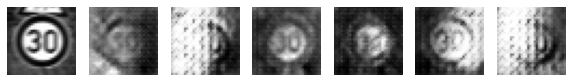

Epoch 5521 g_loss= 0.84912944 d_loss= 1.2059662 real_acc= 0.72 fake_acc= 0.76
Epoch 5522 g_loss= 0.836543 d_loss= 1.1960257 real_acc= 0.7 fake_acc= 0.64
Epoch 5523 g_loss= 0.812619 d_loss= 1.1802368 real_acc= 0.82 fake_acc= 0.6
Epoch 5524 g_loss= 0.83060884 d_loss= 1.1884571 real_acc= 0.74 fake_acc= 0.76
Epoch 5525 g_loss= 0.8195401 d_loss= 1.1917872 real_acc= 0.72 fake_acc= 0.66
Epoch 5526 g_loss= 0.8625635 d_loss= 1.2488769 real_acc= 0.68 fake_acc= 0.78
Epoch 5527 g_loss= 0.9107958 d_loss= 1.1916671 real_acc= 0.64 fake_acc= 0.8
Epoch 5528 g_loss= 0.88332856 d_loss= 1.1522452 real_acc= 0.78 fake_acc= 0.76
Epoch 5529 g_loss= 0.9019482 d_loss= 1.1613407 real_acc= 0.62 fake_acc= 0.78
Epoch 5530 g_loss= 0.95213777 d_loss= 1.1719704 real_acc= 0.62 fake_acc= 0.9


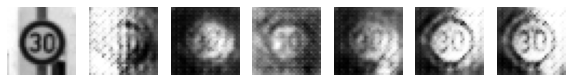

Epoch 5531 g_loss= 0.86463195 d_loss= 1.267456 real_acc= 0.56 fake_acc= 0.7
Epoch 5532 g_loss= 0.94291663 d_loss= 1.2121075 real_acc= 0.48 fake_acc= 0.8
Epoch 5533 g_loss= 0.89210165 d_loss= 1.1665468 real_acc= 0.72 fake_acc= 0.78
Epoch 5534 g_loss= 0.8324752 d_loss= 1.2613118 real_acc= 0.52 fake_acc= 0.64
Epoch 5535 g_loss= 0.8063068 d_loss= 1.1430504 real_acc= 0.82 fake_acc= 0.64
Epoch 5536 g_loss= 0.79684466 d_loss= 1.1982372 real_acc= 0.78 fake_acc= 0.72
Epoch 5537 g_loss= 0.8174017 d_loss= 1.1180124 real_acc= 0.88 fake_acc= 0.62
Epoch 5538 g_loss= 0.8231453 d_loss= 1.1604733 real_acc= 0.76 fake_acc= 0.76
Epoch 5539 g_loss= 0.81290716 d_loss= 1.2494555 real_acc= 0.68 fake_acc= 0.6
Epoch 5540 g_loss= 0.86324936 d_loss= 1.1185906 real_acc= 0.82 fake_acc= 0.68


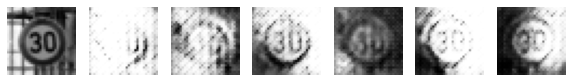

Epoch 5541 g_loss= 0.9057067 d_loss= 1.1534164 real_acc= 0.66 fake_acc= 0.8
Epoch 5542 g_loss= 0.9976647 d_loss= 1.1052836 real_acc= 0.7 fake_acc= 0.88
Epoch 5543 g_loss= 1.0283111 d_loss= 1.0617344 real_acc= 0.74 fake_acc= 0.88
Epoch 5544 g_loss= 0.95740896 d_loss= 1.152966 real_acc= 0.68 fake_acc= 0.78
Epoch 5545 g_loss= 0.970373 d_loss= 1.1232927 real_acc= 0.72 fake_acc= 0.82
Epoch 5546 g_loss= 0.9761732 d_loss= 1.1186821 real_acc= 0.76 fake_acc= 0.88
Epoch 5547 g_loss= 0.8691077 d_loss= 1.2163806 real_acc= 0.68 fake_acc= 0.72
Epoch 5548 g_loss= 0.9367407 d_loss= 1.0992472 real_acc= 0.7 fake_acc= 0.86
Epoch 5549 g_loss= 0.8752145 d_loss= 1.2092757 real_acc= 0.66 fake_acc= 0.68
Epoch 5550 g_loss= 0.8882798 d_loss= 1.2334116 real_acc= 0.56 fake_acc= 0.7


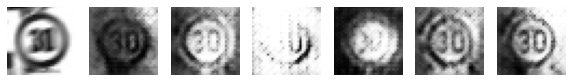

Epoch 5551 g_loss= 0.7980867 d_loss= 1.2635945 real_acc= 0.6 fake_acc= 0.7
Epoch 5552 g_loss= 0.7649435 d_loss= 1.189909 real_acc= 0.8 fake_acc= 0.6
Epoch 5553 g_loss= 0.8335484 d_loss= 1.1399812 real_acc= 0.84 fake_acc= 0.64
Epoch 5554 g_loss= 0.8393825 d_loss= 1.1798958 real_acc= 0.78 fake_acc= 0.7
Epoch 5555 g_loss= 0.83680207 d_loss= 1.256222 real_acc= 0.74 fake_acc= 0.7
Epoch 5556 g_loss= 0.82147276 d_loss= 1.2295266 real_acc= 0.72 fake_acc= 0.68
Epoch 5557 g_loss= 0.8893354 d_loss= 1.183891 real_acc= 0.68 fake_acc= 0.76
Epoch 5558 g_loss= 0.8367881 d_loss= 1.1758521 real_acc= 0.76 fake_acc= 0.7
Epoch 5559 g_loss= 0.80496943 d_loss= 1.2664526 real_acc= 0.66 fake_acc= 0.6
Epoch 5560 g_loss= 0.86693794 d_loss= 1.1509635 real_acc= 0.8 fake_acc= 0.78


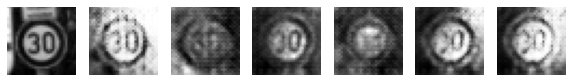

Epoch 5561 g_loss= 0.8784134 d_loss= 1.2977874 real_acc= 0.56 fake_acc= 0.76
Epoch 5562 g_loss= 0.8696123 d_loss= 1.2443695 real_acc= 0.64 fake_acc= 0.74
Epoch 5563 g_loss= 0.80727696 d_loss= 1.3305234 real_acc= 0.54 fake_acc= 0.66
Epoch 5564 g_loss= 0.8499979 d_loss= 1.4242568 real_acc= 0.42 fake_acc= 0.76
Epoch 5565 g_loss= 0.76342607 d_loss= 1.3467351 real_acc= 0.66 fake_acc= 0.5
Epoch 5566 g_loss= 0.7889316 d_loss= 1.2914968 real_acc= 0.66 fake_acc= 0.58
Epoch 5567 g_loss= 0.67793465 d_loss= 1.4767284 real_acc= 0.6 fake_acc= 0.46
Epoch 5568 g_loss= 0.62362695 d_loss= 1.4371784 real_acc= 0.62 fake_acc= 0.32
Epoch 5569 g_loss= 0.6404582 d_loss= 1.4711063 real_acc= 0.54 fake_acc= 0.44
Epoch 5570 g_loss= 0.67303383 d_loss= 1.3708243 real_acc= 0.66 fake_acc= 0.42


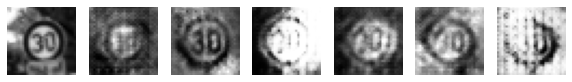

Epoch 5571 g_loss= 0.59218943 d_loss= 1.6835794 real_acc= 0.52 fake_acc= 0.3
Epoch 5572 g_loss= 0.7009233 d_loss= 1.6055368 real_acc= 0.34 fake_acc= 0.46
Epoch 5573 g_loss= 0.73890996 d_loss= 1.4488505 real_acc= 0.54 fake_acc= 0.68
Epoch 5574 g_loss= 0.70925957 d_loss= 1.5606589 real_acc= 0.36 fake_acc= 0.5
Epoch 5575 g_loss= 0.7210995 d_loss= 1.5336711 real_acc= 0.4 fake_acc= 0.48
Epoch 5576 g_loss= 0.76393914 d_loss= 1.4443302 real_acc= 0.42 fake_acc= 0.62
Epoch 5577 g_loss= 0.73125875 d_loss= 1.6139979 real_acc= 0.34 fake_acc= 0.48
Epoch 5578 g_loss= 0.68353933 d_loss= 1.6312642 real_acc= 0.36 fake_acc= 0.52
Epoch 5579 g_loss= 0.71650124 d_loss= 1.5442123 real_acc= 0.54 fake_acc= 0.5
Epoch 5580 g_loss= 0.6679508 d_loss= 1.6990087 real_acc= 0.32 fake_acc= 0.46


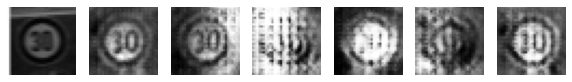

Epoch 5581 g_loss= 0.64753497 d_loss= 1.6408086 real_acc= 0.32 fake_acc= 0.42
Epoch 5582 g_loss= 0.60963655 d_loss= 1.6095474 real_acc= 0.4 fake_acc= 0.4
Epoch 5583 g_loss= 0.59790426 d_loss= 1.6504917 real_acc= 0.52 fake_acc= 0.22
Epoch 5584 g_loss= 0.52879095 d_loss= 1.7396266 real_acc= 0.42 fake_acc= 0.12
Epoch 5585 g_loss= 0.5229567 d_loss= 1.6766975 real_acc= 0.46 fake_acc= 0.12
Epoch 5586 g_loss= 0.5456891 d_loss= 1.5775733 real_acc= 0.58 fake_acc= 0.1
Epoch 5587 g_loss= 0.61052984 d_loss= 1.6255112 real_acc= 0.4 fake_acc= 0.26
Epoch 5588 g_loss= 0.61635137 d_loss= 1.6019266 real_acc= 0.42 fake_acc= 0.32
Epoch 5589 g_loss= 0.62759215 d_loss= 1.589221 real_acc= 0.5 fake_acc= 0.24
Epoch 5590 g_loss= 0.60576254 d_loss= 1.6311936 real_acc= 0.5 fake_acc= 0.28


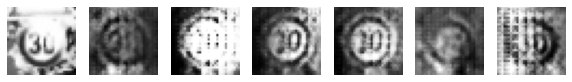

Epoch 5591 g_loss= 0.6055287 d_loss= 1.6370935 real_acc= 0.5 fake_acc= 0.26
Epoch 5592 g_loss= 0.6316656 d_loss= 1.5646358 real_acc= 0.48 fake_acc= 0.22
Epoch 5593 g_loss= 0.62360674 d_loss= 1.5810428 real_acc= 0.48 fake_acc= 0.3
Epoch 5594 g_loss= 0.61271936 d_loss= 1.5111117 real_acc= 0.64 fake_acc= 0.28
Epoch 5595 g_loss= 0.6305444 d_loss= 1.5477256 real_acc= 0.56 fake_acc= 0.26
Epoch 5596 g_loss= 0.6680584 d_loss= 1.47591 real_acc= 0.5 fake_acc= 0.4
Epoch 5597 g_loss= 0.655337 d_loss= 1.5048442 real_acc= 0.5 fake_acc= 0.26
Epoch 5598 g_loss= 0.6585083 d_loss= 1.4643127 real_acc= 0.64 fake_acc= 0.3
Epoch 5599 g_loss= 0.7129887 d_loss= 1.4450483 real_acc= 0.58 fake_acc= 0.4
Epoch 5600 g_loss= 0.75026214 d_loss= 1.3844434 real_acc= 0.56 fake_acc= 0.48


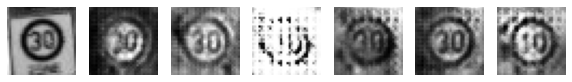

Epoch 5601 g_loss= 0.69813216 d_loss= 1.3750731 real_acc= 0.7 fake_acc= 0.5
Epoch 5602 g_loss= 0.7126792 d_loss= 1.3937175 real_acc= 0.68 fake_acc= 0.44
Epoch 5603 g_loss= 0.7495884 d_loss= 1.3424118 real_acc= 0.72 fake_acc= 0.48
Epoch 5604 g_loss= 0.7521295 d_loss= 1.3137573 real_acc= 0.7 fake_acc= 0.52
Epoch 5605 g_loss= 0.80948174 d_loss= 1.3154471 real_acc= 0.64 fake_acc= 0.56
Epoch 5606 g_loss= 0.82118803 d_loss= 1.2551055 real_acc= 0.62 fake_acc= 0.74
Epoch 5607 g_loss= 0.7843408 d_loss= 1.3081915 real_acc= 0.6 fake_acc= 0.54
Epoch 5608 g_loss= 0.86644536 d_loss= 1.1969434 real_acc= 0.82 fake_acc= 0.56
Epoch 5609 g_loss= 0.88231283 d_loss= 1.201955 real_acc= 0.82 fake_acc= 0.7
Epoch 5610 g_loss= 0.8743414 d_loss= 1.1898358 real_acc= 0.78 fake_acc= 0.72


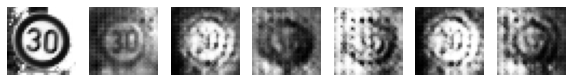

Epoch 5611 g_loss= 0.8478637 d_loss= 1.184617 real_acc= 0.84 fake_acc= 0.64
Epoch 5612 g_loss= 0.8828236 d_loss= 1.1893992 real_acc= 0.8 fake_acc= 0.72
Epoch 5613 g_loss= 0.8422231 d_loss= 1.1738801 real_acc= 0.74 fake_acc= 0.84
Epoch 5614 g_loss= 0.974347 d_loss= 1.0964713 real_acc= 0.68 fake_acc= 0.86
Epoch 5615 g_loss= 0.9124769 d_loss= 1.0703857 real_acc= 0.88 fake_acc= 0.8
Epoch 5616 g_loss= 0.9251126 d_loss= 1.1123906 real_acc= 0.76 fake_acc= 0.86
Epoch 5617 g_loss= 0.9237137 d_loss= 1.0956497 real_acc= 0.86 fake_acc= 0.88
Epoch 5618 g_loss= 0.99918985 d_loss= 1.0839806 real_acc= 0.86 fake_acc= 0.96
Epoch 5619 g_loss= 0.9950991 d_loss= 1.0656127 real_acc= 0.82 fake_acc= 0.88
Epoch 5620 g_loss= 0.980318 d_loss= 1.0642519 real_acc= 0.8 fake_acc= 0.92


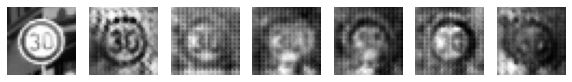

Epoch 5621 g_loss= 1.017736 d_loss= 1.0618072 real_acc= 0.82 fake_acc= 0.98
Epoch 5622 g_loss= 1.0162511 d_loss= 1.0505762 real_acc= 0.74 fake_acc= 0.9
Epoch 5623 g_loss= 0.984829 d_loss= 1.090306 real_acc= 0.74 fake_acc= 0.94
Epoch 5624 g_loss= 0.97532946 d_loss= 1.0677657 real_acc= 0.78 fake_acc= 0.92
Epoch 5625 g_loss= 0.96793586 d_loss= 1.0532198 real_acc= 0.88 fake_acc= 0.94
Epoch 5626 g_loss= 0.93126565 d_loss= 1.0812137 real_acc= 0.74 fake_acc= 0.86
Epoch 5627 g_loss= 0.9251485 d_loss= 1.1159303 real_acc= 0.78 fake_acc= 0.92
Epoch 5628 g_loss= 0.9399759 d_loss= 1.0840507 real_acc= 0.82 fake_acc= 0.88
Epoch 5629 g_loss= 0.95694274 d_loss= 1.0783532 real_acc= 0.84 fake_acc= 0.88
Epoch 5630 g_loss= 0.9467529 d_loss= 1.1007748 real_acc= 0.76 fake_acc= 0.9


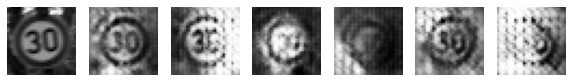

Epoch 5631 g_loss= 0.9623134 d_loss= 1.1435564 real_acc= 0.7 fake_acc= 0.92
Epoch 5632 g_loss= 0.9563384 d_loss= 1.1240335 real_acc= 0.7 fake_acc= 0.92
Epoch 5633 g_loss= 0.94823474 d_loss= 1.0901303 real_acc= 0.76 fake_acc= 0.92
Epoch 5634 g_loss= 0.90091866 d_loss= 1.1269748 real_acc= 0.78 fake_acc= 0.9
Epoch 5635 g_loss= 0.88592064 d_loss= 1.0987074 real_acc= 0.82 fake_acc= 0.78
Epoch 5636 g_loss= 0.84817976 d_loss= 1.1746608 real_acc= 0.74 fake_acc= 0.86
Epoch 5637 g_loss= 0.79851335 d_loss= 1.2260007 real_acc= 0.72 fake_acc= 0.74
Epoch 5638 g_loss= 0.7947031 d_loss= 1.24368 real_acc= 0.66 fake_acc= 0.78
Epoch 5639 g_loss= 0.80251557 d_loss= 1.2259127 real_acc= 0.72 fake_acc= 0.72
Epoch 5640 g_loss= 0.83656996 d_loss= 1.1914723 real_acc= 0.72 fake_acc= 0.8


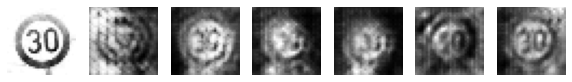

Epoch 5641 g_loss= 0.8169445 d_loss= 1.2103996 real_acc= 0.78 fake_acc= 0.74
Epoch 5642 g_loss= 0.79310846 d_loss= 1.2877477 real_acc= 0.7 fake_acc= 0.74
Epoch 5643 g_loss= 0.7833438 d_loss= 1.2689725 real_acc= 0.68 fake_acc= 0.66
Epoch 5644 g_loss= 0.8169701 d_loss= 1.2426121 real_acc= 0.64 fake_acc= 0.76
Epoch 5645 g_loss= 0.82917196 d_loss= 1.2340913 real_acc= 0.76 fake_acc= 0.68
Epoch 5646 g_loss= 0.81090045 d_loss= 1.2689475 real_acc= 0.68 fake_acc= 0.58
Epoch 5647 g_loss= 0.7943442 d_loss= 1.2677473 real_acc= 0.68 fake_acc= 0.62
Epoch 5648 g_loss= 0.7449428 d_loss= 1.3152256 real_acc= 0.66 fake_acc= 0.54
Epoch 5649 g_loss= 0.7540011 d_loss= 1.3610009 real_acc= 0.54 fake_acc= 0.62
Epoch 5650 g_loss= 0.814552 d_loss= 1.2534356 real_acc= 0.72 fake_acc= 0.54


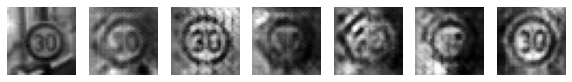

Epoch 5651 g_loss= 0.77213836 d_loss= 1.2955235 real_acc= 0.68 fake_acc= 0.6
Epoch 5652 g_loss= 0.81625754 d_loss= 1.2548193 real_acc= 0.68 fake_acc= 0.6
Epoch 5653 g_loss= 0.78637314 d_loss= 1.3170075 real_acc= 0.62 fake_acc= 0.54
Epoch 5654 g_loss= 0.76183975 d_loss= 1.2871854 real_acc= 0.7 fake_acc= 0.48
Epoch 5655 g_loss= 0.8143286 d_loss= 1.2607908 real_acc= 0.7 fake_acc= 0.58
Epoch 5656 g_loss= 0.802466 d_loss= 1.2261806 real_acc= 0.82 fake_acc= 0.56
Epoch 5657 g_loss= 0.7474017 d_loss= 1.3157156 real_acc= 0.62 fake_acc= 0.54
Epoch 5658 g_loss= 0.830317 d_loss= 1.2560384 real_acc= 0.72 fake_acc= 0.62
Epoch 5659 g_loss= 0.8355419 d_loss= 1.2706319 real_acc= 0.64 fake_acc= 0.64
Epoch 5660 g_loss= 0.82706785 d_loss= 1.2769647 real_acc= 0.68 fake_acc= 0.62


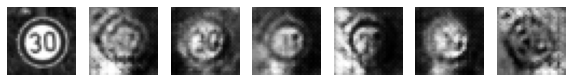

Epoch 5661 g_loss= 0.8416243 d_loss= 1.280973 real_acc= 0.7 fake_acc= 0.56
Epoch 5662 g_loss= 0.77336276 d_loss= 1.3055009 real_acc= 0.76 fake_acc= 0.52
Epoch 5663 g_loss= 0.75883996 d_loss= 1.290658 real_acc= 0.74 fake_acc= 0.48
Epoch 5664 g_loss= 0.7553507 d_loss= 1.2377435 real_acc= 0.76 fake_acc= 0.54
Epoch 5665 g_loss= 0.7668913 d_loss= 1.2805741 real_acc= 0.7 fake_acc= 0.58
Epoch 5666 g_loss= 0.8261675 d_loss= 1.2552986 real_acc= 0.74 fake_acc= 0.58
Epoch 5667 g_loss= 0.792381 d_loss= 1.3263743 real_acc= 0.6 fake_acc= 0.58
Epoch 5668 g_loss= 0.859217 d_loss= 1.2496399 real_acc= 0.6 fake_acc= 0.72
Epoch 5669 g_loss= 0.8944632 d_loss= 1.3313199 real_acc= 0.56 fake_acc= 0.76
Epoch 5670 g_loss= 0.8788218 d_loss= 1.2214142 real_acc= 0.66 fake_acc= 0.74


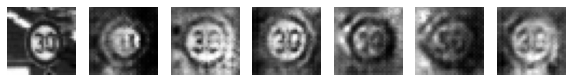

Epoch 5671 g_loss= 0.82554793 d_loss= 1.1992562 real_acc= 0.82 fake_acc= 0.58
Epoch 5672 g_loss= 0.90458125 d_loss= 1.2386056 real_acc= 0.66 fake_acc= 0.78
Epoch 5673 g_loss= 0.8113829 d_loss= 1.2259703 real_acc= 0.76 fake_acc= 0.72
Epoch 5674 g_loss= 0.8017848 d_loss= 1.2028158 real_acc= 0.8 fake_acc= 0.58
Epoch 5675 g_loss= 0.83319116 d_loss= 1.2194904 real_acc= 0.72 fake_acc= 0.66
Epoch 5676 g_loss= 0.8469121 d_loss= 1.2155093 real_acc= 0.76 fake_acc= 0.82
Epoch 5677 g_loss= 0.82705986 d_loss= 1.3035216 real_acc= 0.6 fake_acc= 0.62
Epoch 5678 g_loss= 0.8087823 d_loss= 1.3333566 real_acc= 0.54 fake_acc= 0.72
Epoch 5679 g_loss= 0.8470464 d_loss= 1.252197 real_acc= 0.56 fake_acc= 0.66
Epoch 5680 g_loss= 0.83830315 d_loss= 1.2561419 real_acc= 0.68 fake_acc= 0.62


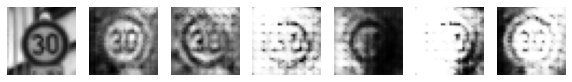

Epoch 5681 g_loss= 0.8296643 d_loss= 1.2701976 real_acc= 0.7 fake_acc= 0.62
Epoch 5682 g_loss= 0.76159936 d_loss= 1.2728674 real_acc= 0.8 fake_acc= 0.52
Epoch 5683 g_loss= 0.7442052 d_loss= 1.2703393 real_acc= 0.7 fake_acc= 0.52
Epoch 5684 g_loss= 0.7379782 d_loss= 1.3726338 real_acc= 0.64 fake_acc= 0.56
Epoch 5685 g_loss= 0.7850966 d_loss= 1.1910317 real_acc= 0.84 fake_acc= 0.64
Epoch 5686 g_loss= 0.7754366 d_loss= 1.3363932 real_acc= 0.64 fake_acc= 0.58
Epoch 5687 g_loss= 0.7792871 d_loss= 1.3400939 real_acc= 0.6 fake_acc= 0.62
Epoch 5688 g_loss= 0.79498535 d_loss= 1.2789819 real_acc= 0.7 fake_acc= 0.64
Epoch 5689 g_loss= 0.85920024 d_loss= 1.2663996 real_acc= 0.52 fake_acc= 0.76
Epoch 5690 g_loss= 0.8581801 d_loss= 1.3237169 real_acc= 0.62 fake_acc= 0.7


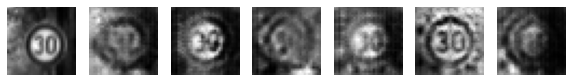

Epoch 5691 g_loss= 0.8428032 d_loss= 1.3649203 real_acc= 0.56 fake_acc= 0.68
Epoch 5692 g_loss= 0.8263657 d_loss= 1.4195149 real_acc= 0.52 fake_acc= 0.64
Epoch 5693 g_loss= 0.789002 d_loss= 1.3365242 real_acc= 0.62 fake_acc= 0.6
Epoch 5694 g_loss= 0.7151626 d_loss= 1.4492571 real_acc= 0.54 fake_acc= 0.4
Epoch 5695 g_loss= 0.7464164 d_loss= 1.365675 real_acc= 0.6 fake_acc= 0.58
Epoch 5696 g_loss= 0.7014354 d_loss= 1.4768932 real_acc= 0.56 fake_acc= 0.46
Epoch 5697 g_loss= 0.6734238 d_loss= 1.4371865 real_acc= 0.66 fake_acc= 0.4
Epoch 5698 g_loss= 0.6683205 d_loss= 1.4286938 real_acc= 0.58 fake_acc= 0.38
Epoch 5699 g_loss= 0.70901453 d_loss= 1.4728792 real_acc= 0.52 fake_acc= 0.44
Epoch 5700 g_loss= 0.67434067 d_loss= 1.4549124 real_acc= 0.6 fake_acc= 0.36


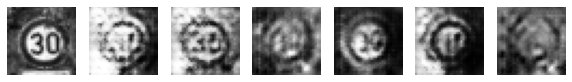

Epoch 5701 g_loss= 0.68871546 d_loss= 1.4970372 real_acc= 0.4 fake_acc= 0.44
Epoch 5702 g_loss= 0.64976203 d_loss= 1.4659631 real_acc= 0.54 fake_acc= 0.32
Epoch 5703 g_loss= 0.6538894 d_loss= 1.5099294 real_acc= 0.5 fake_acc= 0.38
Epoch 5704 g_loss= 0.67194474 d_loss= 1.5216931 real_acc= 0.44 fake_acc= 0.44
Epoch 5705 g_loss= 0.6314933 d_loss= 1.5581396 real_acc= 0.44 fake_acc= 0.22
Epoch 5706 g_loss= 0.6237239 d_loss= 1.512373 real_acc= 0.46 fake_acc= 0.22
Epoch 5707 g_loss= 0.6409343 d_loss= 1.5193207 real_acc= 0.5 fake_acc= 0.36
Epoch 5708 g_loss= 0.64480203 d_loss= 1.5227532 real_acc= 0.4 fake_acc= 0.38
Epoch 5709 g_loss= 0.6518858 d_loss= 1.5155926 real_acc= 0.46 fake_acc= 0.32
Epoch 5710 g_loss= 0.599995 d_loss= 1.7032044 real_acc= 0.32 fake_acc= 0.34


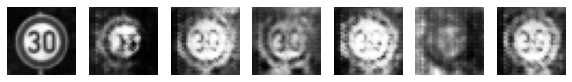

Epoch 5711 g_loss= 0.6472822 d_loss= 1.6109645 real_acc= 0.44 fake_acc= 0.34
Epoch 5712 g_loss= 0.6115557 d_loss= 1.5851684 real_acc= 0.36 fake_acc= 0.24
Epoch 5713 g_loss= 0.64460963 d_loss= 1.5039804 real_acc= 0.38 fake_acc= 0.34
Epoch 5714 g_loss= 0.6691038 d_loss= 1.624957 real_acc= 0.24 fake_acc= 0.42
Epoch 5715 g_loss= 0.67211396 d_loss= 1.5935858 real_acc= 0.34 fake_acc= 0.4
Epoch 5716 g_loss= 0.64972526 d_loss= 1.6087918 real_acc= 0.32 fake_acc= 0.44
Epoch 5717 g_loss= 0.6892501 d_loss= 1.5338206 real_acc= 0.28 fake_acc= 0.5
Epoch 5718 g_loss= 0.67744803 d_loss= 1.5651691 real_acc= 0.3 fake_acc= 0.54
Epoch 5719 g_loss= 0.6534925 d_loss= 1.4865038 real_acc= 0.48 fake_acc= 0.38
Epoch 5720 g_loss= 0.65811706 d_loss= 1.5657542 real_acc= 0.38 fake_acc= 0.46


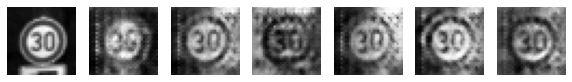

Epoch 5721 g_loss= 0.70962965 d_loss= 1.479877 real_acc= 0.46 fake_acc= 0.48
Epoch 5722 g_loss= 0.6878779 d_loss= 1.5912746 real_acc= 0.2 fake_acc= 0.48
Epoch 5723 g_loss= 0.6767194 d_loss= 1.5770202 real_acc= 0.32 fake_acc= 0.48
Epoch 5724 g_loss= 0.6902858 d_loss= 1.5022879 real_acc= 0.4 fake_acc= 0.46
Epoch 5725 g_loss= 0.63491684 d_loss= 1.5531201 real_acc= 0.44 fake_acc= 0.28
Epoch 5726 g_loss= 0.6737447 d_loss= 1.4889481 real_acc= 0.46 fake_acc= 0.5
Epoch 5727 g_loss= 0.66596586 d_loss= 1.4200323 real_acc= 0.6 fake_acc= 0.36
Epoch 5728 g_loss= 0.6472446 d_loss= 1.4284246 real_acc= 0.68 fake_acc= 0.42
Epoch 5729 g_loss= 0.6725335 d_loss= 1.4084808 real_acc= 0.58 fake_acc= 0.36
Epoch 5730 g_loss= 0.68643296 d_loss= 1.3516798 real_acc= 0.68 fake_acc= 0.52


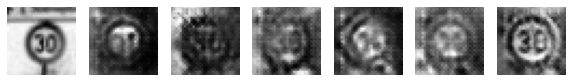

Epoch 5731 g_loss= 0.7131658 d_loss= 1.3277055 real_acc= 0.74 fake_acc= 0.48
Epoch 5732 g_loss= 0.7682259 d_loss= 1.2977295 real_acc= 0.66 fake_acc= 0.66
Epoch 5733 g_loss= 0.8318298 d_loss= 1.2815046 real_acc= 0.56 fake_acc= 0.78
Epoch 5734 g_loss= 0.8675734 d_loss= 1.2572885 real_acc= 0.56 fake_acc= 0.82
Epoch 5735 g_loss= 0.85577685 d_loss= 1.2865287 real_acc= 0.48 fake_acc= 0.76
Epoch 5736 g_loss= 0.895972 d_loss= 1.2593169 real_acc= 0.54 fake_acc= 0.88
Epoch 5737 g_loss= 0.916972 d_loss= 1.2332681 real_acc= 0.52 fake_acc= 0.86
Epoch 5738 g_loss= 0.94813186 d_loss= 1.1775398 real_acc= 0.6 fake_acc= 0.86
Epoch 5739 g_loss= 0.89582336 d_loss= 1.1952388 real_acc= 0.66 fake_acc= 0.9
Epoch 5740 g_loss= 0.8941137 d_loss= 1.2123698 real_acc= 0.64 fake_acc= 0.9


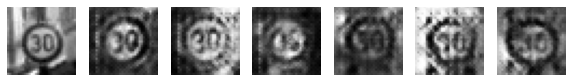

Epoch 5741 g_loss= 0.8695613 d_loss= 1.2207569 real_acc= 0.64 fake_acc= 0.88
Epoch 5742 g_loss= 0.9246763 d_loss= 1.1463931 real_acc= 0.68 fake_acc= 0.96
Epoch 5743 g_loss= 0.93107486 d_loss= 1.1357424 real_acc= 0.72 fake_acc= 0.96
Epoch 5744 g_loss= 0.9046201 d_loss= 1.1952268 real_acc= 0.6 fake_acc= 0.82
Epoch 5745 g_loss= 0.90134406 d_loss= 1.1026726 real_acc= 0.86 fake_acc= 0.9
Epoch 5746 g_loss= 0.9036904 d_loss= 1.1700404 real_acc= 0.68 fake_acc= 0.94
Epoch 5747 g_loss= 0.8789286 d_loss= 1.1437597 real_acc= 0.76 fake_acc= 0.88
Epoch 5748 g_loss= 0.90950197 d_loss= 1.1025598 real_acc= 0.74 fake_acc= 0.92
Epoch 5749 g_loss= 0.8713291 d_loss= 1.1733443 real_acc= 0.7 fake_acc= 0.92
Epoch 5750 g_loss= 0.90214056 d_loss= 1.1693171 real_acc= 0.6 fake_acc= 0.88


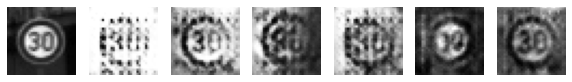

Epoch 5751 g_loss= 0.84405494 d_loss= 1.1612782 real_acc= 0.76 fake_acc= 0.84
Epoch 5752 g_loss= 0.9077067 d_loss= 1.1509941 real_acc= 0.7 fake_acc= 0.82
Epoch 5753 g_loss= 0.84863436 d_loss= 1.1948034 real_acc= 0.64 fake_acc= 0.88
Epoch 5754 g_loss= 0.91181535 d_loss= 1.1664621 real_acc= 0.62 fake_acc= 0.9
Epoch 5755 g_loss= 0.897502 d_loss= 1.2259977 real_acc= 0.5 fake_acc= 0.84
Epoch 5756 g_loss= 0.8867739 d_loss= 1.1920717 real_acc= 0.54 fake_acc= 0.82
Epoch 5757 g_loss= 0.8626404 d_loss= 1.2247508 real_acc= 0.64 fake_acc= 0.8
Epoch 5758 g_loss= 0.8613651 d_loss= 1.227422 real_acc= 0.56 fake_acc= 0.86
Epoch 5759 g_loss= 0.87813 d_loss= 1.2101674 real_acc= 0.52 fake_acc= 0.8
Epoch 5760 g_loss= 0.8481521 d_loss= 1.1999118 real_acc= 0.7 fake_acc= 0.76


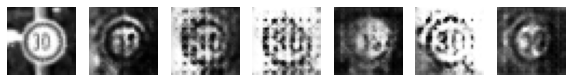

Epoch 5761 g_loss= 0.832544 d_loss= 1.2280674 real_acc= 0.7 fake_acc= 0.76
Epoch 5762 g_loss= 0.84759605 d_loss= 1.2685988 real_acc= 0.6 fake_acc= 0.74
Epoch 5763 g_loss= 0.7311601 d_loss= 1.2562165 real_acc= 0.74 fake_acc= 0.48
Epoch 5764 g_loss= 0.75532806 d_loss= 1.2994301 real_acc= 0.66 fake_acc= 0.66
Epoch 5765 g_loss= 0.7680705 d_loss= 1.2629132 real_acc= 0.74 fake_acc= 0.6
Epoch 5766 g_loss= 0.801716 d_loss= 1.2603841 real_acc= 0.64 fake_acc= 0.66
Epoch 5767 g_loss= 0.8012335 d_loss= 1.2723858 real_acc= 0.54 fake_acc= 0.74
Epoch 5768 g_loss= 0.87941605 d_loss= 1.1975727 real_acc= 0.68 fake_acc= 0.76
Epoch 5769 g_loss= 0.8270624 d_loss= 1.2722328 real_acc= 0.66 fake_acc= 0.58
Epoch 5770 g_loss= 0.8018785 d_loss= 1.2455829 real_acc= 0.66 fake_acc= 0.64


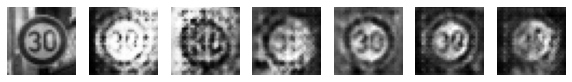

Epoch 5771 g_loss= 0.8205103 d_loss= 1.2913797 real_acc= 0.62 fake_acc= 0.68
Epoch 5772 g_loss= 0.79495656 d_loss= 1.2363386 real_acc= 0.74 fake_acc= 0.64
Epoch 5773 g_loss= 0.82852453 d_loss= 1.1768628 real_acc= 0.86 fake_acc= 0.72
Epoch 5774 g_loss= 0.8155909 d_loss= 1.2908095 real_acc= 0.6 fake_acc= 0.66
Epoch 5775 g_loss= 0.79292315 d_loss= 1.2613428 real_acc= 0.74 fake_acc= 0.64
Epoch 5776 g_loss= 0.7908821 d_loss= 1.307939 real_acc= 0.64 fake_acc= 0.6
Epoch 5777 g_loss= 0.7755762 d_loss= 1.2601185 real_acc= 0.68 fake_acc= 0.58
Epoch 5778 g_loss= 0.7584797 d_loss= 1.2757013 real_acc= 0.68 fake_acc= 0.54
Epoch 5779 g_loss= 0.7436823 d_loss= 1.2686952 real_acc= 0.76 fake_acc= 0.52
Epoch 5780 g_loss= 0.7819493 d_loss= 1.2540112 real_acc= 0.72 fake_acc= 0.68


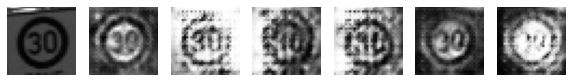

Epoch 5781 g_loss= 0.86574626 d_loss= 1.1979316 real_acc= 0.7 fake_acc= 0.74
Epoch 5782 g_loss= 0.8817529 d_loss= 1.1994667 real_acc= 0.52 fake_acc= 0.82
Epoch 5783 g_loss= 0.80961 d_loss= 1.1819472 real_acc= 0.66 fake_acc= 0.7
Epoch 5784 g_loss= 0.8431795 d_loss= 1.2176231 real_acc= 0.6 fake_acc= 0.72
Epoch 5785 g_loss= 0.820897 d_loss= 1.2644594 real_acc= 0.58 fake_acc= 0.74
Epoch 5786 g_loss= 0.9456506 d_loss= 1.1671764 real_acc= 0.6 fake_acc= 0.86
Epoch 5787 g_loss= 0.9183954 d_loss= 1.2085657 real_acc= 0.64 fake_acc= 0.9
Epoch 5788 g_loss= 0.8528895 d_loss= 1.2068388 real_acc= 0.68 fake_acc= 0.84
Epoch 5789 g_loss= 0.9086167 d_loss= 1.1674123 real_acc= 0.7 fake_acc= 0.78
Epoch 5790 g_loss= 0.7752975 d_loss= 1.2310576 real_acc= 0.72 fake_acc= 0.66


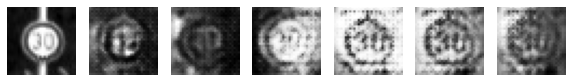

Epoch 5791 g_loss= 0.80866927 d_loss= 1.1995468 real_acc= 0.72 fake_acc= 0.66
Epoch 5792 g_loss= 0.7642044 d_loss= 1.2426211 real_acc= 0.82 fake_acc= 0.58
Epoch 5793 g_loss= 0.79807246 d_loss= 1.227829 real_acc= 0.68 fake_acc= 0.78
Epoch 5794 g_loss= 0.8739354 d_loss= 1.2057159 real_acc= 0.62 fake_acc= 0.82
Epoch 5795 g_loss= 0.84639376 d_loss= 1.1885984 real_acc= 0.72 fake_acc= 0.82
Epoch 5796 g_loss= 0.83687425 d_loss= 1.2333156 real_acc= 0.62 fake_acc= 0.82
Epoch 5797 g_loss= 0.81365746 d_loss= 1.2414567 real_acc= 0.58 fake_acc= 0.8
Epoch 5798 g_loss= 0.8281187 d_loss= 1.2424427 real_acc= 0.56 fake_acc= 0.78
Epoch 5799 g_loss= 0.8065632 d_loss= 1.3391962 real_acc= 0.52 fake_acc= 0.7
Epoch 5800 g_loss= 0.76457345 d_loss= 1.2657849 real_acc= 0.68 fake_acc= 0.64


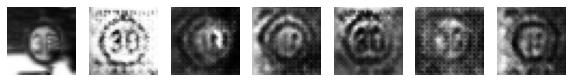

Epoch 5801 g_loss= 0.8289913 d_loss= 1.276326 real_acc= 0.62 fake_acc= 0.8
Epoch 5802 g_loss= 0.75960314 d_loss= 1.3224216 real_acc= 0.62 fake_acc= 0.7
Epoch 5803 g_loss= 0.8171433 d_loss= 1.2352929 real_acc= 0.66 fake_acc= 0.82
Epoch 5804 g_loss= 0.7734306 d_loss= 1.317214 real_acc= 0.64 fake_acc= 0.74
Epoch 5805 g_loss= 0.80653924 d_loss= 1.2958082 real_acc= 0.54 fake_acc= 0.82
Epoch 5806 g_loss= 0.7988262 d_loss= 1.28703 real_acc= 0.62 fake_acc= 0.8
Epoch 5807 g_loss= 0.8102243 d_loss= 1.283222 real_acc= 0.58 fake_acc= 0.82
Epoch 5808 g_loss= 0.78102416 d_loss= 1.3322413 real_acc= 0.5 fake_acc= 0.78
Epoch 5809 g_loss= 0.7960884 d_loss= 1.3230792 real_acc= 0.64 fake_acc= 0.68
Epoch 5810 g_loss= 0.75806314 d_loss= 1.3627448 real_acc= 0.5 fake_acc= 0.72


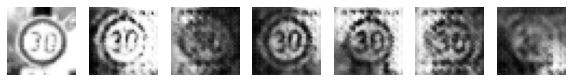

Epoch 5811 g_loss= 0.72744834 d_loss= 1.3858051 real_acc= 0.52 fake_acc= 0.52
Epoch 5812 g_loss= 0.7321208 d_loss= 1.3705568 real_acc= 0.6 fake_acc= 0.64
Epoch 5813 g_loss= 0.6965604 d_loss= 1.3892941 real_acc= 0.54 fake_acc= 0.6
Epoch 5814 g_loss= 0.65403384 d_loss= 1.4493747 real_acc= 0.6 fake_acc= 0.4
Epoch 5815 g_loss= 0.711288 d_loss= 1.3234601 real_acc= 0.72 fake_acc= 0.54
Epoch 5816 g_loss= 0.68100584 d_loss= 1.4003699 real_acc= 0.52 fake_acc= 0.44
Epoch 5817 g_loss= 0.70133317 d_loss= 1.3634794 real_acc= 0.64 fake_acc= 0.54
Epoch 5818 g_loss= 0.6881318 d_loss= 1.4090167 real_acc= 0.6 fake_acc= 0.52
Epoch 5819 g_loss= 0.7561129 d_loss= 1.4109056 real_acc= 0.48 fake_acc= 0.68
Epoch 5820 g_loss= 0.7377799 d_loss= 1.4094325 real_acc= 0.52 fake_acc= 0.58


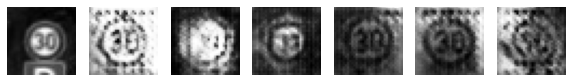

Epoch 5821 g_loss= 0.7436626 d_loss= 1.4768558 real_acc= 0.42 fake_acc= 0.58
Epoch 5822 g_loss= 0.6726771 d_loss= 1.460448 real_acc= 0.62 fake_acc= 0.44
Epoch 5823 g_loss= 0.69780815 d_loss= 1.4410965 real_acc= 0.5 fake_acc= 0.48
Epoch 5824 g_loss= 0.67597747 d_loss= 1.4300232 real_acc= 0.66 fake_acc= 0.36
Epoch 5825 g_loss= 0.6383903 d_loss= 1.4023101 real_acc= 0.78 fake_acc= 0.36
Epoch 5826 g_loss= 0.6396519 d_loss= 1.3416417 real_acc= 0.8 fake_acc= 0.38
Epoch 5827 g_loss= 0.64283895 d_loss= 1.4745306 real_acc= 0.58 fake_acc= 0.32
Epoch 5828 g_loss= 0.66600585 d_loss= 1.3937336 real_acc= 0.7 fake_acc= 0.36
Epoch 5829 g_loss= 0.68910074 d_loss= 1.3506316 real_acc= 0.68 fake_acc= 0.52
Epoch 5830 g_loss= 0.6647072 d_loss= 1.3889279 real_acc= 0.58 fake_acc= 0.4


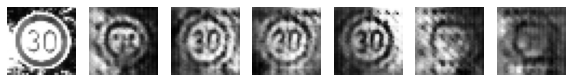

Epoch 5831 g_loss= 0.74674153 d_loss= 1.3647375 real_acc= 0.58 fake_acc= 0.58
Epoch 5832 g_loss= 0.73622614 d_loss= 1.3748301 real_acc= 0.54 fake_acc= 0.6
Epoch 5833 g_loss= 0.7346172 d_loss= 1.4542096 real_acc= 0.56 fake_acc= 0.52
Epoch 5834 g_loss= 0.7400938 d_loss= 1.424794 real_acc= 0.46 fake_acc= 0.66
Epoch 5835 g_loss= 0.7077367 d_loss= 1.360548 real_acc= 0.6 fake_acc= 0.48
Epoch 5836 g_loss= 0.7044214 d_loss= 1.3777788 real_acc= 0.68 fake_acc= 0.52
Epoch 5837 g_loss= 0.67005557 d_loss= 1.3828063 real_acc= 0.66 fake_acc= 0.34
Epoch 5838 g_loss= 0.650585 d_loss= 1.3238 real_acc= 0.84 fake_acc= 0.32
Epoch 5839 g_loss= 0.6649743 d_loss= 1.3754777 real_acc= 0.76 fake_acc= 0.34
Epoch 5840 g_loss= 0.6648292 d_loss= 1.344066 real_acc= 0.74 fake_acc= 0.34


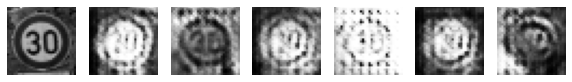

Epoch 5841 g_loss= 0.680039 d_loss= 1.2934322 real_acc= 0.78 fake_acc= 0.46
Epoch 5842 g_loss= 0.70931524 d_loss= 1.3351562 real_acc= 0.72 fake_acc= 0.52
Epoch 5843 g_loss= 0.75432867 d_loss= 1.338351 real_acc= 0.62 fake_acc= 0.64
Epoch 5844 g_loss= 0.7558735 d_loss= 1.347799 real_acc= 0.64 fake_acc= 0.6
Epoch 5845 g_loss= 0.7848098 d_loss= 1.2393105 real_acc= 0.7 fake_acc= 0.62
Epoch 5846 g_loss= 0.74735826 d_loss= 1.3363878 real_acc= 0.62 fake_acc= 0.54
Epoch 5847 g_loss= 0.7943547 d_loss= 1.2964789 real_acc= 0.62 fake_acc= 0.78
Epoch 5848 g_loss= 0.7917822 d_loss= 1.2342682 real_acc= 0.78 fake_acc= 0.8
Epoch 5849 g_loss= 0.7523262 d_loss= 1.2937388 real_acc= 0.66 fake_acc= 0.7
Epoch 5850 g_loss= 0.76884925 d_loss= 1.3226808 real_acc= 0.58 fake_acc= 0.58


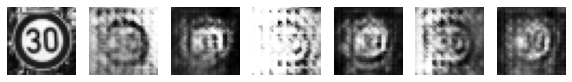

Epoch 5851 g_loss= 0.77224624 d_loss= 1.2541337 real_acc= 0.78 fake_acc= 0.66
Epoch 5852 g_loss= 0.7442791 d_loss= 1.2407067 real_acc= 0.8 fake_acc= 0.56
Epoch 5853 g_loss= 0.76234645 d_loss= 1.2945464 real_acc= 0.66 fake_acc= 0.6
Epoch 5854 g_loss= 0.75371844 d_loss= 1.3006163 real_acc= 0.7 fake_acc= 0.62
Epoch 5855 g_loss= 0.7573246 d_loss= 1.240176 real_acc= 0.78 fake_acc= 0.62
Epoch 5856 g_loss= 0.7826753 d_loss= 1.3260465 real_acc= 0.62 fake_acc= 0.78
Epoch 5857 g_loss= 0.79889184 d_loss= 1.185562 real_acc= 0.76 fake_acc= 0.76
Epoch 5858 g_loss= 0.78852487 d_loss= 1.2816637 real_acc= 0.7 fake_acc= 0.7
Epoch 5859 g_loss= 0.78235495 d_loss= 1.2700181 real_acc= 0.72 fake_acc= 0.78
Epoch 5860 g_loss= 0.81610113 d_loss= 1.2787081 real_acc= 0.64 fake_acc= 0.72


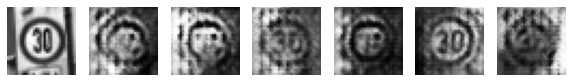

Epoch 5861 g_loss= 0.82014745 d_loss= 1.1660922 real_acc= 0.74 fake_acc= 0.78
Epoch 5862 g_loss= 0.7908914 d_loss= 1.2450583 real_acc= 0.74 fake_acc= 0.76
Epoch 5863 g_loss= 0.82995284 d_loss= 1.211764 real_acc= 0.72 fake_acc= 0.76
Epoch 5864 g_loss= 0.78832275 d_loss= 1.2849655 real_acc= 0.68 fake_acc= 0.78
Epoch 5865 g_loss= 0.86101776 d_loss= 1.2869828 real_acc= 0.52 fake_acc= 0.92
Epoch 5866 g_loss= 0.79743516 d_loss= 1.2923362 real_acc= 0.62 fake_acc= 0.78
Epoch 5867 g_loss= 0.7538688 d_loss= 1.3268797 real_acc= 0.62 fake_acc= 0.66
Epoch 5868 g_loss= 0.7508834 d_loss= 1.2725744 real_acc= 0.76 fake_acc= 0.6
Epoch 5869 g_loss= 0.7458586 d_loss= 1.2893479 real_acc= 0.66 fake_acc= 0.66
Epoch 5870 g_loss= 0.72319525 d_loss= 1.338911 real_acc= 0.68 fake_acc= 0.62


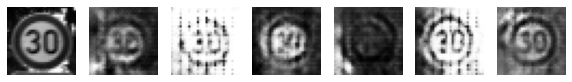

Epoch 5871 g_loss= 0.69732255 d_loss= 1.3160219 real_acc= 0.72 fake_acc= 0.42
Epoch 5872 g_loss= 0.7514843 d_loss= 1.2695677 real_acc= 0.7 fake_acc= 0.6
Epoch 5873 g_loss= 0.76133925 d_loss= 1.3478532 real_acc= 0.5 fake_acc= 0.58
Epoch 5874 g_loss= 0.72484934 d_loss= 1.2757151 real_acc= 0.74 fake_acc= 0.58
Epoch 5875 g_loss= 0.7981263 d_loss= 1.3034489 real_acc= 0.64 fake_acc= 0.7
Epoch 5876 g_loss= 0.7626307 d_loss= 1.3394301 real_acc= 0.6 fake_acc= 0.78
Epoch 5877 g_loss= 0.80195534 d_loss= 1.3200539 real_acc= 0.66 fake_acc= 0.64
Epoch 5878 g_loss= 0.7840055 d_loss= 1.4016639 real_acc= 0.56 fake_acc= 0.68
Epoch 5879 g_loss= 0.75679797 d_loss= 1.3478327 real_acc= 0.6 fake_acc= 0.6
Epoch 5880 g_loss= 0.7676853 d_loss= 1.3572158 real_acc= 0.64 fake_acc= 0.66


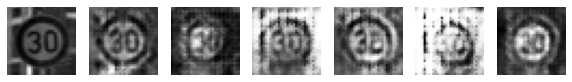

Epoch 5881 g_loss= 0.7355925 d_loss= 1.4987271 real_acc= 0.5 fake_acc= 0.52
Epoch 5882 g_loss= 0.6841257 d_loss= 1.4444656 real_acc= 0.66 fake_acc= 0.44
Epoch 5883 g_loss= 0.65029335 d_loss= 1.4477866 real_acc= 0.68 fake_acc= 0.36
Epoch 5884 g_loss= 0.663429 d_loss= 1.4059513 real_acc= 0.7 fake_acc= 0.32
Epoch 5885 g_loss= 0.6916058 d_loss= 1.4421546 real_acc= 0.6 fake_acc= 0.36
Epoch 5886 g_loss= 0.6793775 d_loss= 1.4510449 real_acc= 0.5 fake_acc= 0.32
Epoch 5887 g_loss= 0.68867636 d_loss= 1.4927571 real_acc= 0.54 fake_acc= 0.3
Epoch 5888 g_loss= 0.7084418 d_loss= 1.3689537 real_acc= 0.66 fake_acc= 0.44
Epoch 5889 g_loss= 0.7314703 d_loss= 1.3895257 real_acc= 0.64 fake_acc= 0.4
Epoch 5890 g_loss= 0.7115716 d_loss= 1.4143817 real_acc= 0.56 fake_acc= 0.4


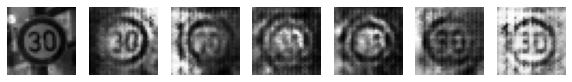

Epoch 5891 g_loss= 0.7051603 d_loss= 1.4500508 real_acc= 0.62 fake_acc= 0.42
Epoch 5892 g_loss= 0.7223718 d_loss= 1.3900174 real_acc= 0.66 fake_acc= 0.38
Epoch 5893 g_loss= 0.6874338 d_loss= 1.4835846 real_acc= 0.44 fake_acc= 0.42
Epoch 5894 g_loss= 0.7247274 d_loss= 1.3843286 real_acc= 0.56 fake_acc= 0.42
Epoch 5895 g_loss= 0.6997795 d_loss= 1.4308012 real_acc= 0.64 fake_acc= 0.42
Epoch 5896 g_loss= 0.7191814 d_loss= 1.3921419 real_acc= 0.6 fake_acc= 0.44
Epoch 5897 g_loss= 0.68182135 d_loss= 1.4555796 real_acc= 0.54 fake_acc= 0.48
Epoch 5898 g_loss= 0.71205306 d_loss= 1.4221663 real_acc= 0.56 fake_acc= 0.5
Epoch 5899 g_loss= 0.7047569 d_loss= 1.4239697 real_acc= 0.58 fake_acc= 0.44
Epoch 5900 g_loss= 0.73985946 d_loss= 1.4064431 real_acc= 0.54 fake_acc= 0.46


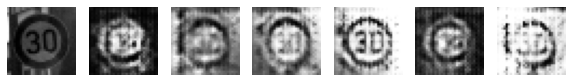

Epoch 5901 g_loss= 0.7242766 d_loss= 1.4106116 real_acc= 0.64 fake_acc= 0.4
Epoch 5902 g_loss= 0.74140227 d_loss= 1.3869276 real_acc= 0.62 fake_acc= 0.54
Epoch 5903 g_loss= 0.79004395 d_loss= 1.4018474 real_acc= 0.46 fake_acc= 0.62
Epoch 5904 g_loss= 0.7371526 d_loss= 1.434993 real_acc= 0.48 fake_acc= 0.6
Epoch 5905 g_loss= 0.8365109 d_loss= 1.3108976 real_acc= 0.58 fake_acc= 0.76
Epoch 5906 g_loss= 0.77301526 d_loss= 1.3740666 real_acc= 0.58 fake_acc= 0.72
Epoch 5907 g_loss= 0.7611808 d_loss= 1.330877 real_acc= 0.58 fake_acc= 0.64
Epoch 5908 g_loss= 0.76730585 d_loss= 1.3306429 real_acc= 0.62 fake_acc= 0.7
Epoch 5909 g_loss= 0.83112544 d_loss= 1.2079389 real_acc= 0.78 fake_acc= 0.78
Epoch 5910 g_loss= 0.8137071 d_loss= 1.2742513 real_acc= 0.68 fake_acc= 0.78


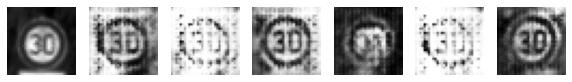

Epoch 5911 g_loss= 0.8214184 d_loss= 1.2920437 real_acc= 0.62 fake_acc= 0.78
Epoch 5912 g_loss= 0.8187592 d_loss= 1.2428527 real_acc= 0.66 fake_acc= 0.8
Epoch 5913 g_loss= 0.8484152 d_loss= 1.2350857 real_acc= 0.72 fake_acc= 0.88
Epoch 5914 g_loss= 0.9198718 d_loss= 1.1904202 real_acc= 0.66 fake_acc= 0.9
Epoch 5915 g_loss= 0.8571701 d_loss= 1.2959778 real_acc= 0.54 fake_acc= 0.9
Epoch 5916 g_loss= 0.84885603 d_loss= 1.2365463 real_acc= 0.6 fake_acc= 0.82
Epoch 5917 g_loss= 0.8467737 d_loss= 1.2784007 real_acc= 0.58 fake_acc= 0.82
Epoch 5918 g_loss= 0.8722793 d_loss= 1.2394956 real_acc= 0.62 fake_acc= 0.86
Epoch 5919 g_loss= 0.8358591 d_loss= 1.1947355 real_acc= 0.78 fake_acc= 0.8
Epoch 5920 g_loss= 0.8896917 d_loss= 1.2040746 real_acc= 0.6 fake_acc= 0.94


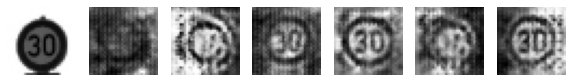

Epoch 5921 g_loss= 0.8257051 d_loss= 1.2393744 real_acc= 0.64 fake_acc= 0.84
Epoch 5922 g_loss= 0.797445 d_loss= 1.2259365 real_acc= 0.76 fake_acc= 0.74
Epoch 5923 g_loss= 0.78022987 d_loss= 1.2599105 real_acc= 0.62 fake_acc= 0.74
Epoch 5924 g_loss= 0.8320419 d_loss= 1.1776087 real_acc= 0.72 fake_acc= 0.82
Epoch 5925 g_loss= 0.8241228 d_loss= 1.1885135 real_acc= 0.74 fake_acc= 0.8
Epoch 5926 g_loss= 0.81610626 d_loss= 1.188274 real_acc= 0.88 fake_acc= 0.76
Epoch 5927 g_loss= 0.8085772 d_loss= 1.2418747 real_acc= 0.64 fake_acc= 0.78
Epoch 5928 g_loss= 0.8410081 d_loss= 1.1637381 real_acc= 0.8 fake_acc= 0.76
Epoch 5929 g_loss= 0.8252262 d_loss= 1.2302227 real_acc= 0.7 fake_acc= 0.82
Epoch 5930 g_loss= 0.87676424 d_loss= 1.186665 real_acc= 0.68 fake_acc= 0.9


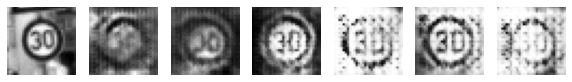

Epoch 5931 g_loss= 0.869488 d_loss= 1.2634778 real_acc= 0.48 fake_acc= 0.82
Epoch 5932 g_loss= 0.89735687 d_loss= 1.232172 real_acc= 0.5 fake_acc= 0.94
Epoch 5933 g_loss= 0.8666714 d_loss= 1.221216 real_acc= 0.64 fake_acc= 0.9
Epoch 5934 g_loss= 0.8547214 d_loss= 1.2046394 real_acc= 0.64 fake_acc= 0.78
Epoch 5935 g_loss= 0.8270923 d_loss= 1.2362742 real_acc= 0.66 fake_acc= 0.84
Epoch 5936 g_loss= 0.90023386 d_loss= 1.1956971 real_acc= 0.66 fake_acc= 0.92
Epoch 5937 g_loss= 0.8211147 d_loss= 1.2303269 real_acc= 0.78 fake_acc= 0.84
Epoch 5938 g_loss= 0.8337666 d_loss= 1.245327 real_acc= 0.56 fake_acc= 0.84
Epoch 5939 g_loss= 0.7583316 d_loss= 1.272615 real_acc= 0.72 fake_acc= 0.74
Epoch 5940 g_loss= 0.74171656 d_loss= 1.2965552 real_acc= 0.68 fake_acc= 0.68


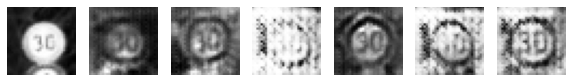

Epoch 5941 g_loss= 0.77466613 d_loss= 1.2256051 real_acc= 0.84 fake_acc= 0.74
Epoch 5942 g_loss= 0.78189856 d_loss= 1.2546428 real_acc= 0.68 fake_acc= 0.74
Epoch 5943 g_loss= 0.81844664 d_loss= 1.2661195 real_acc= 0.62 fake_acc= 0.84
Epoch 5944 g_loss= 0.8220002 d_loss= 1.2857816 real_acc= 0.56 fake_acc= 0.76
Epoch 5945 g_loss= 0.7837169 d_loss= 1.2840626 real_acc= 0.58 fake_acc= 0.8
Epoch 5946 g_loss= 0.794859 d_loss= 1.2896898 real_acc= 0.6 fake_acc= 0.78
Epoch 5947 g_loss= 0.8297275 d_loss= 1.2839174 real_acc= 0.5 fake_acc= 0.76
Epoch 5948 g_loss= 0.8089912 d_loss= 1.2814783 real_acc= 0.64 fake_acc= 0.76
Epoch 5949 g_loss= 0.7616381 d_loss= 1.2864642 real_acc= 0.72 fake_acc= 0.64
Epoch 5950 g_loss= 0.7672336 d_loss= 1.3169374 real_acc= 0.62 fake_acc= 0.7


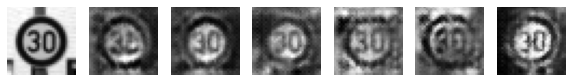

Epoch 5951 g_loss= 0.7535031 d_loss= 1.3176756 real_acc= 0.6 fake_acc= 0.68
Epoch 5952 g_loss= 0.7735648 d_loss= 1.2740796 real_acc= 0.72 fake_acc= 0.72
Epoch 5953 g_loss= 0.7605887 d_loss= 1.3129356 real_acc= 0.7 fake_acc= 0.72
Epoch 5954 g_loss= 0.7929434 d_loss= 1.2662957 real_acc= 0.62 fake_acc= 0.72
Epoch 5955 g_loss= 0.740911 d_loss= 1.3122637 real_acc= 0.66 fake_acc= 0.68
Epoch 5956 g_loss= 0.7787942 d_loss= 1.3010908 real_acc= 0.68 fake_acc= 0.76
Epoch 5957 g_loss= 0.82906306 d_loss= 1.2578666 real_acc= 0.6 fake_acc= 0.78
Epoch 5958 g_loss= 0.833734 d_loss= 1.3264153 real_acc= 0.5 fake_acc= 0.78
Epoch 5959 g_loss= 0.838273 d_loss= 1.2378619 real_acc= 0.66 fake_acc= 0.84
Epoch 5960 g_loss= 0.81943923 d_loss= 1.3296734 real_acc= 0.44 fake_acc= 0.82


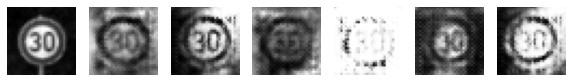

Epoch 5961 g_loss= 0.7965399 d_loss= 1.315336 real_acc= 0.48 fake_acc= 0.82
Epoch 5962 g_loss= 0.76250505 d_loss= 1.3018038 real_acc= 0.7 fake_acc= 0.62
Epoch 5963 g_loss= 0.8242345 d_loss= 1.2837381 real_acc= 0.56 fake_acc= 0.78
Epoch 5964 g_loss= 0.817606 d_loss= 1.2910719 real_acc= 0.54 fake_acc= 0.74
Epoch 5965 g_loss= 0.79031146 d_loss= 1.3429153 real_acc= 0.52 fake_acc= 0.76
Epoch 5966 g_loss= 0.7963532 d_loss= 1.302563 real_acc= 0.56 fake_acc= 0.8
Epoch 5967 g_loss= 0.7408597 d_loss= 1.2808611 real_acc= 0.74 fake_acc= 0.6
Epoch 5968 g_loss= 0.72148967 d_loss= 1.3070908 real_acc= 0.78 fake_acc= 0.56
Epoch 5969 g_loss= 0.76159614 d_loss= 1.3112882 real_acc= 0.66 fake_acc= 0.66
Epoch 5970 g_loss= 0.79177386 d_loss= 1.2866576 real_acc= 0.6 fake_acc= 0.78


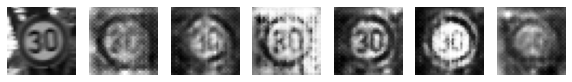

Epoch 5971 g_loss= 0.88225603 d_loss= 1.2354767 real_acc= 0.6 fake_acc= 0.88
Epoch 5972 g_loss= 0.8340911 d_loss= 1.2904606 real_acc= 0.6 fake_acc= 0.84
Epoch 5973 g_loss= 0.787805 d_loss= 1.2840476 real_acc= 0.6 fake_acc= 0.76
Epoch 5974 g_loss= 0.8203744 d_loss= 1.2938253 real_acc= 0.54 fake_acc= 0.82
Epoch 5975 g_loss= 0.7855101 d_loss= 1.2513518 real_acc= 0.72 fake_acc= 0.72
Epoch 5976 g_loss= 0.7386695 d_loss= 1.2398651 real_acc= 0.84 fake_acc= 0.66
Epoch 5977 g_loss= 0.727412 d_loss= 1.3159425 real_acc= 0.78 fake_acc= 0.54
Epoch 5978 g_loss= 0.72263145 d_loss= 1.2958481 real_acc= 0.74 fake_acc= 0.52
Epoch 5979 g_loss= 0.7741699 d_loss= 1.2609644 real_acc= 0.76 fake_acc= 0.68
Epoch 5980 g_loss= 0.7787554 d_loss= 1.2887086 real_acc= 0.62 fake_acc= 0.8


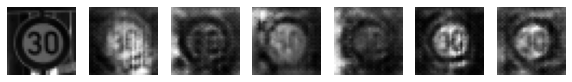

Epoch 5981 g_loss= 0.78566885 d_loss= 1.2464309 real_acc= 0.82 fake_acc= 0.8
Epoch 5982 g_loss= 0.8145334 d_loss= 1.2732053 real_acc= 0.62 fake_acc= 0.76
Epoch 5983 g_loss= 0.83262694 d_loss= 1.2696047 real_acc= 0.7 fake_acc= 0.76
Epoch 5984 g_loss= 0.7584992 d_loss= 1.2608604 real_acc= 0.76 fake_acc= 0.58
Epoch 5985 g_loss= 0.8562612 d_loss= 1.218389 real_acc= 0.7 fake_acc= 0.84
Epoch 5986 g_loss= 0.8068064 d_loss= 1.2626572 real_acc= 0.68 fake_acc= 0.78
Epoch 5987 g_loss= 0.77492315 d_loss= 1.2968888 real_acc= 0.58 fake_acc= 0.64
Epoch 5988 g_loss= 0.6947165 d_loss= 1.3291335 real_acc= 0.68 fake_acc= 0.42
Epoch 5989 g_loss= 0.69383603 d_loss= 1.3294735 real_acc= 0.74 fake_acc= 0.44
Epoch 5990 g_loss= 0.7177674 d_loss= 1.277214 real_acc= 0.84 fake_acc= 0.56


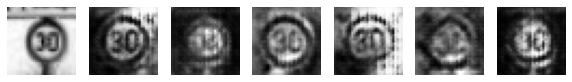

Epoch 5991 g_loss= 0.705582 d_loss= 1.3191416 real_acc= 0.7 fake_acc= 0.5
Epoch 5992 g_loss= 0.72353303 d_loss= 1.2658067 real_acc= 0.86 fake_acc= 0.52
Epoch 5993 g_loss= 0.78555197 d_loss= 1.2588499 real_acc= 0.68 fake_acc= 0.7
Epoch 5994 g_loss= 0.7856629 d_loss= 1.2383547 real_acc= 0.68 fake_acc= 0.72
Epoch 5995 g_loss= 0.8382443 d_loss= 1.2722186 real_acc= 0.62 fake_acc= 0.72
Epoch 5996 g_loss= 0.8671199 d_loss= 1.298268 real_acc= 0.5 fake_acc= 0.76
Epoch 5997 g_loss= 0.7825911 d_loss= 1.3920217 real_acc= 0.48 fake_acc= 0.68
Epoch 5998 g_loss= 0.74602264 d_loss= 1.3688405 real_acc= 0.46 fake_acc= 0.64
Epoch 5999 g_loss= 0.7477509 d_loss= 1.3724489 real_acc= 0.52 fake_acc= 0.6
Done


In [57]:
epochs = 2000
for epoch in range(epochs):
    # take some random samples
    new_samples = sample_from_dataset(50,samples)
    # perform one training step (epoch)
    do_step(new_samples)
    
    if epoch % 10 == 0:
        # show one real image and some fake images generated by generator using noise seed
        #display.clear_output(wait=True)
        num_examples_to_generate = 6
        seed = tf.random.normal([num_examples_to_generate, noise_dim])
        predictions = generator(seed, training=False)
        fig = plt.figure(figsize=(10,10))
        r = random.randrange(len(samples))
        plt.subplot(1, num_examples_to_generate+1, 1)
        plt.imshow(samples[r, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.axis('off')
        for i in range(predictions.shape[0]):
            plt.subplot(1, num_examples_to_generate+1, i+2)
            #plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
            plt.imshow(predictions[i, :, :, 0], cmap='gray')
            plt.axis('off')
        plt.show()    
print("Done")

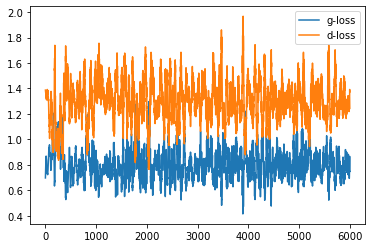

In [58]:
nph = np.array(history)

plt.plot(nph[:,0], label='g-loss')
plt.plot(nph[:,1], label='d-loss')
plt.legend()
plt.show()

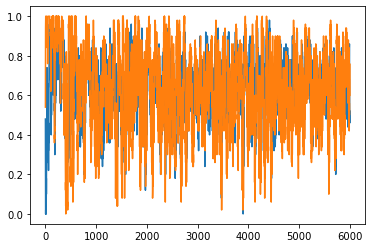

In [59]:
nph = np.array(history)

plt.plot(nph[:,2], label='acc-real')
plt.plot(nph[:,3], label='acc-fake')
plt.show()

In [62]:
generator.save_weights("generator_weights")